# Objects

In [18]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm
from natsort import natsorted
from glob import glob
from monolayer_tracking.segmented_comprehension import Stack, Image

root_directory='F:/my_data/Segmentation/'
server_directory='H:/Segmentation/'

datasets={'good_glass_patterned':[root_directory+'20230508 halo glass lines incubator - good glass/segmented/stage_{}/'.format(i) for i in range(1,15)],
          'good_glass_unpatterned':[root_directory+'20230508 halo glass lines incubator - good glass/segmented/stage_{}/'.format(i) for i in range(16,20)],
          'April_PDMS_patterned':[root_directory+'20230410 halo PDMS lines - good PDMS/segmented/stage_{}/'.format(i) for i in range(3,10)],
          'April_PDMS_unpatterned':[root_directory+'20230410 halo PDMS lines - good PDMS/segmented/stage_{}/'.format(i) for i in range(11,20)],
          'July_PDMS_patterned':[root_directory+'20230728 halo PDMS lines incubator/segmented/stage_{}/'.format(i) for i in range(1,21)],
          'July_PDMS_unpatterned':[root_directory+'20230728 halo PDMS lines incubator/segmented/stage_{}/'.format(i) for i in range(21,41)],
          'August_PDMS_patterned':[root_directory+'20230803 halo PDMS lines incubator/segmented/stage_{}/'.format(i) for i in range(1,21)],
          'August_PDMS_unpatterned':[root_directory+'20230803 halo PDMS lines incubator/segmented/stage_{}/'.format(i) for i in range(21,41)],
          'col_glass':natsorted(glob(root_directory+'20240110 halo col_glass incubator/segmented/*/')),
          'drosophila_WT':[root_directory+'Bellaiche Lab Data/WT/segmented/BIG{}/'.format(obj) for obj in ['_N5m', '1', '5', '6', 'a', 'b']],
          'xenopus_unstretched_ctrl':natsorted(glob(root_directory+'Woolner Lab Data/unstretched_control/segmented/*/')),
          'JD_glass':natsorted(glob(root_directory+'JohnData/180623 star mdck glass/segmented/*/')),
          'JD_glass2':natsorted(glob(root_directory+'JohnData/180627 star mdck glass 2/segmented/*/')),
          'JD_2mgcol':natsorted(glob(root_directory+'JohnData/180626 star mdck 2mg col/segmented/*/')),
          'JD_4mgcol':natsorted(glob(root_directory+'JohnData/180714 star mdck 4mg col/segmented/*/')),
          'JD_2mgcol2':natsorted(glob(root_directory+'JohnData/180930 star mdck 2mg col wt/segmented/*/')),
          'JD_2mgcol3':natsorted(glob(root_directory+'JohnData/181004 star mdck 2mg col wt/segmented/*/')),
          'JD_2mgcolCL':natsorted(glob(root_directory+'JohnData/180629 star mdck crosslinked col 2mg/segmented/*/')),
          'JD_3_2mgcolCL':natsorted(glob(root_directory+'JohnData/180701 star mdck crosslinked col 3 2mg/segmented/*/')),
          'JD_4mgcolCL':natsorted(glob(root_directory+'JohnData/180715 star mdck 4mg cl col/segmented/*/')),
          'acatGFP':natsorted(glob(root_directory+'20240306 acatGFP col_glass sc/segmented/*')),
          'Long_FUCCI':natsorted(glob(root_directory+'20240311 FUCCI halo sorted col_glass high_density/segmented/FUCCI-stage_*')),
         }


'''
I've set up Stack, Image, and Cell classes. 
    Stacks are collections of time lapse images on a single stage.
    Images are individual seg.npy files, presumed to be segmented membranes generated with cellpose.
    Cells are generated for each cell identified by segmentation.
'''

class Dataset:
    ''' a collection of Stack objects, specified as a list of stack locations. (At this point my data storage isn't uniform enough to point to a folder)'''
    def __init__(self,stack_paths, **kwargs):
        if type(stack_paths)==str and stack_paths in datasets.keys(): # a named collection of files
            self.stacks=[Stack(path, **kwargs) for path in tqdm(datasets[stack_paths])]
        else:
            self.stacks=[Stack(path, **kwargs) for path in tqdm(stack_paths)]

In [2]:
stack=Stack(datasets['JD_2mgcol2'][0], load_img=True)

In [23]:
# delete every file after 293 in each folder in datasets['Long_FUCCI']
import os

for folder in tqdm(datasets['Long_FUCCI']):
    for file in natsorted(glob(folder+'/*'))[293:]:
        os.remove(file)

  0%|          | 0/20 [00:00<?, ?it/s]

In [24]:
stacks=[Stack(stack_path, load_img=True) for stack_path in tqdm(datasets['Long_FUCCI'])]

  0%|          | 0/20 [00:00<?, ?it/s]

In [28]:
stack=Stack(r'F:\Heather\FUCCI\20240301 FUCCI colony\segmented', load_img=True)
len(stack.frames)

36

In [29]:
stack.track_centroids()

,cell_number,y,x,frame,particle
0,0,65.441176,2633.250000,0,0
1,4,192.647453,2106.207775,0,1
2,6,188.522124,1119.690265,0,2
3,11,209.753927,1925.363874,0,3
4,12,214.672662,1909.086331,0,4
...,...,...,...,...,...
643629,18152,3610.405275,1871.323678,35,38507
643630,18153,3621.891528,1820.338735,35,40247
643631,18155,3621.476474,1951.094321,35,38508
643632,18149,3599.035200,1585.935680,35,36460


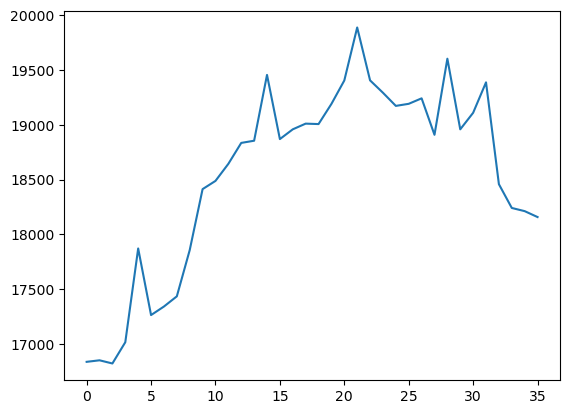

In [32]:
plt.plot([frame.n for frame in stack.frames])

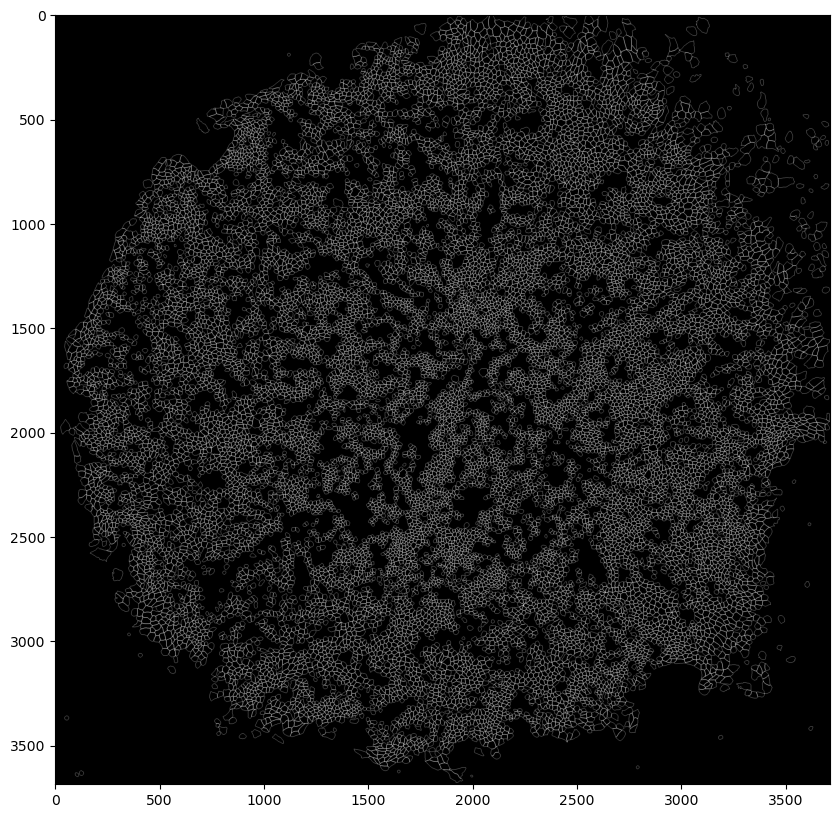

In [24]:
plt.figure(figsize=(10,10))
plt.imshow(stack.frames[-1].outlines.todense()!=0, cmap='gray')

In [26]:
stack.tracked_centroids['particle'].max()

36551

In [25]:
stack.track_centroids()

,cell_number,y,x,frame,particle
0,0,65.441176,2633.250000,0,0
1,4,192.647453,2106.207775,0,1
2,6,188.522124,1119.690265,0,2
3,11,209.753927,1925.363874,0,3
4,12,214.672662,1909.086331,0,4
...,...,...,...,...,...
535555,18952,3609.194497,1578.920052,29,33713
535556,18953,3605.621044,2790.937536,29,15245
535557,18956,3625.588591,1645.994818,29,20457
535558,18957,3633.372277,125.226807,29,15239


In [43]:
from monolayer_tracking.plot_tools import highlight_mitoses

highlight_mitoses(stack, show_labels=False, figsize=12)

  0%|          | 0/36 [00:00<?, ?it/s]

In [44]:
from monolayer_tracking.plot_tools import highlight_mitoses, plot_trajectories

plot_trajectories(stack, show_labels=False, figsize=12)

  0%|          | 0/36 [00:00<?, ?it/s]

In [145]:
from monolayer_tracking import plot_tools
import importlib

plot_tools=importlib.reload(monolayer_tracking.plot_tools)

plot_tools.plot_trajectories(stack, output_path='plots/nuclear_tracking_notext/', show_labels=False, trail_length=20)

  0%|          | 0/54 [00:00<?, ?it/s]

100%|██████████| 54/54 [02:42<00:00,  3.01s/it]


# Analysis

In [6]:
# load all the stacks from acatGFP as a list
stacks = [Stack(file) for file in tqdm(datasets['acatGFP'])]

100%|██████████| 40/40 [00:25<00:00,  1.55it/s]


In [4]:
FUCCI_dataset=[Stack(stack_path) for stack_path in tqdm(natsorted(glob('F:/my_data/Segmentation/20240215 FUCCI halo col_glass test/segmented/FUCCI-stage_*/'))[:5])]

  0%|          | 0/5 [00:00<?, ?it/s]

In [32]:
areas=[[stack.frames[n].cell_areas(scaled=True) for stack in stacks[:-1]] for n in tqdm(np.arange(len(stacks[0].frames)))]

  0%|          | 0/293 [00:00<?, ?it/s]

In [33]:
frame_areas=[np.concatenate(frame_area) for frame_area in areas]

In [35]:
plt.style.use('dark_background')

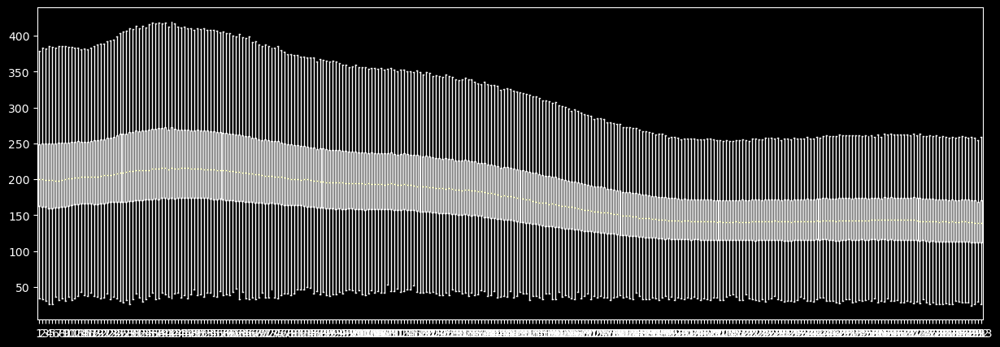

In [37]:
plt.figure(figsize=(15,5))
plt.boxplot(frame_areas, showfliers=False)
plt.show()

In [2]:
stack = Stack('F:/my_data/Segmentation/20240215 FUCCI halo col_glass test/segmented/FUCCI-stage_1/')

In [26]:
for stack in tqdm(FUCCI_dataset):
    for frame in stack.frames:
        frame.measure_FUCCI()

100%|██████████| 10/10 [07:27<00:00, 44.79s/it]


In [3]:
for frame in tqdm(stack.frames):
    frame.measure_FUCCI()

100%|██████████| 134/134 [00:38<00:00,  3.48it/s]


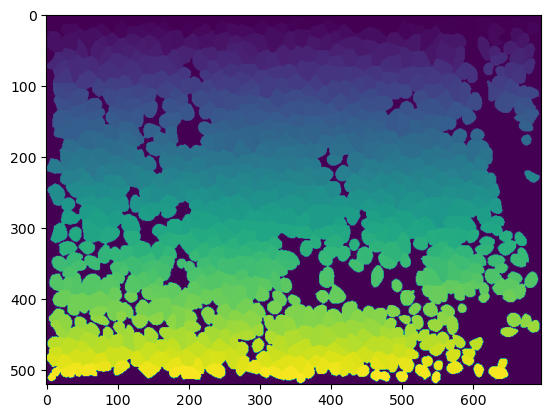

In [74]:
plt.imshow(img.masks)

In [63]:
file_paths=[f'F:/my_data/Segmentation/20240215 FUCCI halo col_glass test/segmented/FUCCI-stage_{n}/FUCCI-stage_{n}-000_seg.npy' for n in range(1,11)]
images=[Image(file_path) for file_path in file_paths]

In [3]:
stack=Stack('F:/my_data/Segmentation/20240215 FUCCI halo col_glass test/segmented/FUCCI-stage_1/')

100%|██████████| 134/134 [08:39<00:00,  3.88s/it]


## Shape Parameter vs. Time

In [ ]:
qs=[]
for substack in [patterned_glass.stacks]:
    q=[]
    for stack in substack:
        q.append(stack.shape_parameters().groupby('frame')['q'].mean()) # get average q for each frame
    q=pd.concat(q).groupby('frame').agg(['mean','std'])
    qs.append(q)

In [ ]:
for q in qs:
    plt.errorbar(q.index.values*10,q['mean'],yerr=q['std'], label='patterned glass', alpha=0.8, capsize=5)
plt.xlabel('time (minutes)')
plt.ylabel('shape parameter $q$')
plt.legend()

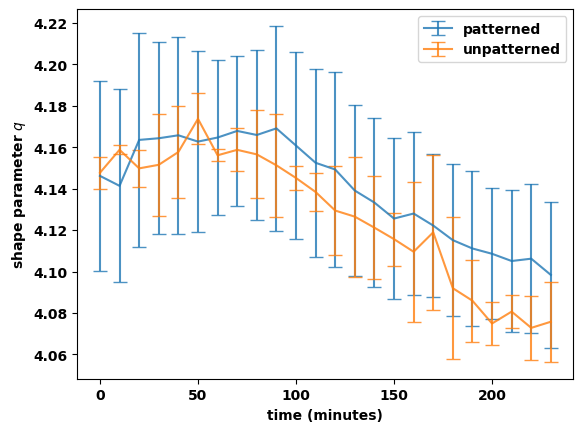

In [44]:
for label, q in zip(['patterned', 'unpatterned'],qs):
    plt.errorbar(q.index.values*10,q['mean'],yerr=q['std'], label=label, alpha=0.8, capsize=5)
plt.xlabel('time (minutes)')
plt.ylabel('shape parameter $q$')
plt.legend()
#plt.savefig('Plots/20230305 q_vs_time_aggregate-patterned_unpatterned.png',dpi=300)
#plt.show()

In [ ]:
# get shape parameter data for John's datasets
for dataset_name in ['180930 wt mdck 2mg col','180629 star mdck crosslinked col 2mg','180714 star mdck 4mg col','180715 star mdck 4mg cl col']:
    stack_paths=[]
    for stage_number in range(1,11):
        stack_paths.append('Segmentation/FromJohn/{}/WT_{}/'.format(dataset_name,stage_number))
    dataset=Dataset(stack_paths)
    q=[]
    for stack in tqdm(dataset.stacks):
        q.append(stack.shape_parameters().groupby('frame')['q'].mean()) # get average q for each frame
    q=pd.concat(q).groupby('frame').agg(['mean','std'])
    qs.append(q)

## Density vs. Time

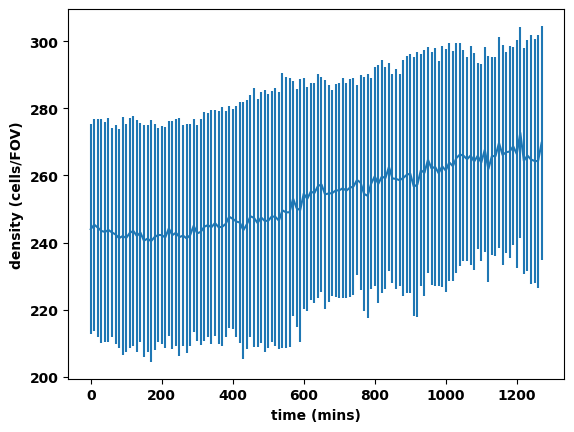

In [4]:
densities=np.array([stack.densities() for stack in patterned_PDMS.stacks]) # get densities for every image in a 2d array (rows=FOVs, columns=time points)

plt.errorbar(x=np.arange(densities.shape[1])*10, y=np.mean(densities,axis=0), yerr=np.std(densities,axis=0))

plt.xlabel('time (mins)')
plt.ylabel('density (cells/FOV)')

plt.savefig('Plots/patterned_PDMS_densityvstime.jpg',dpi=300)

## Angular Ordering

### Ellipse ordering $\theta_E$

In [145]:
# just fitting the first frame of every dataset. This seems fair and no more computationally intensive than necessary.
tqdm._instances.clear()
fit_parameters=[]
for stack in tqdm(patterned_glass.stacks, desc='stack'):
    for frame in [stack.frames[0]]:
        fit_parameters.append(frame.cell_ellipse_parameters())
patterned_fit_parameters=pd.concat(fit_parameters)

fit_parameters=[]
for stack in tqdm(unpatterned_glass.stacks, desc='stack'):
    for frame in [stack.frames[0]]:
        fit_parameters.append(frame.cell_ellipse_parameters())
unpatterned_fit_parameters=pd.concat(fit_parameters)

stack: 100%|█████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00,  6.90it/s]


(0.0, 0.3733832728907566)
(0.0, 0.7531830096392879)


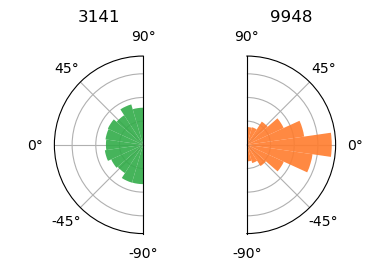

In [148]:
#with plt.style.context('dark_background'):
fig, axes=plt.subplots(1,2, figsize=(4,4), subplot_kw={'projection':'polar'})
axes[0].hist(unpatterned_fit_parameters['theta']%np.pi-np.pi/2, bins=np.linspace(-np.pi/2,np.pi/2,12), alpha=0.9, color='#32AC49', density=True, zorder=2)#, histtype='step', linewidth=2)
axes[1].hist(patterned_fit_parameters['theta']%np.pi-np.pi/2, bins=np.linspace(-np.pi/2,np.pi/2,12), alpha=0.9, color='#FF7C2D', density=True, zorder=2)#, histtype='step', linewidth=2)

for ax in axes:
    ax.set_xlim(-np.pi/2,np.pi/2)
    print(ax.get_ylim())
    ax.set_ylim(0,0.75)
    ax.set_yticklabels([])
axes[0].set_theta_zero_location("W")
axes[0].set_theta_direction(-1)

axes[0].set_title(len(unpatterned_fit_parameters))
axes[1].set_title(len(patterned_fit_parameters))
fig.tight_layout()
plt.savefig('Plots/ASCB 2023/glass-longaxishist.jpg',dpi=300)

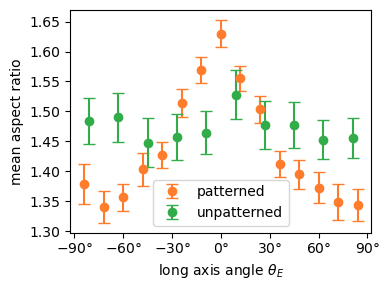

In [149]:
#with plt.style.context('dark_background'):
plt.figure(figsize=(4,3))
patterned_binned_aspect=patterned_fit_parameters.groupby(pd.cut(patterned_fit_parameters['theta'], bins=15))['aspect'].agg(['mean','sem'])
plt.errorbar(patterned_binned_aspect.index.values.categories.mid-np.pi/2, patterned_binned_aspect['mean'],yerr=2*patterned_binned_aspect['sem'], fmt='o', color='#FF7C2D', capsize=4, label='patterned')

unpatterned_binned_aspect=unpatterned_fit_parameters.groupby(pd.cut(unpatterned_fit_parameters['theta'], bins=10))['aspect'].agg(['mean','sem'])
plt.errorbar(unpatterned_binned_aspect.index.values.categories.mid-np.pi/2, unpatterned_binned_aspect['mean'],yerr=2*unpatterned_binned_aspect['sem'], fmt='o', color='#32AC49', capsize=4, label='unpatterned')

plt.xticks(ticks=np.pi*np.array([-1/2,-1/3,-1/6,0,1/6,1/3,1/2]), labels=['$-90\degree$','$-60\degree$','$-30\degree$','$0\degree$','$30\degree$','$60\degree$','$90\degree$'])

plt.xlabel(r'long axis angle $\theta_E$')
plt.ylabel('mean aspect ratio')
#plt.ylim(0,5)
plt.legend()
plt.tight_layout()
#plt.savefig('Plots/10-26 Woolner Lab Meeting/shape_legend.jpg', dpi=300)

(-1.5707963267948966, 1.5707963267948966)

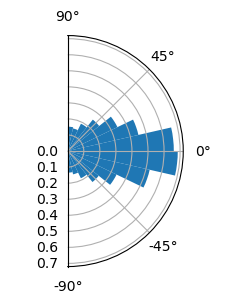

In [96]:
fig, ax=plt.subplots(1,1, figsize=(3,3), subplot_kw={'projection':'polar'})
plt.hist(patterned_fit_parameters['theta']-np.pi/2, bins=np.linspace(-np.pi/2,np.pi/2,15), alpha=1, color='C0', density=True)#, histtype='step', linewidth=2)
#plt.hist(unpatterned_fit_parameters['theta']-np.pi/2, bins=np.linspace(-np.pi/2,np.pi/2,20), alpha=1, color='C1', density=True, histtype='step', linewidth=2)
#print(len(patterned_fit_parameters))
#print(len(unpatterned_fit_parameters))
plt.xlim(-np.pi/2,np.pi/2)

#plt.ylim(0.0, 0.75)
#plt.savefig('Plots/PDMS-longaxishist-unpatterned.jpg',dpi=300)

### Perimeter ordering $\theta_P$

In [146]:
cell.fit_ellipse()

False

In [150]:
# just fitting the first frame of every dataset. This seems fair and no more computationally intensive than necessary.
tqdm._instances.clear()
thetas=[]
circs=[]
aspects=[]
for stack in tqdm(patterned_glass.stacks, desc='stack'):
    for frame in [stack.frames[0]]:
        for cell in frame.cells:
            thetas.append(cell.perimeter_axis())
            circs.append(cell.circ_P)
            if cell.fit_ellipse():
                aspects.append(cell.aspect)
            else:
                aspects.append(np.nan)
patterned_thetas=np.array(thetas)
patterned_circs=np.array(circs)
patterned_aspects=np.array(aspects)

thetas=[]
circs=[]
aspects=[]
for stack in tqdm(unpatterned_glass.stacks, desc='stack'):
    for frame in [stack.frames[0]]:
        for cell in frame.cells:
            thetas.append(cell.perimeter_axis())
            circs.append(cell.circ_P)
            if cell.fit_ellipse():
                aspects.append(cell.aspect)
            else:
                aspects.append(np.nan)
unpatterned_thetas=np.array(thetas)
unpatterned_circs=np.array(circs)
unpatterned_aspects=np.array(aspects)

stack: 100%|████████████████████| 4/4 [00:12<00:00,  3.09s/it]


(0.0, 0.3593375071393802)
(0.0, 0.7394346014705993)


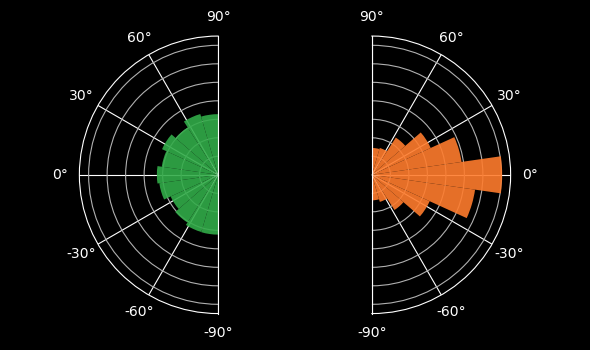

In [148]:
with plt.style.context('dark_background'):
    fig, axes=plt.subplots(1,2, figsize=(6,4), subplot_kw={'projection':'polar'})
    axes[0].hist(unpatterned_thetas%np.pi-np.pi/2, bins=np.linspace(-np.pi/2,np.pi/2,12), alpha=0.9, color='#32AC49', density=True, zorder=2)#, histtype='step', linewidth=2)
    axes[1].hist(patterned_thetas%np.pi-np.pi/2, bins=np.linspace(-np.pi/2,np.pi/2,12), alpha=0.9, color='#FF7C2D', density=True, zorder=2)#, histtype='step', linewidth=2)

    for ax in axes:
        ax.set_xlim(-np.pi/2,np.pi/2)
        print(ax.get_ylim())
        ax.set_ylim(0,0.75)
    axes[0].set_theta_zero_location("W")
    axes[0].set_theta_direction(-1)
    
    fig.tight_layout()
    #plt.savefig('Plots/10-26 Woolner Lab Meeting/glass-longaxishist.jpg',dpi=300)

(0.0, 5.0)

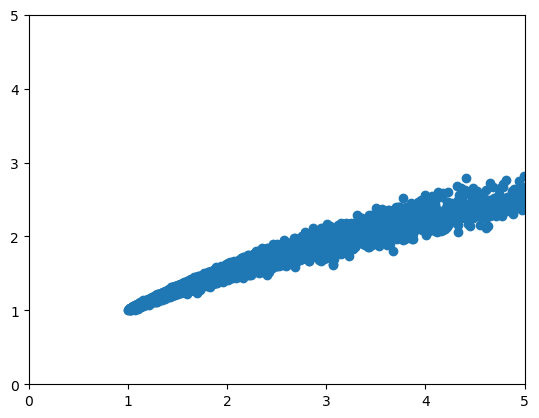

In [160]:
plt.scatter(1/(patterned_circs), patterned_aspects)
plt.xlim(0,5)
plt.ylim(0,5)

In [149]:
patterned_fit_parameters=pd.DataFrame(np.array([patterned_thetas%np.pi, patterned_circs]).T, columns=['theta','aspect'])

([<matplotlib.axis.XTick at 0x245b5b971d0>,
 [Text(-1.5707963267948966, 0, '$-90\\degree$'),
  Text(-1.0471975511965976, 0, '$-60\\degree$'),
  Text(-0.5235987755982988, 0, '$-30\\degree$'),
  Text(0.0, 0, '$0\\degree$'),
  Text(0.5235987755982988, 0, '$30\\degree$'),
  Text(1.0471975511965976, 0, '$60\\degree$'),
  Text(1.5707963267948966, 0, '$90\\degree$')])

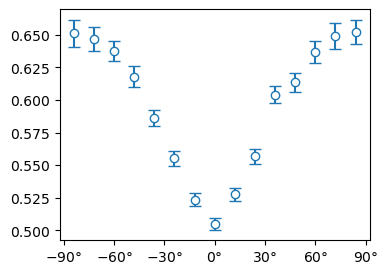

In [139]:
plt.figure(figsize=(4,3))
patterned_binned_aspect=patterned_fit_parameters.groupby(pd.cut(patterned_fit_parameters['theta'], bins=15))['aspect'].agg(['mean','sem'])
plt.errorbar(patterned_binned_aspect.index.values.categories.mid-np.pi/2, patterned_binned_aspect['mean'],yerr=patterned_binned_aspect['sem'], fmt='o', markerfacecolor='white', capsize=4, label='patterned')

#unpatterned_binned_aspect=unpatterned_fit_parameters.groupby(pd.cut(unpatterned_fit_parameters['theta'], bins=10))['aspect'].agg(['mean','std'])
#plt.errorbar(unpatterned_binned_aspect.index.values.categories.mid-np.pi/2, unpatterned_binned_aspect['mean'],yerr=unpatterned_binned_aspect['std'], fmt='o', markerfacecolor='white', capsize=4, label='unpatterned')

plt.xticks(ticks=np.pi*np.array([-1/2,-1/3,-1/6,0,1/6,1/3,1/2]), labels=['$-90\degree$','$-60\degree$','$-30\degree$','$0\degree$','$30\degree$','$60\degree$','$90\degree$'])

#plt.savefig('Plots/Physics 335 Report/PDMS-binned-aspect-ratios.jpg', dpi=300)

## Tracking
uses trackpy package.

### Demo: Linking tracked data to cell objects
could probably delete this now

In [3]:
stage_number=1
stack_location="Segmentation/20230305 MDCK Coverslip Lines 4h/edited_stacks/segmented/reduced-stage_{}/".format(stage_number)
stack=Stack(stack_location)

In [ ]:
# demo: linking tracking data to Cell objects
for frame_number, frame in particle_1.groupby('frame'):
    print(frame.index[0])
    print(stack.frames[frame_number].cells[frame.index[0]].centroid)
    plt.figure(figsize=(6,9))
    plt.imshow(stack.frames[frame_number].img,cmap='gray')
    plt.quiver(frame.x, frame.y, frame.dx, -frame.dy, pivot='middle', headwidth=2, headlength=3, color='red')
    plt.plot(cell_outline[:,0],cell_outline[:,1], color='lime')
    plt.axis('off')
    plt.show()
    plt.close()

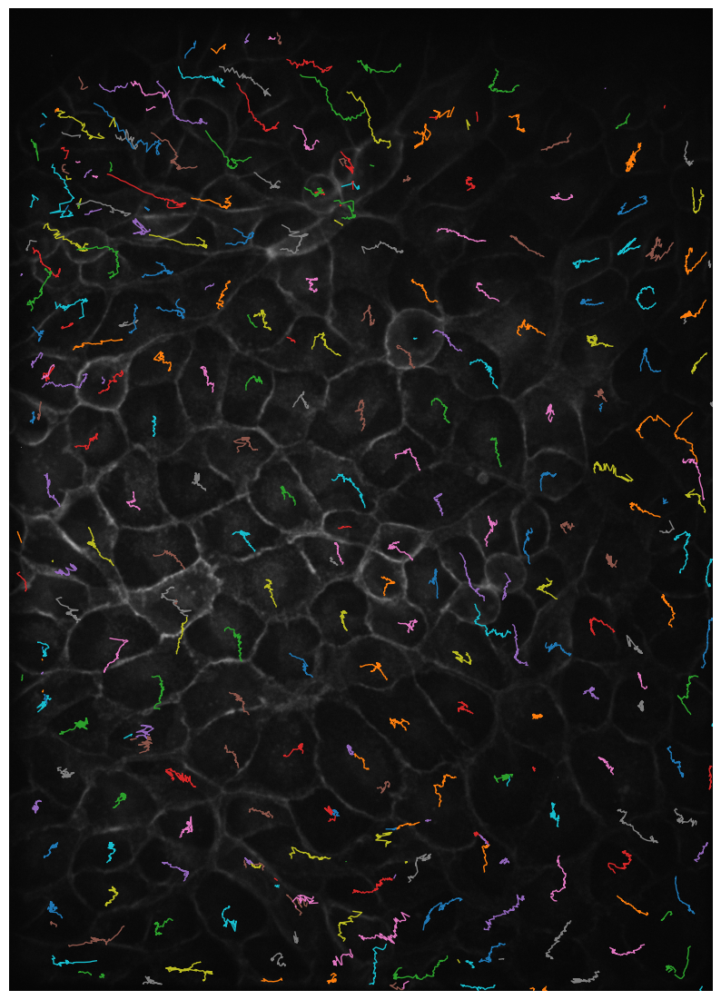

In [21]:
import matplotlib.patheffects as patheffects
from matplotlib import collections

plt.figure(figsize=(10,15))
ax=plt.axes()

frame=unpatterned_PDMS.stacks[1].frames[0]
trajectories=unpatterned_PDMS.stacks[1].tracked_centroids
n=72

plt.imshow(frame.img, cmap='gray')
trails=[] # particle trajectories as plotted on each frame
for particle, trajectory in trajectories[trajectories.frame<=n].groupby('particle'): # get tracking data up to the current frame for one particle at a time
    trails.append(Polygon(trajectory[['x','y']], closed=False, fc='None', ec='C{}'.format(particle)))

    in_frame=trajectory.index[trajectory['frame']==n] # get the cell number of the particle in this frame

# draw trails
ax.add_artist(collections.PatchCollection(trails, match_original=True))

# cosmetics
plt.xlim(0,frame.resolution[1])
plt.ylim(frame.resolution[0],0)
plt.axis('off')

plt.savefig('Plots/Physics 335 Report/PDMS-unpatterned-trajectories-s12t72.jpg',dpi=300)

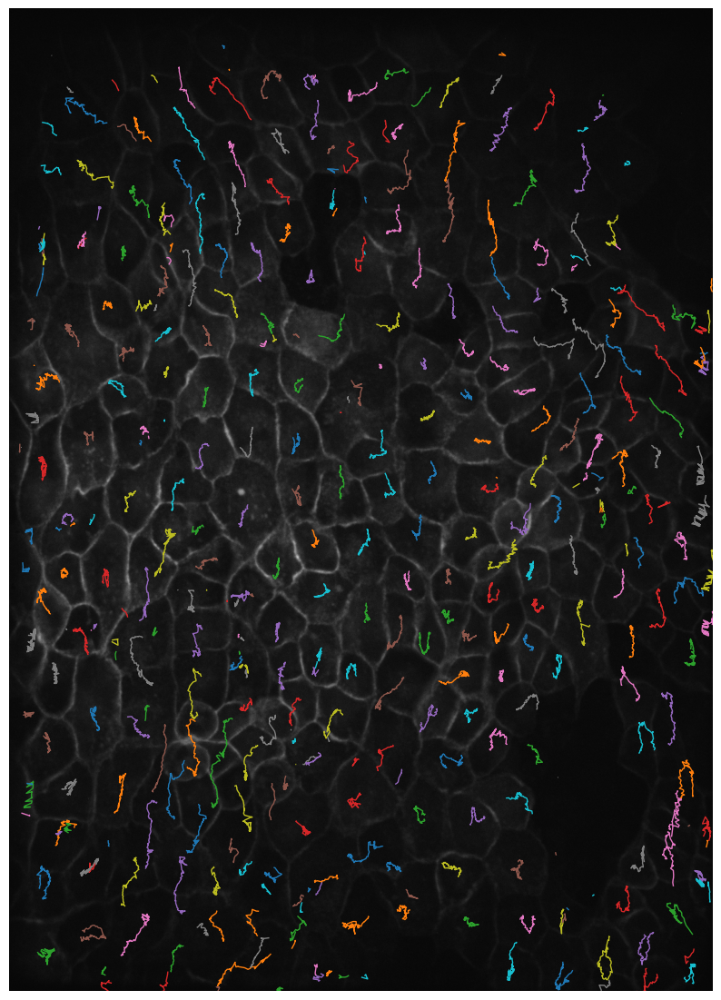

In [19]:
import matplotlib.patheffects as patheffects
from matplotlib import collections

plt.figure(figsize=(10,15))
ax=plt.axes()

frame=patterned_PDMS.stacks[2].frames[0]
trajectories=patterned_PDMS.stacks[2].tracked_centroids
n=72

plt.imshow(frame.img, cmap='gray')
trails=[] # particle trajectories as plotted on each frame
for particle, trajectory in trajectories[trajectories.frame<=n].groupby('particle'): # get tracking data up to the current frame for one particle at a time
    trails.append(Polygon(trajectory[['x','y']], closed=False, fc='None', ec='C{}'.format(particle)))

    in_frame=trajectory.index[trajectory['frame']==n] # get the cell number of the particle in this frame


# draw trails
ax.add_artist(collections.PatchCollection(trails, match_original=True))

# cosmetics
plt.xlim(0,frame.resolution[1])
plt.ylim(frame.resolution[0],0)
plt.axis('off')

plt.savefig('Plots/Physics 335 Report/PDMS-patterned-trajectories-s5t72.jpg',dpi=300)


### Speed vs. Time

In [42]:
v=[]
for stack in dataset.stacks:
    v.append(stack.get_velocities().groupby('frame')['v'].mean()*6.45/200) # get average v for each frame

v=pd.concat(v).groupby('frame').agg(['mean','std']) # get average and error over all FOVs

(0.015, 0.18)

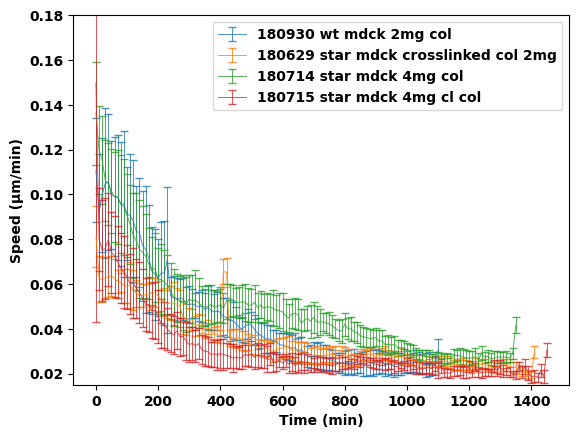

In [59]:
# read and plot John's Data from a csv so I don't have to read multiple big segmentation data files each time 
for dataset_name in ['180930 wt mdck 2mg col','180629 star mdck crosslinked col 2mg','180714 star mdck 4mg col','180715 star mdck 4mg cl col']:
    tracked_data=pd.read_csv('Segmentation/FromJohn/{}/q_vs_v.csv'.format(dataset_name))
    v=tracked_data.groupby('frame')['v'].agg(['mean','std']) # bin data by speed
    #plt.plot(q['mean'],v, linewidth=0.7, label=dataset_name, alpha=0.8)
    plt.errorbar(v.index.values*10,v['mean'], yerr=v['std'], fmt='', markersize=4, capsize=3, linewidth=0.7, label=dataset_name, alpha=0.8)
plt.xlabel('Time (min)')
plt.ylabel('Speed (μm/min)')
plt.legend()
plt.ylim(0.015,0.18)
#plt.savefig('Plots/v_vs_q-AllJohnsData.jpg',dpi=300)

In [5]:
stack=Stack('Segmentation/20230508 halo glass lines incubator - good glass/segmented/stage_3/')

In [6]:
v=stack.get_velocities().groupby('frame')['v'].mean()*6.45/200

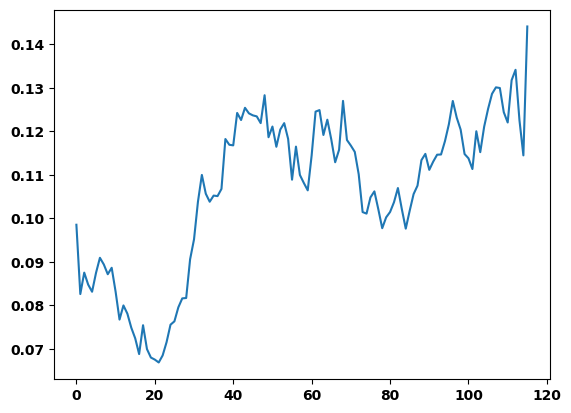

In [8]:
plt.plot(v)

<ErrorbarContainer object of 3 artists>

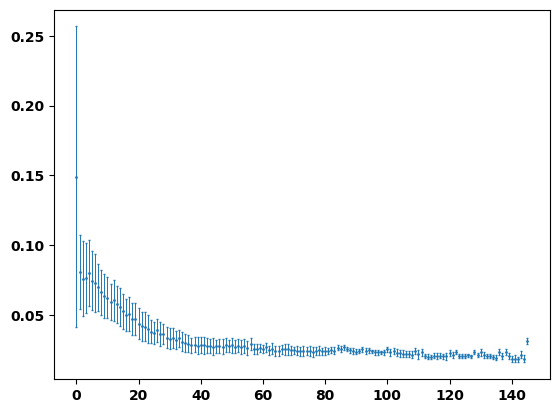

In [48]:
plt.errorbar(v.index.values,v['mean'], yerr=v['std'], fmt='.', markersize=2,capsize=1, linewidth=0.7)

### TODO: Speed vs. Density

### Speed vs. Shape Parameter

In [ ]:
# velocity vs. shape parameter for individual cells
q_vs_v=[]
for stage_number in range(15,17):
    stack_location="Data/20230305 Coverslip Lines - Death after 6h/edited_stacks/segmented/reduced-stage_{}/".format(stage_number)
    stack=Stack(stack_location)
    tracked_data=stack.get_velocities().merge(stack.shape_parameters(), on=['cell_number','frame'])[['v','q']] # pull velocity data
    tracked_data['v']*=6.45/200 # μm/minute conversion
    
    q_vs_v.append(tracked_data)

In [ ]:
# avg velocity vs. avg shape parameter at the frame level
q_vs_v=[]
#stack_location='Data/FromJohn/180930 wt mdck 2mg col/1/segmented/' # John's data
#stack_location="Data/20230305 Coverslip Lines - Death after 6h/edited_stacks/segmented/reduced-stage_{}/"
for stage_number in tqdm(range(1,11)):
    stack_location='Data/FromJohn/180930 wt mdck 2mg col/{}/segmented/'.format(stage_number) # DIRECTORY GOES HERE
    stack=Stack(stack_location)
    tracked_data=stack.get_velocities().merge(stack.shape_parameters(), on=['cell_number','frame']).groupby('frame')[['v','q']].mean() # pull velocity data
    tracked_data['v']*=6.45/200 # μm/minute conversion
    
    q_vs_v.append(tracked_data)
tracked_data=pd.concat(q_vs_v)

Text(0, 0.5, 'Cell Speed (μm/min)')

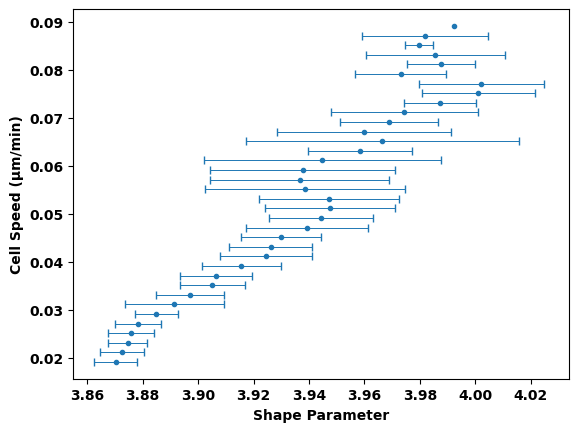

In [24]:
bins=np.arange(tracked_data['v'].min(),0.09,0.002)
q=tracked_data.groupby(pd.cut(tracked_data['v'],bins))['q'].agg(['mean','std'])
v=bins[:-1]+np.diff(bins)

plt.xlim(3.855,4.034)
plt.errorbar(q['mean'],v,xerr=q['std'],fmt='.',capsize=3,linewidth=0.7)
plt.xlabel('Shape Parameter')
plt.ylabel('Cell Speed (μm/min)')

#plt.savefig('Plots/v_vs_q-JohnsData.jpg',dpi=300)

Text(0, 0.5, 'Speed (μm/min)')

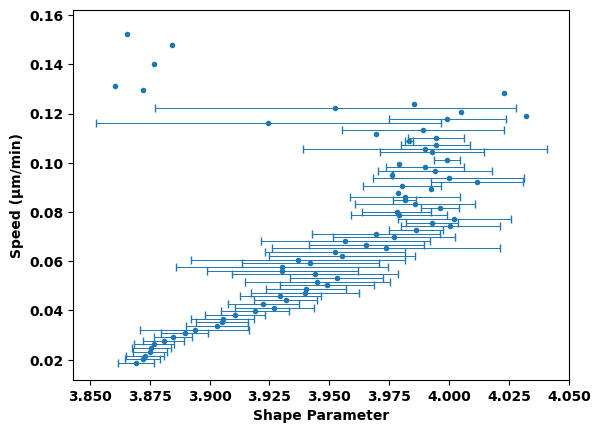

In [5]:
bins=np.arange(tracked_data['v'].min(),tracked_data['v'].max(),0.001)
q=tracked_data['q'].groupby(pd.cut(tracked_data['v'],bins)).agg(['mean','std']) # bin data by speed
v=bins[:-1]+np.diff(bins)
plt.errorbar(q['mean'],v,xerr=q['std'], fmt='.', capsize=3, linewidth=0.7)
plt.xlabel('Shape Parameter')
plt.ylabel('Speed (μm/min)')
#plt.xlim(4.02,4.26)
#plt.savefig('Plots/v_vs_q-aggregated.jpg',dpi=300)

In [ ]:
# get shape parameter data for John's datasets
all_q_vs_v=[]
for dataset_name in ['180714 star mdck 4mg col','180715 star mdck 4mg cl col']:#['180930 wt mdck 2mg col','180629 star mdck crosslinked col 2mg','180714 star mdck 4mg col','180715 star mdck 4mg cl col']:
    # get dataset
    stack_paths=[]
    for stage_number in range(1,11):
        stack_paths.append('Segmentation/FromJohn/{}/WT_{}/'.format(dataset_name,stage_number))
    dataset=Dataset(stack_paths)
    
    # calculate q vs. v for dataset
    q_vs_v=[]
    for stack in tqdm(dataset.stacks):
        tracked_data=stack.get_velocities().merge(stack.shape_parameters(), on=['cell_number','frame']).groupby('frame')[['v','q']].mean() # pull velocity data
        tracked_data['v']*=6.45/200 # μm/minute conversion
        q_vs_v.append(tracked_data)

    all_q_vs_v.append(pd.concat(q_vs_v))

In [3]:
for q_vs_v, dataset_name in zip(all_q_vs_v,['180714 star mdck 4mg col','180715 star mdck 4mg cl col']):
    q_vs_v.to_csv('Segmentation/FromJohn/{}/q_vs_v.csv'.format(dataset_name))

(3.82, 4.2)

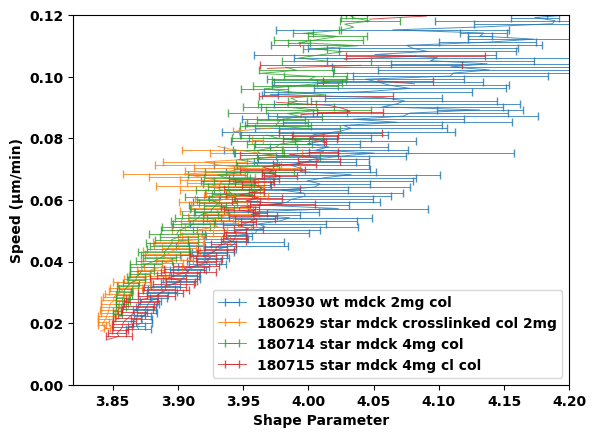

In [26]:
for dataset_name in ['180930 wt mdck 2mg col','180629 star mdck crosslinked col 2mg','180714 star mdck 4mg col','180715 star mdck 4mg cl col']:
    tracked_data=pd.read_csv('Segmentation/FromJohn/{}/q_vs_v.csv'.format(dataset_name))
    bins=np.arange(tracked_data['v'].min(),tracked_data['v'].max(),0.001)
    q=tracked_data['q'].groupby(pd.cut(tracked_data['v'],bins)).agg(['mean','std']) # bin data by speed
    v=bins[:-1]+np.diff(bins)
    #plt.plot(q['mean'],v, linewidth=0.7, label=dataset_name, alpha=0.8)
    plt.errorbar(q['mean'],v,xerr=q['std'], fmt='', markersize=4, capsize=3, linewidth=0.7, label=dataset_name, alpha=0.8)
plt.xlabel('Shape Parameter')
plt.ylabel('Speed (μm/min)')
plt.legend()
plt.ylim(0,0.12)
plt.xlim(3.82,4.2)
#plt.xlim(4.02,4.26)
#plt.savefig('Plots/v_vs_q-AllJohnsData.jpg',dpi=300)

### Angular Distribution of Velocities
TODO: weight by velocity magnitude

In [7]:
%%timeit
stack.get_velocities()

7.28 s ± 114 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [4]:
for dataset in tqdm([April_patterned_PDMS, July_patterned_PDMS, August_patterned_PDMS]):
    for stack in dataset.stacks:
        stack.get_velocities(from_csv=True)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:03<00:00,  1.27s/it]


 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                                   | 2/3 [00:01<00:00,  1.66it/s]


Text(0, 0.5, 'order parameter')

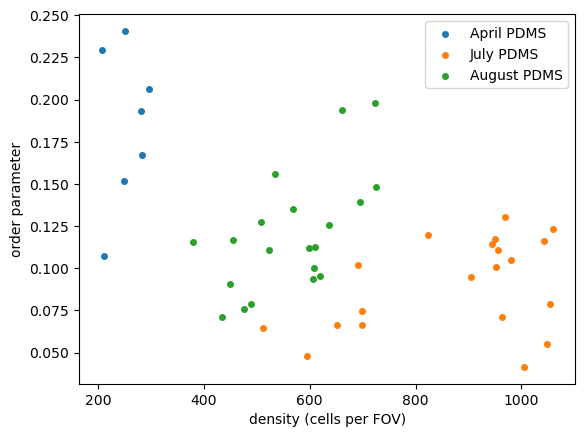

In [21]:
for label, dataset in zip(['April PDMS', 'July PDMS', 'August PDMS'], tqdm([April_patterned_PDMS, July_patterned_PDMS, August_patterned_PDMS])):
    all_order_params=[]
    all_densities=[]
    density_err=[]
    order_err=[]
    for stack in dataset.stacks:
        order_params=[]
        density=[]
        for frame, v in stack.velocities.groupby('frame'):
            order_params.append(np.mean(np.real(np.exp(2j*v['theta']))))
            density.append(stack.frames[frame].density)
        all_order_params.append(np.mean(order_params))
        all_densities.append(np.mean(density))
        
        order_err.append(np.std(order_params))
        density_err.append(np.std(density))

    plt.scatter(all_densities, -np.array(all_order_params), s=16, label=label)#, c=range(1, all_v.frame.max()+2), cmap='inferno')
#
plt.legend()
plt.xlabel('density (cells per FOV)')
plt.ylabel('order parameter')

#axes[0].set_xlabel(r'cell velocity direction $\theta$')
#axes[0].set_ylabel(r'$P(\theta)$')
#axes[1].set_xlabel('time (min)')
#axes[1].set_ylabel('order parameter')

In [ ]:
for stack in tqdm(patterned_PDMS.stacks):
    stack.get_velocities(to_csv=True)
    
for stack in tqdm(unpatterned_PDMS.stacks):
    stack.get_velocities(to_csv=True)

In [6]:
# velocity file paths
patterned_glass=natsorted(glob('F:/Cell Stretcher Project/Segmentation/20230508 halo glass lines incubator - good glass/tracking/*.csv'))[:14]
unpatterned_glass=natsorted(glob('F:/Cell Stretcher Project/Segmentation/20230508 halo glass lines incubator - good glass/tracking/*.csv'))[14:]
patterned_PDMS=natsorted(glob('F:/Cell Stretcher Project/Segmentation/20230410 halo PDMS lines - good PDMS/tracking/*.csv'))[:7]
unpatterned_PDMS=natsorted(glob('F:/Cell Stretcher Project/Segmentation/20230410 halo PDMS lines - good PDMS/tracking/*.csv'))[7:]
patterned_PDMS_new=natsorted(glob('F:/Cell Stretcher Project/Segmentation/20230728 halo PDMS lines incubator/tracking/*.csv'))[:20]
unpatterned_PDMS_new=natsorted(glob('F:/Cell Stretcher Project/Segmentation/20230728 halo PDMS lines incubator/tracking/*.csv'))[20:]
patterned_PDMS_August=natsorted(glob('F:/Cell Stretcher Project/Segmentation/20230803 halo PDMS lines incubator/tracking/*.csv'))[:20]
unpatterned_PDMS_August=natsorted(glob('F:/Cell Stretcher Project/Segmentation/20230803 halo PDMS lines incubator/tracking/*.csv'))[20:]

In [11]:
all_data=[]
for stack_paths in tqdm([patterned_glass, unpatterned_glass, patterned_PDMS, unpatterned_PDMS, patterned_PDMS_new, unpatterned_PDMS_new, patterned_PDMS_August, unpatterned_PDMS_August]):
    vs=[]
    for path in stack_paths:
        v=pd.read_csv(path, usecols=['theta'])
        vs.append(v['theta'])
    all_data.append(np.concatenate(vs))

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:06<00:00,  1.33it/s]


(-0.10294, 0.2838)

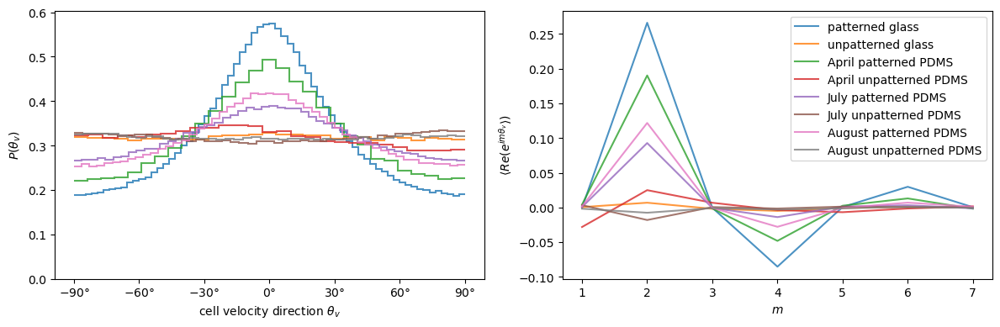

In [12]:
labels=['patterned glass', 'unpatterned glass', 'April patterned PDMS', 'April unpatterned PDMS', 'July patterned PDMS', 'July unpatterned PDMS', 'August patterned PDMS', 'August unpatterned PDMS']
fig, axes = plt.subplots(1,2, figsize=(12,4))

for theta_v, name in zip(all_data, labels):
    # freedman-diaconis rule
    iqr = np.subtract(*np.percentile(np.abs(theta_v)-np.pi/2, [75, 25]))
    bin_width = 5*iqr*len(theta_v)**(-1/3)
    num_bins=int(np.pi/bin_width)
    
    # plot histogram
    patches=axes[0].hist(np.abs(theta_v)-np.pi/2, bins=num_bins, density=True, histtype='step', linewidth=1.5, alpha=0.8, label=name)[2]
    patches[0].set_xy(patches[0].get_xy()[1:-1])
    
    # order parameter
    order_params=[]
    for m in range(1,8):
        order_params.append(-np.mean(np.real(np.exp(1j*m*theta_v))))
    axes[1].plot(range(1,8), order_params, alpha=0.8, label=name)
    
axes[1].legend()

axes[0].set_xlabel(r'cell velocity direction $\theta_v$')
axes[0].set_ylabel(r'$P(\theta_v)$')
axes[0].set_xticks(ticks=np.pi*np.array([-1/2,-1/3,-1/6,0,1/6,1/3,1/2]), labels=['$-90\degree$','$-60\degree$','$-30\degree$','$0\degree$','$30\degree$','$60\degree$','$90\degree$'])

axes[1].set_xlabel('$m$')
axes[1].set_ylabel(r'$\langle Re(e^{im\theta_v}\rangle)$')

fig.tight_layout()

axes[0].set_ylim(0,0.60379)
axes[1].set_ylim(-0.10294,0.2838)
#plt.savefig('Plots/7-19 lab meeting/order_parameter_oldPDMS.jpg', dpi=300)

In [9]:
all_order_params=[]
for stack_paths in tqdm([patterned_glass, unpatterned_glass, patterned_PDMS, unpatterned_PDMS, patterned_PDMS_new, unpatterned_PDMS_new, patterned_PDMS_August, unpatterned_PDMS_August]):
    order_params=[]
    for stack_path in stack_paths:
        theta_v=np.array(pd.read_csv(stack_path, usecols=['theta']))
        order_params.append(-np.mean(np.real(np.exp(2j*theta_v))))
    all_order_params.append(order_params)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:06<00:00,  1.19it/s]


In [111]:
labels=['patterned glass', 'unpatterned glass', 'April patterned PDMS', 'April unpatterned PDMS', 'July patterned PDMS', 'July unpatterned PDMS']

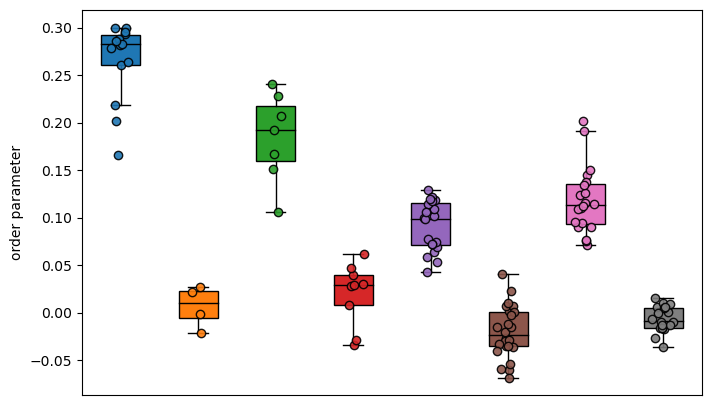

In [14]:
plt.figure(figsize=(8,5))
bplot=plt.boxplot(all_order_params, patch_artist=True, showfliers=False, zorder=0)
for patch, color in zip(bplot['boxes'], ['C{}'.format(n) for n in range(8)]):
    patch.set_facecolor(color)
for patch in bplot['medians']:
    patch.set_color('k')

for n, order_params in zip(range(1,9),all_order_params):
    x = np.random.normal(n, 0.05, size=len(order_params))
    plt.scatter(x, order_params, alpha=0.9, ec='k')

plt.gca().axes.xaxis.set_visible(False)
plt.ylabel('order parameter')
fig.tight_layout()

#plt.savefig('plots/orderparam_boxplot.jpg', dpi=300)

In [171]:
for stack_paths, label, n in zip(tqdm([patterned_glass, unpatterned_glass, patterned_PDMS, unpatterned_PDMS, patterned_PDMS_new, unpatterned_PDMS_new]), labels, range(6)):
    fig=plt.figure(figsize=(6,2.5))
    for i, stack_path in enumerate(stack_paths):
        theta_v=np.array(pd.read_csv(stack_path, usecols=['theta']))

        iqr = np.subtract(*np.percentile(np.abs(theta_v)-np.pi/2, [75, 25]))
        bin_width = 2*iqr*len(theta_v)**(-1/3)
        num_bins=int(np.pi/bin_width)
        patches=plt.hist(np.abs(theta_v)-np.pi/2, bins=num_bins, density=True, histtype='step', linewidth=1.5, alpha=1-0.5*(i/len(stack_paths)), label=name, color='C{}'.format(n))[2]

        patches[0].set_xy(patches[0].get_xy()[1:-1])
    
    plt.xlabel(r'cell velocity direction $\theta_v$')
    plt.ylabel(r'$P(\theta_v)$')
    plt.xticks(ticks=np.pi*np.array([-1/2,-1/3,-1/6,0,1/6,1/3,1/2]), labels=['$-90\degree$','$-60\degree$','$-30\degree$','$0\degree$','$30\degree$','$60\degree$','$90\degree$'])
    plt.ylim(0,0.68)
    fig.tight_layout()
    
    plt.savefig('theta_v-{}.jpg'.format(label), dpi=300)
    plt.close()

100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:14<00:00,  2.47s/it]


 10%|████████▎                                                                          | 2/20 [00:00<00:01, 11.48it/s]

20230709 halo PDMS incubator/stage_1.tif -0.20945591801564056
20230709 halo PDMS incubator/stage_2.tif -0.11913744034067972
20230709 halo PDMS incubator/stage_3.tif -0.15770930863358165


 30%|████████████████████████▉                                                          | 6/20 [00:00<00:01, 11.03it/s]

20230709 halo PDMS incubator/stage_4.tif -0.02834203115418116
20230709 halo PDMS incubator/stage_5.tif -0.096161432742841
20230709 halo PDMS incubator/stage_6.tif -0.06481801310113612


 40%|█████████████████████████████████▏                                                 | 8/20 [00:00<00:01, 11.41it/s]

20230709 halo PDMS incubator/stage_7.tif 0.023694506972351745
20230709 halo PDMS incubator/stage_8.tif -0.07511674128717764
20230709 halo PDMS incubator/stage_9.tif 0.012344097704371356


 60%|█████████████████████████████████████████████████▏                                | 12/20 [00:01<00:00, 12.12it/s]

20230709 halo PDMS incubator/stage_10.tif -0.029749860547776976
20230709 halo PDMS incubator/stage_11.tif 0.030958809814965394
20230709 halo PDMS incubator/stage_12.tif 0.06566909199465744


 80%|█████████████████████████████████████████████████████████████████▌                | 16/20 [00:01<00:00, 13.17it/s]

20230709 halo PDMS incubator/stage_13.tif 0.028686554445638838
20230709 halo PDMS incubator/stage_14.tif 0.06297281688932035
20230709 halo PDMS incubator/stage_15.tif -0.02486406206319376
20230709 halo PDMS incubator/stage_16.tif -0.0024926148004590968


100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 13.77it/s]

20230709 halo PDMS incubator/stage_17.tif 0.06470430077122066
20230709 halo PDMS incubator/stage_18.tif 0.005217380791300957
20230709 halo PDMS incubator/stage_19.tif -0.09419525581300969
20230709 halo PDMS incubator/stage_20.tif -0.10893706201834025


100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 12.58it/s]


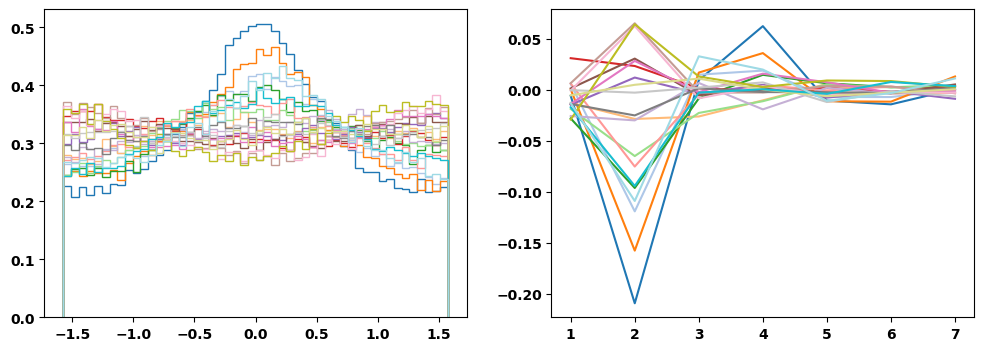

In [11]:
import matplotlib
fig, axes = plt.subplots(1,2, figsize=(12,4))

color_list=matplotlib.cm.tab20(np.linspace(0,1,len(patterned_PDMS.stacks)))

for stack, color in zip(tqdm(np.concatenate([patterned_PDMS.stacks])), color_list):
    if not hasattr(stack, 'velocities'):
        v=stack.get_velocities()
    else:
        v=stack.velocities
    v['theta']=np.arctan2(v['dy'],v['dx'])
    axes[0].hist(np.abs(v['theta'])-np.pi/2, bins=50, density=True, histtype='step', color=color, label=stack.name[-6:].replace('_',''))

    order_params=[]
    for m in range(1,8):
        order_params.append(np.mean(np.real(np.exp(1j*m*v['theta']))))
    print(stack.name, order_params[1])
    axes[1].plot(range(1,8),order_params, label=stack.name[-6:].replace('_',''), color=color)
    
#plt.legend(loc='lower right')
#plt.savefig('Plots/patterned_glass_new_velocityangles.jpg')

In [5]:
all_v=[]
for stack in tqdm(np.concatenate([patterned_PDMS.stacks])):
    if not hasattr(stack, 'velocities'):
        v=stack.get_velocities()
    else:
        v=stack.velocities
    v['theta']=np.arctan2(v['dy'],v['dx'])
    all_v.append(v[['v','frame','theta']])

all_v=pd.concat(all_v)

100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [02:40<00:00, 22.99s/it]


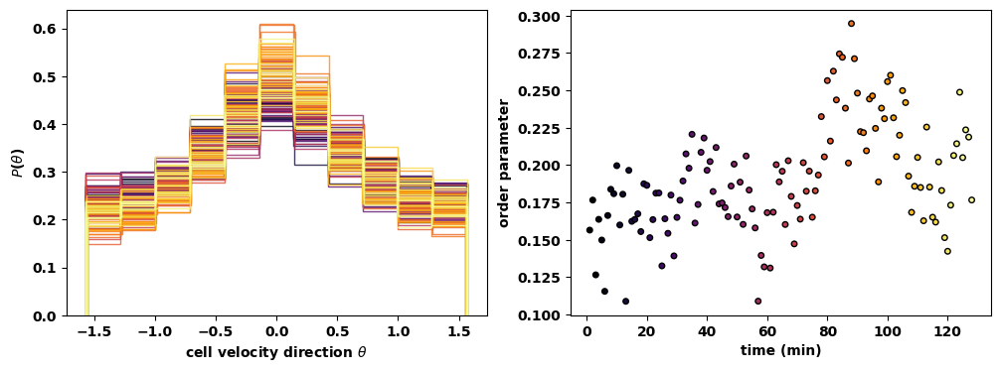

In [6]:
import matplotlib
fig, axes = plt.subplots(1,2, figsize=(12,4))

color_list=matplotlib.cm.inferno(np.linspace(0,1,all_v.frame.max()+1))
order_params=[]
for frame, v in all_v.groupby('frame'):
    axes[0].hist(np.abs(v['theta'])-np.pi/2, bins=11, density=True, histtype='step', color=color_list[frame], alpha=0.8)
    order_params.append(np.mean(np.real(np.exp(2j*v['theta']))))

axes[1].scatter(range(1, all_v.frame.max()+2), -np.array(order_params), s=16, ec='k', c=range(1, all_v.frame.max()+2), cmap='inferno')

axes[0].set_xlabel(r'cell velocity direction $\theta$')
axes[0].set_ylabel(r'$P(\theta)$')
axes[1].set_xlabel('time (min)')
axes[1].set_ylabel('order parameter')

plt.savefig('Plots/patterned_PDMS_orderparamvstime.jpg', dpi=300)

(-1.5707963267948966, 1.5707963267948966)

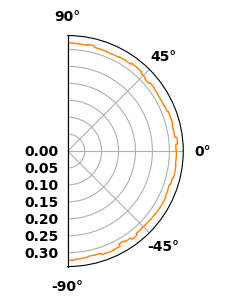

In [9]:
#fig, ax=plt.subplots(1,1, figsize=(3,3), subplot_kw={'projection':'polar'})

#plt.hist(np.abs(v_patterned['theta'])-np.pi/2, bins=15, density=True)
#plt.xlim(-np.pi/2,np.pi/2)

#plt.ylim(0,0.653)
#plt.savefig('Plots/Physics 335 Report/PDMS-patterned-velocities.jpg',dpi=300)


fig, ax=plt.subplots(1,1, figsize=(3,3), subplot_kw={'projection':'polar'})

plt.hist(np.abs(v_unpatterned['theta'])-np.pi/2, color='C1', bins=50, density=True, histtype='step')
plt.xlim(-np.pi/2,np.pi/2)

#plt.ylim(0,0.653)
#plt.savefig('Plots/Physics 335 Report/PDMS-unpatterned-velocities.jpg',dpi=300)

#print(len(v_patterned),len(v_unpatterned))

([<matplotlib.axis.XTick at 0x2a889634310>,
 [Text(-1.5707963267948966, 0, '$-90\\degree$'),
  Text(-1.0471975511965976, 0, '$-60\\degree$'),
  Text(-0.5235987755982988, 0, '$-30\\degree$'),
  Text(0.0, 0, '$0\\degree$'),
  Text(0.5235987755982988, 0, '$30\\degree$'),
  Text(1.0471975511965976, 0, '$60\\degree$'),
  Text(1.5707963267948966, 0, '$90\\degree$')])

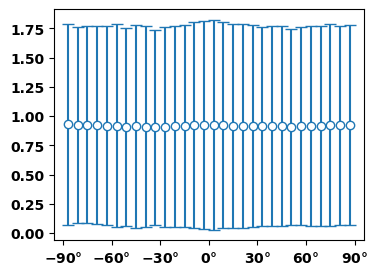

In [67]:
plt.figure(figsize=(4,3))
#binned_velocity=v_patterned.groupby(pd.cut(np.abs(v_patterned['theta']), bins=15))['v'].agg(['mean','std'])
#plt.errorbar(binned_velocity.index.values.categories.mid-np.pi/2, binned_velocity['mean'],yerr=binned_velocity['std'], fmt='o', markerfacecolor='white', capsize=4, label='patterned')

binned_velocity=v_unpatterned.groupby(pd.cut(np.abs(v_unpatterned['theta']), bins=30))['v'].agg(['mean','std'])
plt.errorbar(binned_velocity.index.values.categories.mid-np.pi/2, binned_velocity['mean'],yerr=binned_velocity['std'], fmt='o', markerfacecolor='white', capsize=4, label='patterned')

plt.xticks(ticks=np.pi*np.array([-1/2,-1/3,-1/6,0,1/6,1/3,1/2]), labels=['$-90\degree$','$-60\degree$','$-30\degree$','$0\degree$','$30\degree$','$60\degree$','$90\degree$'])

#plt.savefig('Plots/Physics 335 Report/PDMS-binned-velocities.jpg', dpi=300)

## Cell Divisions

In [8]:
# for large datasets: export mitoses to txt
for stack_path in tqdm(datasets['JD_2mgcol3']):
    stack=Stack(stack_path)
    mitoses=pd.concat(stack.get_mitoses())
    export_path=os.path.dirname(stack.name.replace('segmented','mitoses'))+'.txt'
    if not os.path.exists(os.path.dirname(export_path)):
        os.makedirs(os.path.dirname(export_path))
    mitoses.to_csv(export_path)

100%|██████████████████████████████████████████████████████████████████████████████████| 60/60 [29:55<00:00, 29.93s/it]


In [3]:
# for large datasets: export mitoses to txt
for dataset in [drosophila_WT]:
    for stack in tqdm(dataset.stacks):
        mitoses=pd.concat(stack.get_mitoses())
        export_path=os.path.dirname(stack.name.replace('segmented','mitoses'))+'.txt'
        if not os.path.exists(os.path.dirname(export_path)):
            os.makedirs(os.path.dirname(export_path))
        mitoses.to_csv(export_path)

100%|████████████████████████████████████| 6/6 [02:04<00:00, 20.73s/it]


In [3]:
# import mitoses
for stack in tqdm(patterned_PDMS.stacks):
    mitoses_path=os.path.dirname(stack.name.replace('segmented','mitoses'))+'.txt'
    mitoses=pd.read_csv(mitoses_path)
    stack.mitoses=np.split(mitoses, len(mitoses)/3)

100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 21.57it/s]


100%|███████████████████████████████| 159/159 [00:00<00:00, 777.19it/s]


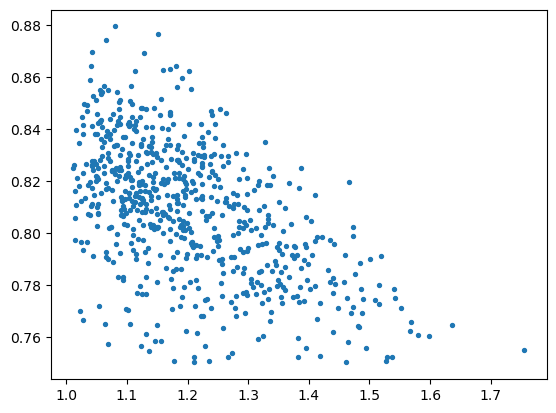

In [61]:
all_circ=[]
all_aspects=[]
for stack in patterned_glass.stacks[:5]:
    maxcirc=[]
    aspects=[]
    stack.get_mitoses()
    for n, m in enumerate(tqdm(stack.mitoses)):
        particle, frame=m.index.values[0] # mother cell info
        mother_index=stack.tracked_centroids[stack.tracked_centroids.particle==particle][['cell_number','frame']].iloc[-2:]
        cell_circ=[]
        cell_aspects=[]
        for cell_number, frame in np.array(mother_index):
            #if not hasattr(stack.frames[frame], 'good_cell_indices'):
            #    stack.frames[frame].get_TCJs()

            mother_cell=stack.frames[frame].cells[cell_number]
            cell_circ.append(mother_cell.circularity)

            mother_cell.fit_ellipse()
            cell_aspects.append(mother_cell.aspect)
            #if not mother_cell.TCJ_axis():
            #    cs.append(np.nan)
            #else:
            #    cs.append(mother_cell.TCJ_circularity)
        #plt.plot(range(len(cs)),cs, alpha=0.4)
        maxcirc.append(np.max(cell_circ))
        aspects.append(np.min(cell_aspects))
    #plt.show()
    all_circ.append(maxcirc)
    all_aspects.append(aspects)
    plt.scatter(aspects, maxcirc, color='C0', s=8)

#for i in [5, 6, 16, 19, 22, 47, 52, 60, 79, 81, 83, 105, 113, 114, 124, 129, 130, 131, 135, 136, 140, 141, 145, 145, 148, 149, 150, 161, 162, 169, 173, 174, 175, 182, 183, 186]:
#    plt.scatter(all_aspects[i],maxcirc[i],color='C1',s=8)

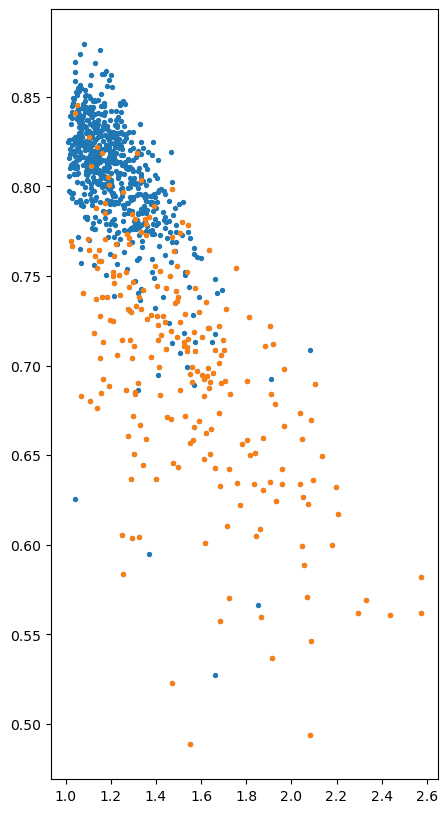

In [54]:
all_bad_mitoses=[[2,7,17,19,40,73,74,85,92,93,97,103,109,113,115,117,123,126,131,133,135,136,139,142,143,147,149,151,156],
             [0,4,7,9,13,19,34,55,62,66,73,87,97,100,102,103,106,107,112,116,118,120,121,124,128,131,133,137,138,140,141,142,145,148,152,154,159,161,166,168,172,175,178,180,181],
             [4,5,14,17,19,21,27,29,35,47,70,77,80,90,93,95,99,101,103,104,110,111,115,116,118,121,122,124,127,128,131,132,133,136,138,143,145,148,149,150,151,152,153,154,160,161,162,165,168,170],
             [5,10,11,12,14,15,16,18,35,38,47,56,66,69,71,72,73,77,79,80,84,86,87,91,95,101,105,106,107,108,109,110,114,115,116,117,118,120,121,127,131,132,133,135,136,137,138,139,140,141,143,145,146,149,152,154,155,158],
             [5,6,7,17,20,23,48,53,54,62,81,83,85,87,108,116,117,119,122,123,125,127,131,136,137,138,142,143,147,148,152,153,154,156,157,158,162,165,168,172,173,177,181,182,186,187,195,200],
             [10,15,16,27,31,43,61,77,113,118,123,125,127,134,136,141,142,146,147,149,154,156,158,163,164,165,167,168,171,173,175,176,177,178]]


plt.figure(figsize=(5,10))
for circ, aspects, bad_mitoses in zip(all_circ, all_aspects, all_bad_mitoses):
    plt.scatter(aspects,circ, color='C0',s=8)

for circ, aspects, bad_mitoses in zip(all_circ, all_aspects, all_bad_mitoses):
    for bad_mitosis in bad_mitoses:
        plt.scatter(aspects[bad_mitosis],circ[bad_mitosis],color='C1',s=8)
        
#plt.ylim(0.7,0.89)

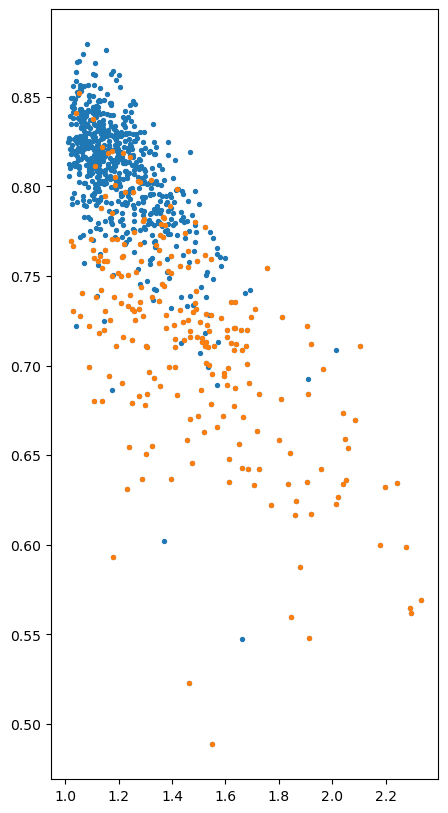

In [50]:
all_bad_mitoses=[[2,7,17,19,40,73,74,85,92,93,97,103,109,113,115,117,123,126,131,133,135,136,139,142,143,147,149,151,156],
             [0,4,7,9,13,19,34,55,62,66,73,87,97,100,102,103,106,107,112,116,118,120,121,124,128,131,133,137,138,140,141,142,145,148,152,154,159,161,166,168,172,175,178,180,181],
             [4,5,14,17,19,21,27,29,35,47,70,77,80,90,93,95,99,101,103,104,110,111,115,116,118,121,122,124,127,128,131,132,133,136,138,143,145,148,149,150,151,152,153,154,160,161,162,165,168,170],
             [5,10,11,12,14,15,16,18,35,38,47,56,66,69,71,72,73,77,79,80,84,86,87,91,95,101,105,106,107,108,109,110,114,115,116,117,118,120,121,127,131,132,133,135,136,137,138,139,140,141,143,145,146,149,152,154,155,158],
             [5,6,7,17,20,23,48,53,54,62,81,83,85,87,108,116,117,119,122,123,125,127,131,136,137,138,142,143,147,148,152,153,154,156,157,158,162,165,168,172,173,177,181,182,186,187,195,200],
             [10,15,16,27,31,43,61,77,113,118,123,125,127,134,136,141,142,146,147,149,154,156,158,163,164,165,167,168,171,173,175,176,177,178]]


plt.figure(figsize=(5,10))
for circ, aspects, bad_mitoses in zip(all_circ, all_aspects, all_bad_mitoses):
    plt.scatter(aspects,circ, color='C0',s=8)

for circ, aspects, bad_mitoses in zip(all_circ, all_aspects, all_bad_mitoses):
    for bad_mitosis in bad_mitoses:
        plt.scatter(aspects[bad_mitosis],circ[bad_mitosis],color='C1',s=8)
        
#plt.ylim(0.7,0.89)

In [198]:
daughters_CoM=np.array(m.iloc[1:,1:].mean())
print(daughters_CoM)
bounding_radius=np.linalg.norm(m.iloc[1,1:]-daughters_CoM)
bounding_radius

[ 79.55646543 120.78320851]


23.860398998947126

In [197]:
daughters_CoM_bad=np.array(stack.mitoses[1].iloc[1:,1:].mean())
print(daughters_CoM_bad)
bounding_radius=np.linalg.norm(m.iloc[1,1:]-daughters_CoM_bad)
bounding_radius

[ 64.96157929 114.69210655]


20.077486618796183

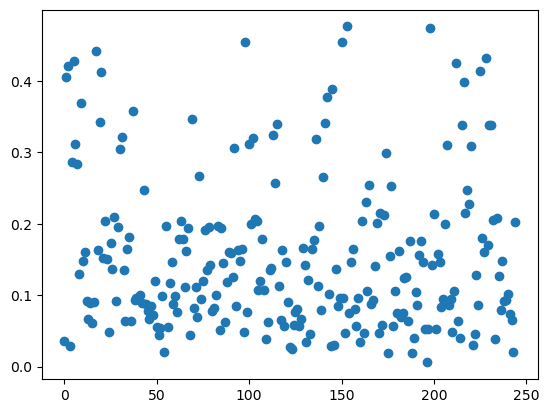

In [214]:
disp=[]
distances=[]
for m in stack.mitoses:
    daughters_CoM=np.array(m.iloc[1:,1:].mean())
    daughters_distance=np.linalg.norm(np.diff(m.iloc[1:,1:], axis=0)[0])  
    distances.append(daughters_distance)
    disp.append(np.linalg.norm(daughters_CoM-m.iloc[0,1:])/daughters_distance)
    
plt.scatter(range(len(stack.mitoses)), disp)

(array([ 1.,  2.,  3.,  2.,  4.,  7., 11., 11., 16., 14., 25., 27., 17.,
        23., 27., 15., 12., 13.,  8.,  7.]),
 array([25.45026233, 26.79309244, 28.13592254, 29.47875265, 30.82158275,
        32.16441286, 33.50724296, 34.85007307, 36.19290317, 37.53573328,
        38.87856338, 40.22139348, 41.56422359, 42.90705369, 44.2498838 ,
        45.5927139 , 46.93554401, 48.27837411, 49.62120422, 50.96403432,
        52.30686443]),
 <BarContainer object of 20 artists>)

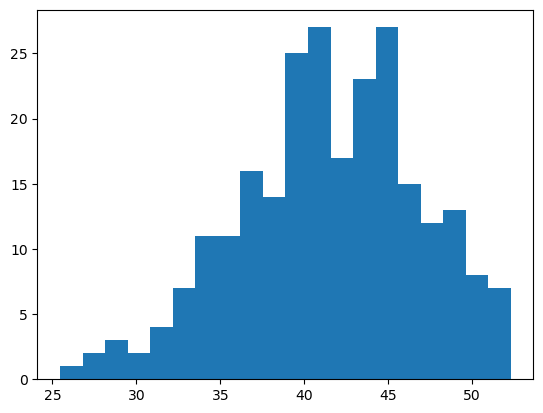

In [220]:
plt.hist(distances, bins=20)

In [173]:
m=stack.mitoses[0]
mother=np.array(m.iloc[0,1:])
cell12=np.array(m.iloc[1,1:])
cell28=np.array(m.iloc[2,1:])
cell21=np.array(stack.mitoses[1].iloc[2,1:])

In [185]:
np.linalg.norm(cell12-cell28)

47.720797997894266

In [ ]:
plt.scatter(all_aspects, maxcirc, color='C0', s=5)

for i in [4, 30, 40, 42, 46, 49, 54, 72, 73, 74, 75, 81, 87, 88, 91, 99, 105]:
    plt.scatter(all_aspects[i],maxcirc[i],color='C1',s=5)

                cell_number            y           x
particle frame                                      
544      4              565  1387.585432  833.157022
721      5              562  1372.985274  827.402186
722      5              574  1408.449071  855.897123 1.7815585006894217 2
                cell_number            y           x
particle frame                                      
825      19             521  1230.433977  429.785216
971      20             503  1199.637927  438.792957
972      20             524  1244.262176  422.681532 1.7155073204319071 22
                cell_number            y           x
particle frame                                      
428      25             490  1168.858184  731.908715
1045     26             500  1180.749705  718.632061
1046     26             495  1153.341636  743.834250 2.4123739320144924 27
                cell_number            y           x
particle frame                                      
433      33             472  1101.

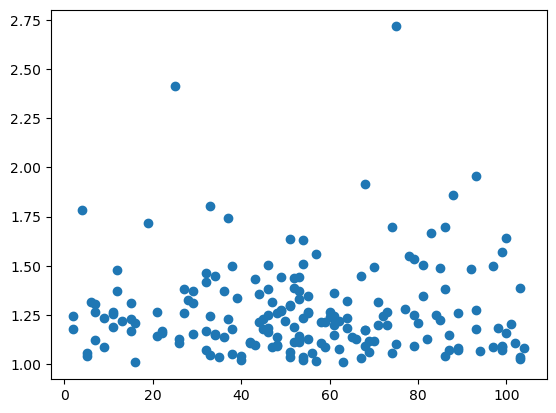

In [158]:
stack=patterned_glass.stacks[4]
all_aspects=[]
for n, m in enumerate(stack.mitoses):
    particle, frame=m.index.values[0]
    mother_index=stack.tracked_centroids[stack.tracked_centroids.particle==particle][['cell_number','frame']].iloc[-4:]
    
    aspects=[]
    for cell_number, frame in np.array(mother_index):
        mother_cell=stack.frames[frame].cells[cell_number]
        mother_cell.fit_ellipse()
        aspects.append(mother_cell.aspect)
        
    plt.scatter(frame, np.min(aspects), color='C0')
    if np.min(aspects)>1.5:
        print(m, np.min(aspects), n)
    #print(m, np.mean(aspects))
    all_aspects.append(np.min(aspects))
    
    #o=stack.frames[frame].cells[mother].outline

#for m in [stack.mitoses[i] for i in [4, 30, 40, 42, 46, 49, 54, 72, 73, 74, 75, 81, 87, 88, 91, 99, 105]]:
#    particle, frame=m.index.values[0]
#    mother_index=stack.tracked_centroids[stack.tracked_centroids.particle==particle][['cell_number','frame']].iloc[-4:]
#    
#    aspects=[]
#    for cell_number, frame in np.array(mother_index):
#        mother_cell=stack.frames[frame].cells[cell_number]
#        mother_cell.fit_ellipse()
#        aspects.append(mother_cell.aspect)
#    print(np.min(aspects))
#    plt.scatter(frame, np.min(aspects), color='C1')

### Demo Mitotic Trajectory

In [379]:
stack = Stack(datasets['JD_glass2'][0])

In [ ]:
stack.get_mitoses()

In [401]:
daughter1

,cell_number,y,x,frame,particle
9966,280,957.114528,143.051811,36,442
10249,277,956.963056,142.862344,37,442
10526,274,958.534401,143.098740,38,442
10814,277,958.411364,144.236263,39,442
11095,285,959.217572,144.526634,40,442
...,...,...,...,...,...
48775,468,954.512840,138.325528,134,442
49258,462,953.362563,138.950752,135,442
49747,466,954.810034,137.694981,136,442
50233,468,955.242059,137.211598,137,442


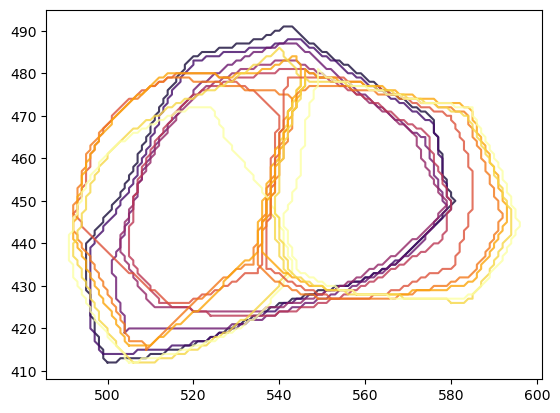

In [435]:
colors = plt.cm.inferno(np.linspace(0.1,1,10))

m=stack.mitoses[14]
particle_IDs=m.index.get_level_values(0)
    
mother=stack.tracked_centroids[stack.tracked_centroids['particle']==particle_IDs[0]]
for [frame, cell_number], color in zip(np.array(mother.iloc[-5:][['frame','cell_number']]), colors):
    outline=stack.frames[frame].cells[cell_number].outline
    outline=np.append(outline, [outline[0]], axis=0)
    plt.plot(*outline.T, color=color, alpha=0.8)

daughter1=stack.tracked_centroids[stack.tracked_centroids['particle']==particle_IDs[1]]
for [frame, cell_number], color in zip(np.array(daughter1.iloc[:5][['frame','cell_number']]), colors[5:]):
    outline=stack.frames[frame].cells[cell_number].outline
    outline=np.append(outline, [outline[0]], axis=0)
    plt.plot(*outline.T, color=color, alpha=0.8)

daughter2=stack.tracked_centroids[stack.tracked_centroids['particle']==particle_IDs[2]]
for [frame, cell_number], color in zip(np.array(daughter2.iloc[:5][['frame','cell_number']]), colors[5:]):
    outline=stack.frames[frame].cells[cell_number].outline
    outline=np.append(outline, [outline[0]], axis=0)
    plt.plot(*outline.T, color=color, alpha=0.8)
#for [frame, cell_number1, cell_number2], color in zip
#last_frame=max(daughter1['frame'].max(), daughter2['frame'].max())
#plt.axis('equal')
#plt.scatter(daughter1['x'],daughter1['y'], s=1, c=daughter1['frame'], cmap='inferno', vmin=mother['frame'].min(), vmax=last_frame)
#plt.scatter(daughter2['x'],daughter2['y'], s=1, c=daughter2['frame'], cmap='inferno', vmin=mother['frame'].min(), vmax=last_frame)
#plt.scatter(mother['x'],mother['y'], s=1, c=mother['frame'], cmap='inferno', vmin=mother['frame'].min(), vmax=last_frame)

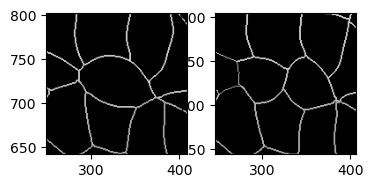

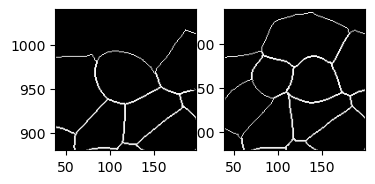

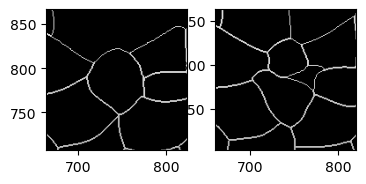

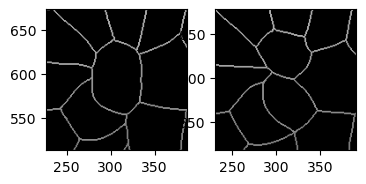

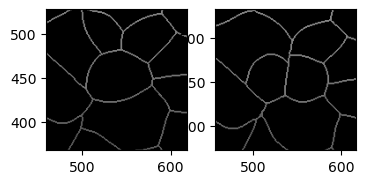

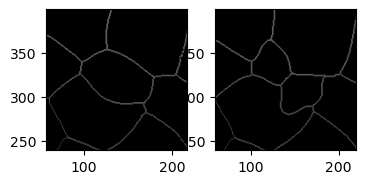

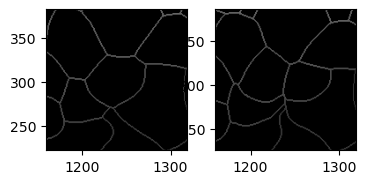

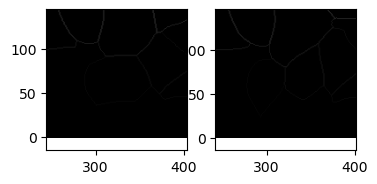

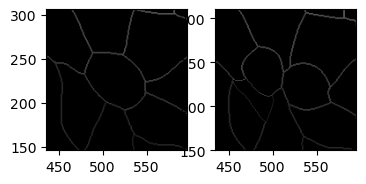

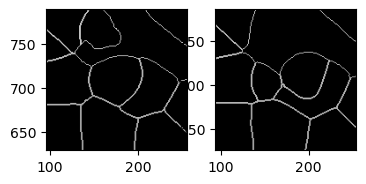

In [395]:
for m in stack.mitoses[10:20]:
    particle_IDs=m.index.get_level_values(0)
    
    mother=stack.tracked_centroids[stack.tracked_centroids['particle']==particle_IDs[0]]
    daughter1=stack.tracked_centroids[stack.tracked_centroids['particle']==particle_IDs[1]]
    daughter2=stack.tracked_centroids[stack.tracked_centroids['particle']==particle_IDs[2]]
    
    mother_frame=mother.iloc[-1][['y','x','frame']].astype(int)
    daughter_frame=pd.concat([daughter1.iloc[0], daughter2.iloc[0]], axis=1).T[['y','x','frame']].mean().astype(int)
    fig, axes = plt.subplots(1,2, figsize=(4,2), subplot_kw={'aspect':1})
    axes[0].imshow(stack.frames[mother_frame['frame']].outlines, cmap='gray')
    axes[0].set_xlim(mother_frame['x']+np.array([-80,80]))
    axes[0].set_ylim(mother_frame['y']+np.array([-80,80]))
    axes[1].imshow(stack.frames[daughter_frame['frame']].outlines, cmap='gray')
    axes[1].set_xlim(daughter_frame['x']+np.array([-80,80]))
    axes[1].set_ylim(daughter_frame['y']+np.array([-80,80]))
    plt.show()

### Cell Division Orientation

In [163]:
unpatterned_thetas=[]
for stack in tqdm(JD_2mgcol.stacks):
    #mitoses=stack.get_mitoses()
    for mitotic_event in stack.mitoses:
        theta=np.arctan2(*np.diff(mitotic_event[['y','x']].iloc[-2:], axis=0)[0])
        unpatterned_thetas.append(theta)

100%|██████████████████████████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.68it/s]


In [350]:
unpatterned_thetas=[]
for stack in tqdm(unpatterned_glass.stacks):
    mitoses=stack.get_mitoses()
    for mitotic_event in stack.mitoses:
        theta=np.arctan2(*np.diff(mitotic_event[['y','x']].iloc[-2:], axis=0)[0])
        unpatterned_thetas.append(theta)

patterned_thetas=[]
for stack in tqdm(patterned_glass.stacks):
    mitoses=stack.get_mitoses()
    for mitotic_event in stack.mitoses:
        theta=np.arctan2(*np.diff(mitotic_event[['y','x']].iloc[-2:], axis=0)[0])
        patterned_thetas.append(theta)

100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [04:22<00:00, 18.75s/it]


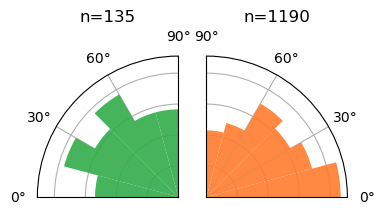

In [356]:
fig, axes=plt.subplots(1,2, figsize=(4,2), subplot_kw={'projection':'polar'})

axes[0].hist(np.abs(np.abs(unpatterned_thetas)-np.pi/2), bins=np.linspace(0,np.pi/2,7), density=True, color='#32AC49', zorder=2, alpha=0.9)
axes[1].hist(np.abs(np.abs(patterned_thetas)-np.pi/2), bins=np.linspace(0,np.pi/2,7), density=True, color='#FF7C2D', zorder=2, alpha=0.9)
axes[0].set_theta_zero_location("W")
axes[0].set_theta_direction(-1)

axes[0].set_ylim(axes[1].get_ylim())
axes[0].set_title('n={}'.format(len(unpatterned_thetas)))
axes[1].set_title('n={}'.format(len(patterned_thetas)))

for ax in axes:    
    ax.set_xlim(0,np.pi/2)
    ax.set_yticklabels([])
    
plt.savefig('Plots/ASCB 2023/micropattern-division_orientation.jpg',dpi=300)

### Interphase Cell Shape

#### Comparing interphase shape vs. cell division angle for individual mitoses

In [ ]:
for stack in unpatterned_glass.stacks:
    if not hasattr(stack, 'mitoses'):
        stack.get_mitoses()
    extended_mitoses=[]

    # get the cell tracking info for frames surrounding each mitotic event
    for m in stack.mitoses:
        particle_IDs=m.index.get_level_values(0)

        mother=stack.tracked_centroids[stack.tracked_centroids['particle']==particle_IDs[0]]
        mother_firstframe=mother.frame.max()-15
        mother=mother[mother['frame']>=mother_firstframe] # cut out all frames before except 5 before mitosis (or beginning)
        extended_mitoses.append(pd.concat([mother,m.iloc[-2:].reset_index()]).reset_index(drop=True))

    # visualize and export individual mitoses: interphase vs immediately after cytokinesis
    for n,mitotic_event in enumerate(tqdm(extended_mitoses)):
        fig, axes=plt.subplots(1,2,figsize=(10,5))

        # pull visual cell centroids (without trackpy's drift correction)
        cell_centroids=[]
        thetas=[]
        aspect=[]
        for cell in [stack.frames[frame].cells[cell_number] for frame, cell_number in np.array(mitotic_event[['frame','cell_number']])]: # complicated indexing but this gets all the corresponding objects I'm pointing to
            cell_centroids.append(cell.centroid)
            cell.fit_ellipse()
            thetas.append(cell.theta)
            aspect.append(cell.aspect)
        mitotic_event[['y','x']]=np.array(cell_centroids)
        mitotic_event['theta']=thetas
        mitotic_event['aspect']=aspect

        interphase_frame=mitotic_event['aspect'].iloc[:-2].idxmax() # frame with the largest cell aspect ratio (excluding frame of cytokinesis)

        frames_for_plotting=mitotic_event.iloc[[interphase_frame,-2,-1]]

        # set spatial limits for plotting
        ROI_bounds=frames_for_plotting.reset_index()[['y','x']].agg(['min','max']).astype(int) 
        cell_margin=50 # another hardcoded length scale (for setting axis limits): distance_threshold/2 makes sense to me

        theta_angle=frames_for_plotting.iloc[0].theta
        theta_vector=np.array([[0,np.cos(theta_angle)], [0,np.sin(theta_angle)]])*cell_margin/1.5

        for ax, [frame_number, m] in zip(axes,frames_for_plotting.groupby('frame')): # on both axes:
            # plot with normalized brightness
            values=stack.frames[frame_number].img[max(ROI_bounds['y']['min']-cell_margin,0):ROI_bounds['y']['max']+cell_margin,max(ROI_bounds['x']['min']-cell_margin,0):ROI_bounds['x']['max']+cell_margin]
            ax.imshow(stack.frames[frame_number].img, vmax=values.max(), vmin=values.min(), cmap='gray')
            ax.set_xlim(ROI_bounds['x']['min']-cell_margin,ROI_bounds['x']['max']+cell_margin)
            ax.set_ylim(ROI_bounds['y']['max']+cell_margin,ROI_bounds['y']['min']-cell_margin)
            ax.scatter(m['x'],m['y'], s=10, color='lime')
            ax.plot(m.iloc[0]['x']+theta_vector[0],m.iloc[0]['y']+theta_vector[1], color='magenta')
        # label the two mitosis-identified frames with cell ellipses and centroids

        # ax[0]: draw ellipse, centroid, line for theta
        # ax[1]: draw centroids, line for theta, line for cell division
        # title: theta-cell_division
        cell_division_angle=np.arctan2(*np.diff(mitotic_event[['y','x']].iloc[-2:], axis=0)[0])
        cell_division_vector=np.array([[0,np.cos(cell_division_angle)], [0,np.sin(cell_division_angle)]])*cell_margin/1.5
        axes[1].plot(frames_for_plotting.iloc[-2]['x']+cell_division_vector[0], frames_for_plotting.iloc[-2]['y']+cell_division_vector[1], color='cyan')
        axes[0].set_title('shape: {:.3f}'.format(theta_angle*180/np.pi))
        axes[1].set_title('division: {:.3f}'.format(cell_division_angle*180/np.pi))

        # draw ellipse
        xc,yc,a,b,theta=stack.frames[frames_for_plotting.frame.iloc[0]].cells[frames_for_plotting.cell_number.iloc[0]].fit_params
        e=Ellipse((xc,yc),2*a,2*b,angle=theta*180/np.pi,edgecolor='r',facecolor='none')
        axes[0].add_patch(e)
        plt.savefig('Segmentation/20230410 halo PDMS lines - good PDMS/interphase_axis/{}_mitosis{}.jpg'.format(stack.name.split('/')[-1][:-4], n))
        plt.close()

#### Cell Division GIFs with fitted Ellipses

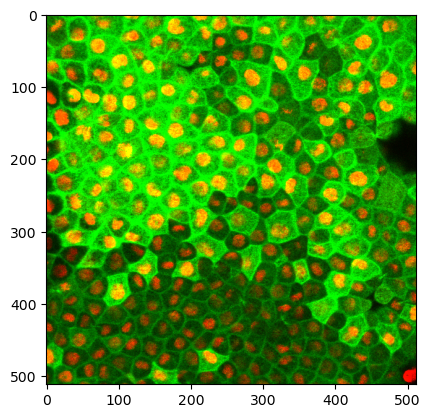

In [58]:
image=xenopus_ctrl.stacks[0].frames[0].img
plt.imshow(image)
plt.show()

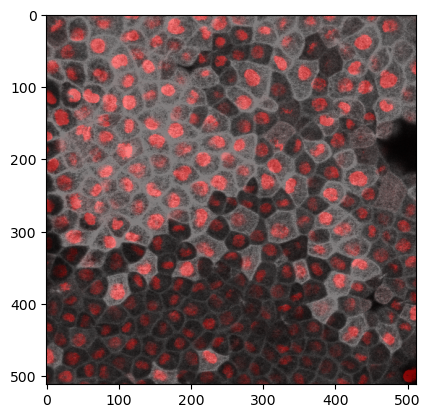

In [95]:
image_red

array([[0.08627451, 0.07058824, 0.08627451, ..., 0.05490196, 0.04313725,
        0.03921569],
       [0.11372549, 0.08627451, 0.05490196, ..., 0.09803922, 0.07058824,
        0.07058824],
       [0.07058824, 0.07058824, 0.05490196, ..., 0.05490196, 0.07058824,
        0.14117647],
       ...,
       [0.24313725, 0.23137255, 0.15686275, ..., 0.12941176, 0.07058824,
        0.08235294],
       [0.17254902, 0.12941176, 0.11372549, ..., 0.07058824, 0.07058824,
        0.05490196],
       [0.15686275, 0.17254902, 0.08627451, ..., 0.02745098, 0.05490196,
        0.03921569]])

In [7]:
# get the cell info for frames surrounding mitosis
if not hasattr(stack, 'mitoses'):
    stack.get_mitoses()

extended_mitoses=[] # get the cell tracking info for frames surrounding each mitotic event

for m in tqdm(stack.mitoses):
    particle_IDs=m.index.get_level_values(0)
    
    mother=stack.tracked_centroids[stack.tracked_centroids['particle']==particle_IDs[0]]
    mother_firstframe=mother.frame.max()-10
    mother=mother[mother['frame']>=mother_firstframe] # cut out all frames before except 5 before mitosis (or beginning)
    extended_mitoses.append(mother)
    
    #for daughter_ID in particle_IDs[1:]:
    #    daughter=stack.tracked_centroids[stack.tracked_centroids['particle']==daughter_ID]
    #    daughter_firstframe=min(daughter.frame.max(), daughter.frame.min()+5)
    #    daughter=daughter[daughter['frame']<=daughter_firstframe]
    #    daughter['alpha']=(daughter.frame.max()-daughter.frame+1)/6
    #    daughter['color']='lime'
    #    extended_mitoses.append(daughter)

extended_mitoses=pd.concat(extended_mitoses)

100%|█████████████████████████████████████████████████████████████████████████████████| 24/24 [00:00<00:00, 492.84it/s]


In [48]:
from matplotlib.patches import Ellipse

def plot_fitted_mitosis(frame_number): # frame number is an integer, passed by FuncAnimation
    ax.clear()
    cell_margin=50 # another hardcoded length scale (for setting axis limits): distance_threshold/2 makes sense to me
    
    # normalize brightness
    values=stack.frames[frame_number].img[ROI_bounds['y']['min']-cell_margin:ROI_bounds['y']['max']+cell_margin,ROI_bounds['x']['min']-cell_margin:ROI_bounds['x']['max']+cell_margin]
    plt.imshow(stack.frames[frame_number].img, vmax=values.max(), vmin=values.min(), cmap='gray')
    plt.xlim(ROI_bounds['x']['min']-cell_margin,ROI_bounds['x']['max']+cell_margin)
    plt.ylim(ROI_bounds['y']['max']+cell_margin,ROI_bounds['y']['min']-cell_margin)
    
    
    # label the two mitosis-identified frames with cell ellipses and centroids
    cells_to_outline=mitotic_event[mitotic_event['frame']==frame_number]
    if len(cells_to_outline)>0:
        plt.scatter(cells_to_outline['x'],cells_to_outline['y'], s=10)
        for cell in [stack.frames[frame_number].cells[cell_number] for cell_number in cells_to_outline['cell_number']]:
            plt.plot(cell.outline[:,0], cell.outline[:,1], color='r')
            xc,yc,a,b,theta=cell.fit_params
            e=Ellipse((xc,yc),2*a,2*b,theta*180/np.pi,edgecolor='lime',facecolor='none') 
            ax.add_patch(e)
            
            aspect=cell.aspect
            theta=cell.theta
    else:
        aspect='none'
        theta='none'
        
    plt.title('aspect: {} theta: {}'.format(aspect, theta))

In [54]:
# animate and export individual mitoses
from matplotlib.animation import FuncAnimation

for stack in tqdm(patterned_glass.stacks):
    if not hasattr(stack, 'mitoses'):
        stack.get_mitoses()
    extended_mitoses=[]
    
    # get the cell tracking info for frames surrounding each mitotic event
    for m in stack.mitoses:
        particle_IDs=m.index.get_level_values(0)

        mother=stack.tracked_centroids[stack.tracked_centroids['particle']==particle_IDs[0]]
        mother_firstframe=mother.frame.max()-15
        mother=mother[mother['frame']>=mother_firstframe] # cut out all frames before except 5 before mitosis (or beginning)
        extended_mitoses.append(mother)
    
    # animate and export individual mitoses
    for n,mitotic_event in enumerate(tqdm(extended_mitoses)):
        fig, ax=plt.subplots(figsize=(5,5))

        # pull visual cell centroids (without trackpy's drift correction)
        cell_centroids=[]
        for cell in [stack.frames[frame].cells[cell_number] for frame, cell_number in np.array(mitotic_event.reset_index()[['frame','cell_number']])]: # complicated indexing but this gets all the corresponding objects I'm pointing to
            cell_centroids.append(cell.centroid)
            cell.fit_ellipse()
        cell_centroids=pd.DataFrame(cell_centroids, columns=['y','x'], index=mitotic_event.index)
        mitotic_event[['y','x']]=cell_centroids[['y','x']]

        # set spatial and temporal limits for plotting
        ROI_bounds=mitotic_event.reset_index()[['frame','y','x']].agg(['min','max']).astype(int) 
        frames=range(ROI_bounds['frame']['min']-0,ROI_bounds['frame']['max']+3) # get a few frames around the mitotic event for context

        anim=FuncAnimation(fig, plot_fitted_mitosis, frames=frames, interval=300)

        try:
            anim.save('Segmentation/20230508 halo glass lines incubator - good glass/mitotic_fits/{}_mitosis{}.gif'.format(stack.name.split('/')[-1][:-4], n))
        except:
            print(n)
        plt.close()

100%|████████████████████████████████████████████████████████████████████████████████| 111/111 [00:11<00:00,  9.83it/s]


### Aligned mitoses for PCA

In [2]:
from cellpose import models, utils
from preprocessing import mend_gaps
model=models.Cellpose(gpu=True,model_type='cyto2')

def index_boundaries(img, x, y, ROI_size):
    '''
    takes a 2*ROI_size square slice out of the image. out-of-bounds indices are filled with zero.
    '''
    img=np.pad(img, ROI_size)
    xlims=(x,x+2*ROI_size)
    ylims=(y,y+2*ROI_size)
    unrotated=img[ylims[0]:ylims[1],xlims[0]:xlims[1]]
    return unrotated

def rotate_and_segment(img, x, y, theta, ROI_size):
    unrotated=index_boundaries(img, x, y, ROI_size*2) # get large region around mitosis (4*ROI_size square)
    rotated=ndimage.rotate(unrotated, angle=np.degrees(theta)-90, reshape=False, order=3) # rotate division angle to vertical
    # segment data
    masks = mend_gaps(model.eval(rotated, diameter=None, channels=[0,0])[0])
    
    boundaries=utils.masks_to_outlines(masks) # have cellpose find new outlines
    outlines=np.zeros(masks.shape)
    outlines[boundaries]=masks[boundaries] # attach labels to outlines
    
    cell_centroids=np.array(ndimage.center_of_mass(np.ones(masks.shape), labels=masks, index=np.unique(masks)[1:]))-2*ROI_size
    
    return rotated, outlines, cell_centroids

In [160]:
len(stack.get_mitoses())

88

In [449]:
areas=[]
pixels=[]
for m in stack.mitoses:
    daughter_frame=m.index[-1][-1]
    mother=stack.frames[daughter_frame-1].cells[m['cell_number'].iloc[0]]
    pixels.append(np.sum(stack.frames[daughter_frame-1].masks==mother.n+1))
    areas.append(mother.area)

In [142]:
m=stack.mitoses[-2]

particle_IDs=m.index.get_level_values(0)
mother_lastframe=m.index.get_level_values(1)[0]

daughter_frame=m.index[-1][-1]
mother=stack.frames[daughter_frame-1].cells[m['cell_number'].iloc[0]]
daughter_1=stack.frames[daughter_frame].cells[m['cell_number'].iloc[-2]]
daughter_2=stack.frames[daughter_frame].cells[m['cell_number'].iloc[-1]]

distance_matrix=cdist(daughter_1.outline, daughter_2.outline, metric='cityblock').astype(int)
adjacencies=np.where(distance_matrix==1)
if len(adjacencies[0])==0: # hmm, these cells don't touch. they must be segmented/detected wrong or weird, skip for this.
    raise IndexError
daughter_y, daughter_x=((daughter_1.centroid+daughter_2.centroid)/2*scale_factor).astype(int) # find center of mitosis by shared edge


theta_D=np.arctan2(*np.diff(m.iloc[-2:,1:], axis=0)[0]) # compute division angle
mother=stack.frames[daughter_frame-1].cells[m['cell_number'].iloc[0]]
scale_factor=np.sqrt(mother_scale_factor/mother.area) # normalize by mother cell area

mother_allframes=stack.tracked_centroids[stack.tracked_centroids['particle']==particle_IDs[0]]
mother_allframes=mother_allframes.set_index('frame')

circularity=[]

for frame in range(mother_lastframe-4, mother_lastframe+1):
    if frame in mother_allframes.index:
        mother_cell=stack.frames[frame].cells[mother_allframes.cell_number.loc[frame]]
        mother_cell.perimeter_axis()
        circularity.append(mother_cell.circ_P)
    else: # mother cell not in frame
        circularity.append(np.nan)

mother_roundframe=np.arange(mother_lastframe-4, mother_lastframe+1)[np.argmax(circularity)]

outlines=[]
for frame in tqdm(range(mother_roundframe-9, mother_roundframe+1)):
    if frame in mother_allframes.index:
        mother=stack.frames[frame].cells[mother_allframes['cell_number'].loc[frame]]

        mother_x, mother_y=(np.array([mother.centroid[1], mother.centroid[0]])*scale_factor).astype(int)
        mother_frame_img=ndimage.zoom(stack.frames[frame].img, scale_factor)

        mother_frame_img, mother_frame_outlines, mother_frame_centroids=rotate_and_segment(mother_frame_img, mother_x, mother_y, theta_D, ROI_size)
        mother_cell=np.argmin(np.linalg.norm(mother_frame_centroids, axis=1))+1 # label of mother cell, determined by distance to center
        mother_outline=(mother_frame_outlines==mother_cell)[ROI_size:3*ROI_size, ROI_size:3*ROI_size] # outline of mother cell, cropped to ROI_size
        mother_frame_img=mother_frame_img[ROI_size:3*ROI_size, ROI_size:3*ROI_size] # img cropped to ROI_size

        outlines.append(utils.outlines_list(mother_outline)[0])
    else:
        outlines.append(np.array([]))

daughter_frame_img=ndimage.zoom(stack.frames[daughter_frame].img, scale_factor)
daughter_frame_img, daughter_frame_outlines, daughter_frame_centroids=rotate_and_segment(daughter_frame_img, daughter_x, daughter_y, theta_D, ROI_size)
daughter_cells=np.argpartition(np.linalg.norm(daughter_frame_centroids, axis=1),1)[:2]+1 # labels of daughter cells, determined by distances to center
daughter_outlines=np.isin(daughter_frame_outlines, daughter_cells)[ROI_size:3*ROI_size, ROI_size:3*ROI_size] # outlines of daughter cells, cropped to ROI_size
daughter_frame_img=daughter_frame_img[ROI_size:3*ROI_size, ROI_size:3*ROI_size] # img cropped to ROI_size

outlines.extend(utils.outlines_list(np.ma.masked_array(daughter_frame_outlines[ROI_size:3*ROI_size, ROI_size:3*ROI_size],~daughter_outlines).filled(0)))

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [01:03<00:00,  6.36s/it]


In [21]:
stack=Stack(datasets['JD_4mgcolCL'][0], load_img=True)

In [ ]:
# export outlines as function of time
ROI_size=80
mother_scale_factor=3500 # 3500 is approx. mean mother cell area for July PDMS stack 21
show=True # visualize instead of exporting

#all_outlines=[]
for stack in [stack]:
    #stack.load_img()
    if not hasattr(stack, 'mitoses'):
        stack.get_mitoses()
    
    for n, m in enumerate(tqdm(stack.mitoses[12:])):
        particle_IDs=m.index.get_level_values(0)
        mother_lastframe=m.index.get_level_values(1)[0]

        daughter_frame=m.index[-1][-1]
        mother=stack.frames[daughter_frame-1].cells[m['cell_number'].iloc[0]]
        daughter_1=stack.frames[daughter_frame].cells[m['cell_number'].iloc[-2]]
        daughter_2=stack.frames[daughter_frame].cells[m['cell_number'].iloc[-1]]

        distance_matrix=cdist(daughter_1.outline, daughter_2.outline, metric='cityblock').astype(int)
        adjacencies=np.where(distance_matrix==1)
        if len(adjacencies[0])==0: # hmm, these cells don't touch. they must be segmented/detected wrong or weird, skip for this.
            continue
            
        #daughter_x, daughter_y=(np.concatenate([daughter_1.outline[adjacencies[0]],daughter_2.outline[adjacencies[1]]]).mean(axis=0)*scale_factor).astype(int) # find center of mitosis by shared edge

        theta_D=np.arctan2(*np.diff(m.iloc[-2:,1:], axis=0)[0]) # compute division angle
        
        mother=stack.frames[daughter_frame-1].cells[m['cell_number'].iloc[0]]
        scale_factor=np.sqrt(mother_scale_factor/mother.area) # normalize by mother cell area
        daughter_y, daughter_x=((daughter_1.centroid+daughter_2.centroid)/2*scale_factor).astype(int) # find center of mitosis by centroid mean

        mother_allframes=stack.tracked_centroids[stack.tracked_centroids['particle']==particle_IDs[0]]
        mother_allframes=mother_allframes.set_index('frame')

        circularity=[]

        for frame in range(mother_lastframe-4, mother_lastframe+1):
            if frame in mother_allframes.index:
                mother_cell=stack.frames[frame].cells[mother_allframes.cell_number.loc[frame]]
                mother_cell.perimeter_axis()
                circularity.append(mother_cell.circ_P)
            else: # mother cell not in frame
                circularity.append(np.nan)

        mother_roundframe=np.arange(mother_lastframe-4, mother_lastframe+1)[np.argmax(circularity)]

        outlines=[]
        for frame in range(mother_roundframe-9, mother_roundframe+1):
            if frame in mother_allframes.index:
                mother=stack.frames[frame].cells[mother_allframes['cell_number'].loc[frame]]

                mother_x, mother_y=(np.array([mother.centroid[1], mother.centroid[0]])*scale_factor).astype(int)
                mother_frame_img=ndimage.zoom(stack.frames[frame].img, scale_factor)

                mother_frame_img, mother_frame_outlines, mother_frame_centroids=rotate_and_segment(mother_frame_img, mother_x, mother_y, theta_D, ROI_size)
                mother_cell=np.argmin(np.linalg.norm(mother_frame_centroids, axis=1))+1 # label of mother cell, determined by distance to center
                mother_outline=(mother_frame_outlines==mother_cell)[ROI_size:3*ROI_size, ROI_size:3*ROI_size] # outline of mother cell, cropped to ROI_size
                mother_frame_img=mother_frame_img[ROI_size:3*ROI_size, ROI_size:3*ROI_size] # img cropped to ROI_size

                outlines.append(utils.outlines_list(mother_outline)[0])
            else:
                outlines.append(np.array([]))

        daughter_frame_img=ndimage.zoom(stack.frames[daughter_frame].img, scale_factor)
        daughter_frame_img, daughter_frame_outlines, daughter_frame_centroids=rotate_and_segment(daughter_frame_img, daughter_x, daughter_y, theta_D, ROI_size)
        try:
            daughter_cells=np.argpartition(np.linalg.norm(daughter_frame_centroids, axis=1),1)[:2]+1 # labels of daughter cells, determined by distances to center

            daughter_outlines=np.isin(daughter_frame_outlines, daughter_cells)[ROI_size:3*ROI_size, ROI_size:3*ROI_size] # outlines of daughter cells, cropped to ROI_size
            daughter_frame_img=daughter_frame_img[ROI_size:3*ROI_size, ROI_size:3*ROI_size] # img cropped to ROI_size

            outlines.extend(utils.outlines_list(np.ma.masked_array(daughter_frame_outlines[ROI_size:3*ROI_size, ROI_size:3*ROI_size],~daughter_outlines).filled(0)))
        
        except AxisError:
            outlines.extend([np.array([]),np.array([])]) # failed to segment daughter cells
            
        all_outlines.append(outlines)

In [36]:
np.save('drosophila_all_outlines.npy', {'outlines':all_outlines}, allow_pickle=True)

In [523]:
# export masks of aligned mitotic cells
ROI_size=80
mother_scale_factor=3500 # 3500 is approx. mean mother cell area for July PDMS stack 21
show=False # visualize instead of exporting

for stack in tqdm(unpatterned_PDMS.stacks):
    stack.load_img()
    if not hasattr(stack, 'mitoses'):
        stack.get_mitoses()

    for n, m in enumerate(stack.mitoses):
        daughter_frame=m.index[-1][-1]
        mother=stack.frames[daughter_frame-1].cells[m['cell_number'].iloc[0]]
        daughter_1=stack.frames[daughter_frame].cells[m['cell_number'].iloc[-2]]
        daughter_2=stack.frames[daughter_frame].cells[m['cell_number'].iloc[-1]]
        scale_factor=np.sqrt(mother_scale_factor/mother.area) # normalize by mother cell area

        distance_matrix=cdist(daughter_1.outline, daughter_2.outline, metric='cityblock').astype(int)
        adjacencies=np.where(distance_matrix==1)
        if len(adjacencies[0])==0: # hmm, these cells don't touch. they must be segmented/detected wrong or weird, skip for this.
            continue
        daughter_x, daughter_y=(np.concatenate([daughter_1.outline[adjacencies[0]],daughter_2.outline[adjacencies[1]]]).mean(axis=0)*scale_factor).astype(int) # find center of mitosis by shared edge
        #((daughter_1.centroid+daughter_2.centroid)*scale_factor/2).astype(int) # find center of mitosis by daughter centroids
        mother_x, mother_y=(np.array([mother.centroid[1], mother.centroid[0]])*scale_factor).astype(int)
        theta_D=np.arctan2(*np.diff(m.iloc[-2:,1:], axis=0)[0]) # compute division angle

        daughter_frame_img=ndimage.zoom(stack.frames[daughter_frame].img, scale_factor)
        daughter_frame_img, daughter_frame_outlines, daughter_frame_centroids=rotate_and_segment(daughter_frame_img, daughter_x, daughter_y, theta_D, ROI_size)
        daughter_cells=np.argpartition(np.linalg.norm(daughter_frame_centroids, axis=1),1)[:2]+1 # labels of daughter cells, determined by distances to center
        daughter_outlines=np.isin(daughter_frame_outlines, daughter_cells)[ROI_size:3*ROI_size, ROI_size:3*ROI_size] # outlines of daughter cells, cropped to ROI_size
        daughter_frame_img=daughter_frame_img[ROI_size:3*ROI_size, ROI_size:3*ROI_size] # img cropped to ROI_size

        mother_frame_img=ndimage.zoom(stack.frames[daughter_frame-1].img, scale_factor)
        mother_frame_img, mother_frame_outlines, mother_frame_centroids=rotate_and_segment(mother_frame_img, mother_x, mother_y, theta_D, ROI_size)
        mother_cell=np.argmin(np.linalg.norm(mother_frame_centroids, axis=1))+1 # label of mother cell, determined by distance to center
        mother_outline=(mother_frame_outlines==mother_cell)[ROI_size:3*ROI_size, ROI_size:3*ROI_size] # outline of mother cell, cropped to ROI_size
        mother_frame_img=mother_frame_img[ROI_size:3*ROI_size, ROI_size:3*ROI_size] # img cropped to ROI_size

        if show:
            fig, axes=plt.subplots(2,2, figsize=(3,3))
            axes[0,0].imshow(mother_outline, cmap='gray')
            axes[1,0].imshow(mother_frame_img, cmap='gray')
            axes[0,1].imshow(daughter_outlines, cmap='gray')
            axes[1,1].imshow(daughter_frame_img, cmap='gray')
            for ax in axes.flatten():
                ax.axis('off')
            fig.tight_layout()
            plt.show()

100%|██████████████████████| 20/20 [1:16:03<00:00, 228.16s/it]


In [ ]:
# export masks of aligned mitotic cells
ROI_size=80
mother_scale_factor=3500 # 3500 is approx. mean mother cell area for July PDMS stack 21
show=False # visualize instead of exporting

for stack in tqdm(unpatterned_PDMS.stacks):
    stack.load_img()
    if not hasattr(stack, 'mitoses'):
        stack.get_mitoses()

    for n, m in enumerate(stack.mitoses):
        daughter_frame=m.index[-1][-1]
        mother=stack.frames[daughter_frame-1].cells[m['cell_number'].iloc[0]]
        daughter_1=stack.frames[daughter_frame].cells[m['cell_number'].iloc[-2]]
        daughter_2=stack.frames[daughter_frame].cells[m['cell_number'].iloc[-1]]
        scale_factor=np.sqrt(mother_scale_factor/mother.area) # normalize by mother cell area

        distance_matrix=cdist(daughter_1.outline, daughter_2.outline, metric='cityblock').astype(int)
        adjacencies=np.where(distance_matrix==1)
        if len(adjacencies[0])==0: # hmm, these cells don't touch. they must be segmented/detected wrong or weird, skip for this.
            continue
        daughter_x, daughter_y=(np.concatenate([daughter_1.outline[adjacencies[0]],daughter_2.outline[adjacencies[1]]]).mean(axis=0)*scale_factor).astype(int) # find center of mitosis by shared edge
        #((daughter_1.centroid+daughter_2.centroid)*scale_factor/2).astype(int) # find center of mitosis by daughter centroids
        mother_x, mother_y=(np.array([mother.centroid[1], mother.centroid[0]])*scale_factor).astype(int)
        theta_D=np.arctan2(*np.diff(m.iloc[-2:,1:], axis=0)[0]) # compute division angle

        daughter_frame_img=ndimage.zoom(stack.frames[daughter_frame].img, scale_factor)
        daughter_frame_img, daughter_frame_outlines, daughter_frame_centroids=rotate_and_segment(daughter_frame_img, daughter_x, daughter_y, theta_D, ROI_size)
        daughter_cells=np.argpartition(np.linalg.norm(daughter_frame_centroids, axis=1),1)[:2]+1 # labels of daughter cells, determined by distances to center
        daughter_outlines=np.isin(daughter_frame_outlines, daughter_cells)[ROI_size:3*ROI_size, ROI_size:3*ROI_size] # outlines of daughter cells, cropped to ROI_size
        daughter_frame_img=daughter_frame_img[ROI_size:3*ROI_size, ROI_size:3*ROI_size] # img cropped to ROI_size

        mother_frame_img=ndimage.zoom(stack.frames[daughter_frame-1].img, scale_factor)
        mother_frame_img, mother_frame_outlines, mother_frame_centroids=rotate_and_segment(mother_frame_img, mother_x, mother_y, theta_D, ROI_size)
        mother_cell=np.argmin(np.linalg.norm(mother_frame_centroids, axis=1))+1 # label of mother cell, determined by distance to center
        mother_outline=(mother_frame_outlines==mother_cell)[ROI_size:3*ROI_size, ROI_size:3*ROI_size] # outline of mother cell, cropped to ROI_size
        mother_frame_img=mother_frame_img[ROI_size:3*ROI_size, ROI_size:3*ROI_size] # img cropped to ROI_size

        if show:
            fig, axes=plt.subplots(2,2, figsize=(3,3))
            axes[0,0].imshow(mother_outline, cmap='gray')
            axes[1,0].imshow(mother_frame_img, cmap='gray')
            axes[0,1].imshow(daughter_outlines, cmap='gray')
            axes[1,1].imshow(daughter_frame_img, cmap='gray')
            for ax in axes.flatten():
                ax.axis('off')
            fig.tight_layout()
            plt.show()

        else:
            save_folder=stack.name.replace('segmented','PCA_aligned_outlines')
            output=np.array([mother_outline, daughter_outlines, mother_frame_img, daughter_frame_img])
            if not os.path.exists(save_folder):
                os.makedirs(save_folder)
            imwrite(f'{save_folder}{n}.tif', output, photometric='minisblack')

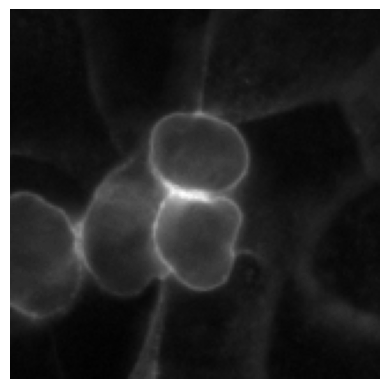

In [151]:
# export membrane tag around aligned mitoses
ROI_size=80

for n, m in enumerate(stack.mitoses):
    daughter_frame=m.index[-1][-1]
    daughter_1=stack.frames[daughter_frame].cells[m['cell_number'].iloc[-2]]
    daughter_2=stack.frames[daughter_frame].cells[m['cell_number'].iloc[-1]]

    y,x=((daughter_1.centroid+daughter_2.centroid)/2).astype(int) # find center of mitosis by daughter centroids
    theta_D=np.arctan2(*np.diff(m.iloc[-2:,1:], axis=0)[0]) # compute division angle
    
    unrotated=index_boundaries(stack.frames[daughter_frame].img, x, y, ROI_size*2) # get large region around mitosis (4*ROI_size square)
    rotated=ndimage.rotate(unrotated, angle=theta_D/np.pi*180-90, reshape=False, order=3)[ROI_size:3*ROI_size, ROI_size:3*ROI_size] # rotate division angle to vertical, crop into 2*ROI_size box
    
    plt.imshow(rotated, cmap='gray')
    plt.axis('off')
    save_folder=stack.name.replace('segmented','PCA_aligned_mitoses')
    break
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)
    #plt.imsave(f'{save_folder}{n}.tiff', rotated, cmap='gray')
    #plt.show()

### $\theta_P$ vs. $\theta_J$ stills

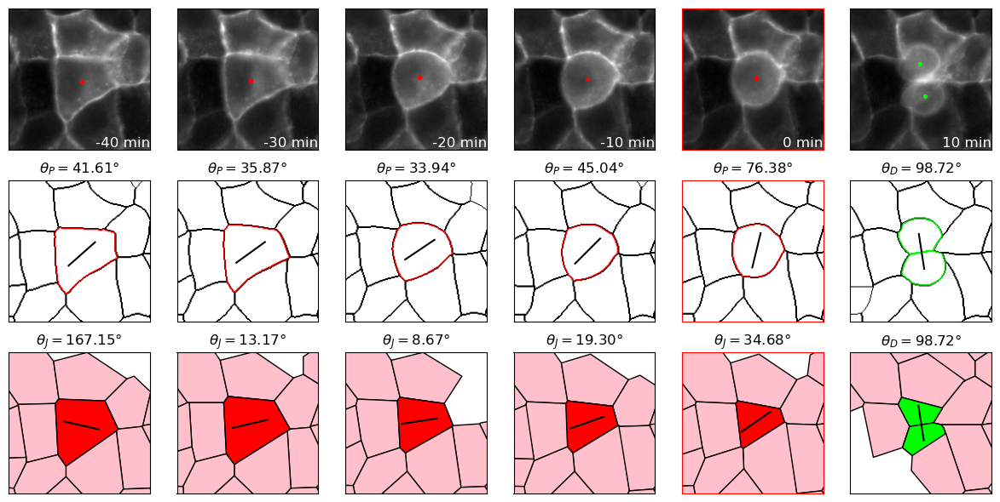

In [59]:
num_columns=min(6, len(mother)+1)
fig, axes = plt.subplots(3, num_columns, subplot_kw={'aspect':'equal'}, figsize=(num_columns*2,6))

for ax in axes.flatten():
    ax.set_xticks([])
    ax.set_yticks([])

daughter_frame=m.index[-1][-1]
daughter_1=stack.frames[daughter_frame].cells[m['cell_number'].iloc[-2]]
daughter_2=stack.frames[daughter_frame].cells[m['cell_number'].iloc[-1]]

y,x=((daughter_1.centroid+daughter_2.centroid)/2).astype(int)

# mother cell frames
for [imgAx, outlineAx, vertexAx], (frame_number, cell_number) in zip(reversed(axes[:,:-1].T), np.flip(np.array(mother.reset_index())[-5:,:2].astype(int), axis=0)):
    mother_cell=stack.frames[frame_number].cells[cell_number]
    imgAx.imshow(np.sqrt(stack.frames[frame_number].img)[max(y-ROI_size,0):y+ROI_size,max(x-ROI_size,0):x+ROI_size], cmap='gray')
    outlineAx.imshow(stack.frames[frame_number].outlines[max(y-ROI_size,0):y+ROI_size,max(x-ROI_size,0):x+ROI_size]!=0, cmap='gray_r')
    try:
        vertexAx.add_collection(stack.frames[frame_number].cell_polygons(fc='pink',linewidths=1))
    except AttributeError:
        continue

    imgAx.scatter(*(np.flip(mother_cell.centroid)-[x-ROI_size,y-ROI_size]), color='red', s=8)
    outlineAx.plot(*np.subtract(mother_cell.outline, [x-ROI_size,y-ROI_size]).T, color='red', linewidth=1)

    theta_P=mother_cell.perimeter_axis()
    outlineAx.set_title(r'$\theta_P={:.2f}\degree$'.format((-theta_P/np.pi*180)%180))
    vector_P=np.array([np.cos(theta_P), np.sin(theta_P)])
    outlineAx.plot(*np.add(np.array([vector_P*20, vector_P*-20]),np.flip(mother_cell.centroid-[y-ROI_size,x-ROI_size])).T, color='k')
    try:
        vertexAx.add_patch(Polygon(np.flip(mother_cell.sorted_vertices,axis=1), fc='red', ec='k', linewidth=1))
    except AttributeError:
        continue
    theta_J=mother_cell.TCJ_axis()
    vector_J=np.array([np.cos(theta_J), np.sin(theta_J)])
    vertexAx.plot(*np.add(np.array([vector_J*20, vector_J*-20]),np.flip(mother_cell.centroid)).T, color='k')
    vertexAx.set_title(r'$\theta_J={:.2f}\degree$'.format((-theta_J/np.pi*180)%180))
    if frame_number==mother_roundframe:
        measured_theta_J=theta_J
        measured_theta_P=theta_P
# final column: daughter cell frames
axes[0,-1].imshow(np.sqrt(stack.frames[daughter_frame].img)[max(y-ROI_size,0):y+ROI_size,max(x-ROI_size,0):x+ROI_size], vmax=1, cmap='gray')
axes[1,-1].imshow(stack.frames[daughter_frame].outlines[max(y-ROI_size,0):y+ROI_size,max(x-ROI_size,0):x+ROI_size]!=0, cmap='gray_r')
try:
    axes[2,-1].add_collection(stack.frames[daughter_frame].cell_polygons(fc='pink',linewidths=1))
except AttributeError:
    print(mitosis_number)
    raise
for daughter_cell in [daughter_1, daughter_2]:
    axes[0,-1].scatter(*(np.flip(daughter_cell.centroid)-[x-ROI_size,y-ROI_size]), color='lime', s=8)
    axes[1,-1].plot(*np.subtract(daughter_cell.outline, [x-ROI_size,y-ROI_size]).T, color='lime', linewidth=1)
    try:
        axes[2,-1].add_patch(Polygon(np.flip(daughter_cell.sorted_vertices,axis=1), fc='lime', ec='k', linewidth=1))
    except AttributeError:
        pass

# draw actual division orientations
theta_D=np.arctan2(*np.diff(m.iloc[-2:,1:], axis=0)[0])
axes[1,-1].set_title(r'$\theta_D={:.2f}\degree$'.format((180-theta_D/np.pi*180)%180))
axes[2,-1].set_title(r'$\theta_D={:.2f}\degree$'.format((180-theta_D/np.pi*180)%180))

vector_D=np.array([np.cos(theta_D), np.sin(theta_D)])
axes[1,-1].plot(*(np.array([vector_D*20, vector_D*-20]).T+ROI_size), color='k')
axes[2,-1].plot(*np.add(np.array([vector_D*20, vector_D*-20]),[x,y]).T, color='k')

# set axis limits for lower row
for vertexAx in axes[2]:
    vertexAx.set_xlim(x-ROI_size,x+ROI_size)
    vertexAx.set_ylim(y+ROI_size,y-ROI_size)

# add timestamps
for n, imgAx in enumerate(reversed(axes[0])):
    tminus=-(n+frame_t0)*10
    imgAx.annotate('{} min'.format(tminus), xy=(1, 0),xycoords='axes fraction', fontsize=12, color='white', horizontalalignment='right', verticalalignment='bottom')
    #imgAx.text(x=195,y=195,s='{} min'.format(tminus), color='white', horizontalalignment='right',verticalalignment='bottom', fontsize=12)#, weight='bold')

for ax in axes[:,frame_t0-1]:
    for spine in ax.spines.values():
        spine.set_edgecolor('red')

fig.tight_layout()
plt.savefig('Plots/ASCB 2023/JD_glass-WT_3-48.jpg', dpi=300)
#plt.close()
plt.show()

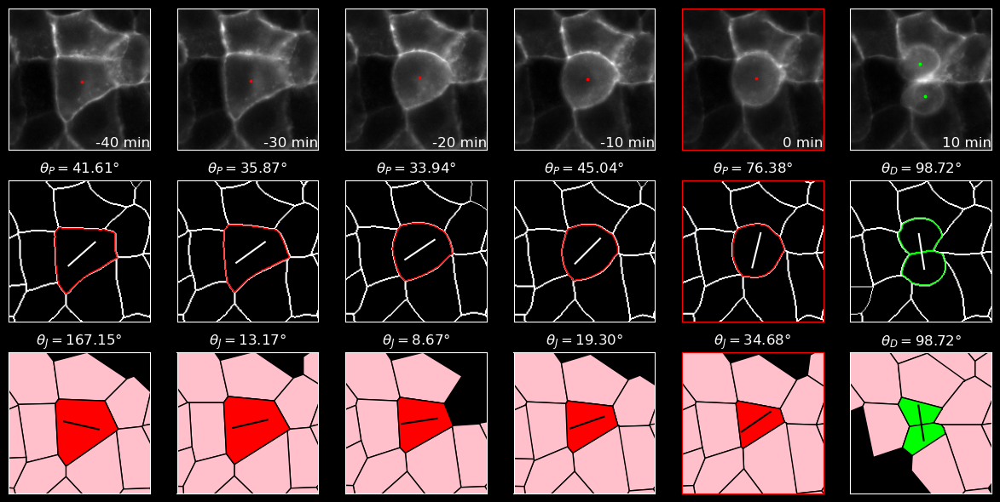

In [43]:
ROI_size=80

stack=JD_glass
if not hasattr(stack, 'mitoses'):
    stack.get_mitoses()

for frame in stack.frames:
    if not hasattr(frame, 'good_cell_indices'):
        frame.get_TCJs()

for mitosis_number, m in enumerate([stack.mitoses[48]]):    
    particle_IDs=m.index.get_level_values(0)
    mother_lastframe=m.index.get_level_values(1)[0]

    mother=stack.tracked_centroids[stack.tracked_centroids['particle']==particle_IDs[0]]
    mother=mother.set_index('frame')

    circularity=[]

    for frame in range(mother_lastframe-3, mother_lastframe+1):
        if frame in mother.index:
            mother_cell=stack.frames[frame].cells[mother.cell_number.loc[frame]]
            circularity.append(mother_cell.circularity)
        else: # mother cell not in frame
            circularity.append(np.nan)

    mother_roundframe=np.arange(mother_lastframe-3, mother_lastframe+1)[np.nanargmax(circularity)]
    frame_t0=np.nanargmax(circularity)-len(circularity)

    measurement_point=mother.reset_index()[['frame','cell_number']].iloc[frame_t0]
    if not measurement_point['cell_number'] in stack.frames[measurement_point['frame']].good_cell_indices:
        continue # won't get a measurement of TCJ angle, move on

    with plt.style.context('dark_background'):
        num_columns=min(6, len(mother)+1)
        fig, axes = plt.subplots(3, num_columns, subplot_kw={'aspect':'equal'}, figsize=(num_columns*2,6))

        for ax in axes.flatten():
            ax.set_xticks([])
            ax.set_yticks([])

        daughter_frame=m.index[-1][-1]
        daughter_1=stack.frames[daughter_frame].cells[m['cell_number'].iloc[-2]]
        daughter_2=stack.frames[daughter_frame].cells[m['cell_number'].iloc[-1]]

        y,x=((daughter_1.centroid+daughter_2.centroid)/2).astype(int)

        # mother cell frames
        for [imgAx, outlineAx, vertexAx], (frame_number, cell_number) in zip(reversed(axes[:,:-1].T), np.flip(np.array(mother.reset_index())[-5:,:2].astype(int), axis=0)):
            mother_cell=stack.frames[frame_number].cells[cell_number]
            imgAx.imshow(stack.frames[frame_number].img[max(y-ROI_size,0):y+ROI_size,max(x-ROI_size,0):x+ROI_size], cmap='gray')
            outlineAx.imshow(stack.frames[frame_number].outlines[max(y-ROI_size,0):y+ROI_size,max(x-ROI_size,0):x+ROI_size]!=0, cmap='gray')
            try:
                vertexAx.add_collection(stack.frames[frame_number].cell_polygons(fc='pink',linewidths=1))
            except AttributeError:
                continue

            imgAx.scatter(*(np.flip(mother_cell.centroid)-[x-ROI_size,y-ROI_size]), color='red', s=3)
            outlineAx.plot(*np.subtract(mother_cell.outline, [x-ROI_size,y-ROI_size]).T, color='red', linewidth=1)

            theta_P=mother_cell.perimeter_axis()
            outlineAx.set_title(r'$\theta_P={:.2f}\degree$'.format((-theta_P/np.pi*180)%180))
            vector_P=np.array([np.cos(theta_P), np.sin(theta_P)])
            outlineAx.plot(*np.add(np.array([vector_P*20, vector_P*-20]),np.flip(mother_cell.centroid-[y-ROI_size,x-ROI_size])).T, color='white')
            try:
                vertexAx.add_patch(Polygon(np.flip(mother_cell.sorted_vertices,axis=1), fc='red', ec='k', linewidth=1))
            except AttributeError:
                continue
            theta_J=mother_cell.TCJ_axis()
            vector_J=np.array([np.cos(theta_J), np.sin(theta_J)])
            vertexAx.plot(*np.add(np.array([vector_J*20, vector_J*-20]),np.flip(mother_cell.centroid)).T, color='k')
            vertexAx.set_title(r'$\theta_J={:.2f}\degree$'.format((-theta_J/np.pi*180)%180))
            if frame_number==mother_roundframe:
                measured_theta_J=theta_J
                measured_theta_P=theta_P
        # final column: daughter cell frames
        axes[0,-1].imshow(stack.frames[daughter_frame].img[max(y-ROI_size,0):y+ROI_size,max(x-ROI_size,0):x+ROI_size], cmap='gray')
        axes[1,-1].imshow(stack.frames[daughter_frame].outlines[max(y-ROI_size,0):y+ROI_size,max(x-ROI_size,0):x+ROI_size]!=0, cmap='gray')
        try:
            axes[2,-1].add_collection(stack.frames[daughter_frame].cell_polygons(fc='pink',linewidths=1))
        except AttributeError:
            print(mitosis_number)
            continue
        for daughter_cell in [daughter_1, daughter_2]:
            axes[0,-1].scatter(*(np.flip(daughter_cell.centroid)-[x-ROI_size,y-ROI_size]), color='lime', s=3)
            axes[1,-1].plot(*np.subtract(daughter_cell.outline, [x-ROI_size,y-ROI_size]).T, color='lime', linewidth=1)
            try:
                axes[2,-1].add_patch(Polygon(np.flip(daughter_cell.sorted_vertices,axis=1), fc='lime', ec='k', linewidth=1))
            except AttributeError:
                pass

        # draw actual division orientations
        theta_D=np.arctan2(*np.diff(m.iloc[-2:,1:], axis=0)[0])
        axes[1,-1].set_title(r'$\theta_D={:.2f}\degree$'.format((180-theta_D/np.pi*180)%180))
        axes[2,-1].set_title(r'$\theta_D={:.2f}\degree$'.format((180-theta_D/np.pi*180)%180))

        vector_D=np.array([np.cos(theta_D), np.sin(theta_D)])
        axes[1,-1].plot(*(np.array([vector_D*20, vector_D*-20]).T+ROI_size), color='white')
        axes[2,-1].plot(*np.add(np.array([vector_D*20, vector_D*-20]),[x,y]).T, color='k')

        # set axis limits for lower row
        for vertexAx in axes[2]:
            vertexAx.set_xlim(x-ROI_size,x+ROI_size)
            vertexAx.set_ylim(y+ROI_size,y-ROI_size)

        # add timestamps
        for n, imgAx in enumerate(reversed(axes[0])):
            tminus=-(n+frame_t0)*10
            imgAx.annotate('{} min'.format(tminus), xy=(1, 0),xycoords='axes fraction', fontsize=12, color='white', horizontalalignment='right', verticalalignment='bottom')
            #imgAx.text(x=195,y=195,s='{} min'.format(tminus), color='white', horizontalalignment='right',verticalalignment='bottom', fontsize=12)#, weight='bold')

        for ax in axes[:,frame_t0-1]:
            for spine in ax.spines.values():
                spine.set_edgecolor('red')

        fig.tight_layout()
        #plt.savefig(save_path+'{}-{}.jpg'.format(os.path.basename(os.path.dirname(stack.name)), mitosis_number), dpi=300)
        #plt.close()
        plt.show()

In [137]:
stack=Stack(datasets['JD_glass'][1], load_img=True)

In [140]:
ROI_size=80
for stack_path in tqdm(datasets['JD_glass']):
    #stack.load_img()
    #stack.track_centroids()
    #stack.get_mitoses()
    #stack.get_mitoses(circ_limit=0,bbox_scale=1)
    stack=Stack(stack_path, load_img=True)
    if not hasattr(stack, 'mitoses'):
        stack.get_mitoses()
    
    for frame in stack.frames:
        if not hasattr(frame, 'good_cell_indices'):
            frame.get_TCJs()
    
    for mitosis_number, m in enumerate(stack.mitoses):    
        particle_IDs=m.index.get_level_values(0)
        mother_lastframe=m.index.get_level_values(1)[0]

        mother=stack.tracked_centroids[stack.tracked_centroids['particle']==particle_IDs[0]]
        mother=mother.set_index('frame')

        circularity=[]

        for frame in range(mother_lastframe-3, mother_lastframe+1):
            if frame in mother.index:
                mother_cell=stack.frames[frame].cells[mother.cell_number.loc[frame]]
                circularity.append(mother_cell.circularity)
            else: # mother cell not in frame
                circularity.append(np.nan)

        mother_roundframe=np.arange(mother_lastframe-3, mother_lastframe+1)[np.nanargmax(circularity)]
        frame_t0=np.nanargmax(circularity)-len(circularity)
        
        measurement_point=mother.reset_index()[['frame','cell_number']].iloc[frame_t0]
        if not measurement_point['cell_number'] in stack.frames[measurement_point['frame']].good_cell_indices:
            continue # won't get a measurement of TCJ angle, move on
        
        with plt.style.context('dark_background'):
            num_columns=min(6, len(mother)+1)
            fig, axes = plt.subplots(3, num_columns, subplot_kw={'aspect':'equal'}, figsize=(num_columns*2,6))

            for ax in axes.flatten():
                ax.set_xticks([])
                ax.set_yticks([])

            daughter_frame=m.index[-1][-1]
            daughter_1=stack.frames[daughter_frame].cells[m['cell_number'].iloc[-2]]
            daughter_2=stack.frames[daughter_frame].cells[m['cell_number'].iloc[-1]]

            y,x=((daughter_1.centroid+daughter_2.centroid)/2).astype(int)

            # mother cell frames
            for [imgAx, outlineAx, vertexAx], (frame_number, cell_number) in zip(reversed(axes[:,:-1].T), np.flip(np.array(mother.reset_index())[-5:,:2].astype(int), axis=0)):
                mother_cell=stack.frames[frame_number].cells[cell_number]
                imgAx.imshow(stack.frames[frame_number].img[max(y-ROI_size,0):y+ROI_size,max(x-ROI_size,0):x+ROI_size], cmap='gray')
                outlineAx.imshow(stack.frames[frame_number].outlines[max(y-ROI_size,0):y+ROI_size,max(x-ROI_size,0):x+ROI_size]!=0, cmap='gray')
                try:
                    vertexAx.add_collection(stack.frames[frame_number].cell_polygons(fc='pink',linewidths=1))
                except AttributeError:
                    continue

                imgAx.scatter(*(np.flip(mother_cell.centroid)-[x-ROI_size,y-ROI_size]), color='red', s=3)
                outlineAx.plot(*np.subtract(mother_cell.outline, [x-ROI_size,y-ROI_size]).T, color='red', linewidth=1)
                
                theta_P=mother_cell.perimeter_axis()
                outlineAx.set_title(r'$\theta_P={:.2f}\degree$'.format((-theta_P/np.pi*180)%180))
                vector_P=np.array([np.cos(theta_P), np.sin(theta_P)])
                outlineAx.plot(*np.add(np.array([vector_P*20, vector_P*-20]),np.flip(mother_cell.centroid-[y-ROI_size,x-ROI_size])).T, color='white')
                try:
                    vertexAx.add_patch(Polygon(np.flip(mother_cell.sorted_vertices,axis=1), fc='red', ec='k', linewidth=1))
                except AttributeError:
                    continue
                theta_J=mother_cell.TCJ_axis()
                vector_J=np.array([np.cos(theta_J), np.sin(theta_J)])
                vertexAx.plot(*np.add(np.array([vector_J*20, vector_J*-20]),np.flip(mother_cell.centroid)).T, color='k')
                vertexAx.set_title(r'$\theta_J={:.2f}\degree$'.format((-theta_J/np.pi*180)%180))
                if frame_number==mother_roundframe:
                    measured_theta_J=theta_J
                    measured_theta_P=theta_P
            # final column: daughter cell frames
            axes[0,-1].imshow(stack.frames[daughter_frame].img[max(y-ROI_size,0):y+ROI_size,max(x-ROI_size,0):x+ROI_size], cmap='gray')
            axes[1,-1].imshow(stack.frames[daughter_frame].outlines[max(y-ROI_size,0):y+ROI_size,max(x-ROI_size,0):x+ROI_size]!=0, cmap='gray')
            try:
                axes[2,-1].add_collection(stack.frames[daughter_frame].cell_polygons(fc='pink',linewidths=1))
            except AttributeError:
                print(mitosis_number)
                continue
            for daughter_cell in [daughter_1, daughter_2]:
                axes[0,-1].scatter(*(np.flip(daughter_cell.centroid)-[x-ROI_size,y-ROI_size]), color='lime', s=3)
                axes[1,-1].plot(*np.subtract(daughter_cell.outline, [x-ROI_size,y-ROI_size]).T, color='lime', linewidth=1)
                try:
                    axes[2,-1].add_patch(Polygon(np.flip(daughter_cell.sorted_vertices,axis=1), fc='lime', ec='k', linewidth=1))
                except AttributeError:
                    pass

            # draw actual division orientations
            theta_D=np.arctan2(*np.diff(m.iloc[-2:,1:], axis=0)[0])
            axes[1,-1].set_title(r'$\theta_D={:.2f}\degree$'.format((180-theta_D/np.pi*180)%180))
            axes[2,-1].set_title(r'$\theta_D={:.2f}\degree$'.format((180-theta_D/np.pi*180)%180))

            vector_D=np.array([np.cos(theta_D), np.sin(theta_D)])
            axes[1,-1].plot(*(np.array([vector_D*20, vector_D*-20]).T+ROI_size), color='white')
            axes[2,-1].plot(*np.add(np.array([vector_D*20, vector_D*-20]),[x,y]).T, color='k')

            # set axis limits for lower row
            for vertexAx in axes[2]:
                vertexAx.set_xlim(x-ROI_size,x+ROI_size)
                vertexAx.set_ylim(y+ROI_size,y-ROI_size)

            # add timestamps
            for n, imgAx in enumerate(reversed(axes[0])):
                tminus=-(n+frame_t0)*10
                imgAx.annotate('{} min'.format(tminus), xy=(1, 0),xycoords='axes fraction', fontsize=12, color='white', horizontalalignment='right', verticalalignment='bottom')
                #imgAx.text(x=195,y=195,s='{} min'.format(tminus), color='white', horizontalalignment='right',verticalalignment='bottom', fontsize=12)#, weight='bold')
            
            for ax in axes[:,frame_t0-1]:
                for spine in ax.spines.values():
                    spine.set_edgecolor('red')
            
            fig.tight_layout()
            if (np.pi/2-np.abs((measured_theta_J-measured_theta_P)%np.pi-np.pi/2))>np.pi/6:
                deviation_folder='large_deviation'
            elif (np.pi/2-np.abs((measured_theta_J-measured_theta_P)%np.pi-np.pi/2))>np.pi/12:
                deviation_folder='medium_deviation'
            else:
                deviation_folder='typical_deviation'
            
            if (np.pi/2-np.abs((measured_theta_J-theta_D)%np.pi-np.pi/2))<(np.pi/2-np.abs((measured_theta_P-theta_D)%np.pi-np.pi/2)):
                favors_folder='favors_junctions'
            else:
                favors_folder='favors_perimeter'
            
            save_path='Plots/mitosis_angles/JD_glass/{}/{}/'.format(deviation_folder, favors_folder)
            if not os.path.exists(save_path):
                os.makedirs(save_path)
            plt.savefig(save_path+'{}-{}.jpg'.format(os.path.basename(os.path.dirname(stack.name)), mitosis_number), dpi=300)
            plt.close()

100%|██████████████████████| 70/70 [1:57:53<00:00, 101.05s/it]


### Interphase Shape vs. TCJ Axis

In [459]:
glass_division_data=np.load(f'division_axes/JD_glass2.npy')
col_division_data=np.load(f'division_axes/JD_4mgcolCL.npy')

In [25]:
division_data=np.load('RAM_dump/division_axes/acatGFP.npy')

(0.0, 2.0053522829578814)

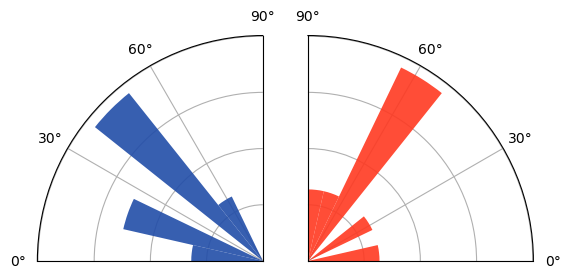

In [26]:
TCJ_axes=division_data[:,:10]
perimeter_axes=division_data[:,10:20]
division_axes=division_data[:,-1]
perimeter_zeroed=np.abs(np.subtract(perimeter_axes.T, division_axes).T)
TCJ_zeroed=np.abs(np.subtract(TCJ_axes.T, division_axes).T)

fig, axes=plt.subplots(1,2,subplot_kw={'projection':'polar'})

large_error=np.where((np.pi/2-np.abs((TCJ_zeroed[:,-1]-perimeter_zeroed[:,-1])%np.pi-np.pi/2))>np.pi/4)
for ax in axes:
    ax.set_xlim(0,np.pi/2)
    ax.set_yticklabels([])

axes[0].hist(np.abs((perimeter_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2)[large_error], bins=np.linspace(0,np.pi/2,8), fc='#214DA8', zorder=2, alpha=0.9, density=True)#, histtype='step', linewidth=2)
axes[0].set_theta_zero_location("W")
axes[0].set_theta_direction(-1)
axes[1].hist(np.abs((TCJ_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2)[large_error], bins=np.linspace(0,np.pi/2,8), fc='#FF3921', zorder=2, alpha=0.9, density=True)#, histtype='step', linewidth=2)

axes[1].set_ylim(axes[0].get_ylim())

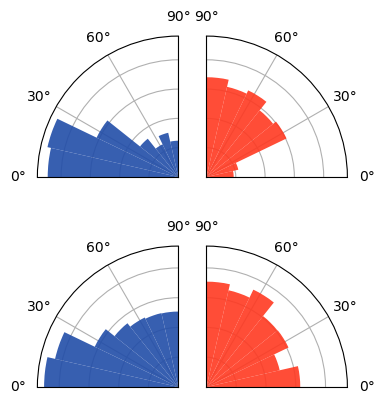

In [467]:
fig, all_axes=plt.subplots(2,2, subplot_kw={'projection':'polar'}, figsize=(4,5))

for division_data, axes in zip([glass_division_data, col_division_data], all_axes):
    TCJ_axes=division_data[:,:10]
    perimeter_axes=division_data[:,10:20]
    division_axes=division_data[:,-1]
    perimeter_zeroed=np.abs(np.subtract(perimeter_axes.T, division_axes).T)
    TCJ_zeroed=np.abs(np.subtract(TCJ_axes.T, division_axes).T)
    #ellipse_zeroed=np.abs(np.subtract(ellipse_axes.T, division_axes).T)

    large_error=np.where((np.pi/2-np.abs((TCJ_zeroed[:,-1]-perimeter_zeroed[:,-1])%np.pi-np.pi/2))>np.pi/4)
    for ax in axes:
        ax.set_xlim(0,np.pi/2)
        ax.set_yticklabels([])
    
    axes[0].hist(np.abs((perimeter_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2)[large_error], bins=np.linspace(0,np.pi/2,8), fc='#214DA8', zorder=2, alpha=0.9, density=True)#, histtype='step', linewidth=2)
    axes[0].set_theta_zero_location("W")
    axes[0].set_theta_direction(-1)
    axes[1].hist(np.abs((TCJ_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2)[large_error], bins=np.linspace(0,np.pi/2,8), fc='#FF3921', zorder=2, alpha=0.9, density=True)#, histtype='step', linewidth=2)
    
    axes[1].set_ylim(axes[0].get_ylim())

#plt.savefig('Plots/ASCB 2023/divisionorientation.jpg', dpi=300)

In [ ]:
for dataset, dataset_name in zip([stacks], ['acatGFP']):
    # load and export division angles over time
    TCJ_axes=[]
    perimeter_axes=[]
    #ellipse_axes=[]
    division_axes=[]
    circularities=[]
    # Preallocate memory for lists
    TCJ_axes = np.empty((len(dataset), 10))
    perimeter_axes = np.empty((len(dataset), 10))
    division_axes = np.empty(len(dataset))

    for i, stack in enumerate(tqdm(dataset)):
        if not hasattr(stack, 'mitoses'):
            stack.get_mitoses(adaptive_step=0.96, adaptive_stop=2)

        for m in stack.mitoses:
            particle_IDs = m.index.get_level_values(0)
            mother_lastframe = m.index.get_level_values(1)[0]

            mother = stack.tracked_centroids[stack.tracked_centroids['particle'] == particle_IDs[0]]
            mother = mother.set_index('frame')

            circularity = []

            for frame in range(mother_lastframe - 4, mother_lastframe + 1):
                if frame in mother.index:
                    mother_cell = stack.frames[frame].cells[mother.cell_number.loc[frame]]
                    mother_cell.perimeter_axis()
                    circularity.append(mother_cell.circ_P)
                else:  # mother cell not in frame
                    circularity.append(np.nan)

            mother_roundframe = np.arange(mother_lastframe - 4, mother_lastframe + 1)[np.argmax(circularity)]
            circularities.append(np.nanmax(circularity))

            for j, frame in enumerate(range(mother_roundframe - 9, mother_roundframe + 1)):
                if not hasattr(stack.frames[frame], 'good_cell_indices'):
                    stack.frames[frame].get_TCJs()

                if frame in mother.index and mother.cell_number.loc[frame] in stack.frames[frame].good_cell_indices:
                    mother_cell = stack.frames[frame].cells[mother.cell_number.loc[frame]]
                    TCJ_axes[i, j] = mother_cell.TCJ_axis()
                    perimeter_axes[i, j] = mother_cell.perimeter_axis()
                else:
                    TCJ_axes[i, j] = np.nan
                    perimeter_axes[i, j] = np.nan

            division_axes[i] = np.arctan2(*np.diff(m.iloc[-2:, 1:], axis=0)[0])

    TCJ_axes = TCJ_axes % np.pi
    perimeter_axes = perimeter_axes % np.pi
    division_axes = division_axes % np.pi

    file_path = f'RAM_dump/division_axes/{dataset_name}.npy'
    export_array = np.concatenate([TCJ_axes, perimeter_axes, division_axes[..., np.newaxis]], axis=1)
    np.save(file_path, export_array)

In [3]:
for dataset_name in ['col_glass']:
    # load and export division angles over time
    TCJ_axes=[]
    perimeter_axes=[]
    #ellipse_axes=[]
    division_axes=[]
    circularities=[]
    for filename in tqdm(datasets[dataset_name], desc=dataset_name):
        stack=Stack(filename)
        #if not hasattr(stack, 'mitoses'):
        stack.get_mitoses()#circ_limit=0,bbox_scale=1)
        for m in stack.mitoses:
            particle_IDs=m.index.get_level_values(0)
            mother_lastframe=m.index.get_level_values(1)[0]

            mother=stack.tracked_centroids[stack.tracked_centroids['particle']==particle_IDs[0]]
            mother=mother.set_index('frame')

            circularity=[]

            for frame in range(mother_lastframe-4, mother_lastframe+1):
                if frame in mother.index:
                    mother_cell=stack.frames[frame].cells[mother.cell_number.loc[frame]]
                    mother_cell.perimeter_axis()
                    circularity.append(mother_cell.circ_P)
                else: # mother cell not in frame
                    circularity.append(np.nan)

            mother_roundframe=np.arange(mother_lastframe-4, mother_lastframe+1)[np.argmax(circularity)]
            circularities.append(np.nanmax(circularity))
            TCJ_axis=[]
            perimeter_axis=[]
            ellipse_axis=[]
            for frame in range(mother_roundframe-9, mother_roundframe+1):
                if not hasattr(stack.frames[frame], 'good_cell_indices'):
                    stack.frames[frame].get_TCJs()

                if frame in mother.index and mother.cell_number.loc[frame] in stack.frames[frame].good_cell_indices: # check that 1. cell is visible in this frame and 2. cell has complete set of vertices
                    mother_cell=stack.frames[frame].cells[mother.cell_number.loc[frame]]
                    #mother_cell.fit_ellipse()
                    TCJ_axis.append(mother_cell.TCJ_axis())
                    perimeter_axis.append(mother_cell.perimeter_axis())
                    #ellipse_axis.append(mother_cell.theta)
                else:
                    TCJ_axis.append(np.nan)
                    perimeter_axis.append(np.nan)
                    #ellipse_axis.append(np.nan)

            TCJ_axes.append(TCJ_axis)
            perimeter_axes.append(perimeter_axis)
            #ellipse_axes.append(ellipse_axis)
            division_axes.append(np.arctan2(*np.diff(m.iloc[-2:,1:], axis=0)[0]))

    TCJ_axes=np.array(TCJ_axes)%np.pi
    perimeter_axes=np.array(perimeter_axes)%np.pi
    #ellipse_axes=np.array(ellipse_axes)%np.pi
    division_axes=np.array(division_axes)%np.pi

    file_path=f'division_axes/{dataset_name}.npy'
    export_array=np.concatenate([TCJ_axes,perimeter_axes,division_axes[..., np.newaxis]], axis=1)
    np.save(file_path, export_array) 


col_glass: 100%|█████████████████████████████████████████████████████████████████████| 40/40 [1:05:02<00:00, 97.56s/it]


942


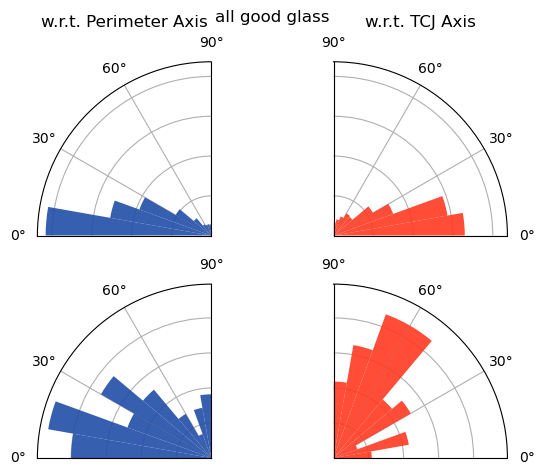

In [144]:
fig, axes=plt.subplots(2,2, subplot_kw={'projection':'polar'})

perimeter_zeroed=np.abs(np.subtract(perimeter_axes.T, division_axes).T)
TCJ_zeroed=np.abs(np.subtract(TCJ_axes.T, division_axes).T)
#ellipse_zeroed=np.abs(np.subtract(ellipse_axes.T, division_axes).T)

large_error=np.where((np.pi/2-np.abs((TCJ_zeroed[:,-1]-perimeter_zeroed[:,-1])%np.pi-np.pi/2))>np.pi/4)
for ax in axes.flatten():
    ax.set_xlim(0,np.pi/2)

axes[0,0].hist(np.abs((perimeter_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2), bins=np.linspace(0,np.pi/2,10), fc='#214DA8', zorder=2, alpha=0.9, density=True)#, histtype='step', linewidth=2)
axes[0,0].set_theta_zero_location("W")
axes[0,0].set_theta_direction(-1)
axes[0,1].hist(np.abs((TCJ_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2), bins=np.linspace(0,np.pi/2,10), fc='#FF3921', zorder=2, alpha=0.9, density=True)#, histtype='step', linewidth=2)
    
axes[1,0].hist(np.abs((perimeter_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2)[large_error], bins=np.linspace(0,np.pi/2,10), fc='#214DA8', zorder=2, alpha=0.9, density=True)#, histtype='step', linewidth=2)
axes[1,0].set_theta_zero_location("W")
axes[1,0].set_theta_direction(-1)
axes[1,1].hist(np.abs((TCJ_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2)[large_error], bins=np.linspace(0,np.pi/2,10), fc='#FF3921', zorder=2, alpha=0.9, density=True)#, histtype='step', linewidth=2)
#axes[2].hist(np.abs((ellipse_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2)[large_error], bins=np.linspace(0,np.pi/2,10), color='C2')#, histtype='step', linewidth=2)

#print(axes[0].get_ylim())
axes[0,1].set_ylim(axes[0,0].get_ylim())
axes[1,1].set_ylim(axes[1,0].get_ylim())

for ax in axes.flatten():
    #ax.set_ylim(0,1.47)
    ax.set_yticklabels([])

#    axes[0].set_title(dataset_name)
axes[0,0].set_title('w.r.t. Perimeter Axis')
axes[0,1].set_title('w.r.t. TCJ Axis')
#
#axes[1,0].set_xlabel(r'$|\theta_J-\theta_D|$', fontsize=14)
#    plt.suptitle(r'MDCK 2mg col, division orientation all cells', fontsize=15)
fig.tight_layout()
fig.suptitle('all good glass')
print(np.sum(~np.isnan(perimeter_zeroed[:,-1])))

In [24]:
dataset_names=['JD_2mgcol','JD_2mgcol2','JD_2mgcol3','JD_4mgcol','JD_2mgcolCL','JD_3_2mgcolCL','JD_4mgcolCL','JD_glass']

datasets=[np.load(f'division_axes/{dataset_name}.npy') for dataset_name in dataset_names]

In [130]:
means=[]
stds=[]
for division_data in [JD_2mgcol, JD_2mgcolCL, JD_4mgcolCL, JD_glass]:
    TCJ_axes=division_data[:,:10]
    perimeter_axes=division_data[:,10:20]
    division_axes=division_data[:,-1]
    std=np.nanstd(TCJ_axes, axis=1)
    means.append(np.nanmean(std))
    stds.append(np.nanstd(std))

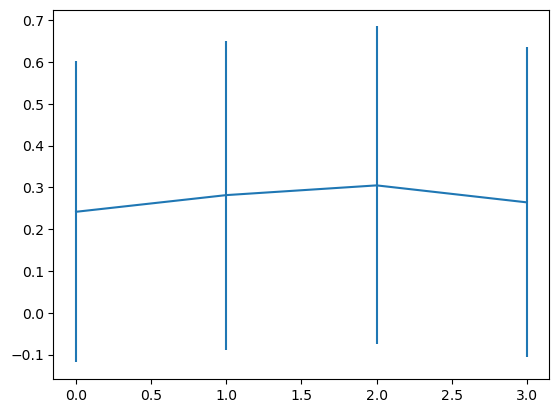

In [134]:
plt.errorbar(range(4), means, yerr=stds)

plt.show()

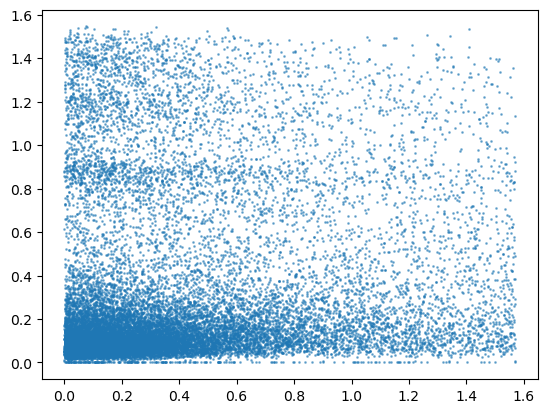

In [123]:
perimeter_stds=np.nanstd(perimeter_axes, axis=1)
perimeter_zeroed=np.abs(np.subtract(perimeter_axes.T, division_axes).T)

plt.scatter(np.abs((perimeter_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2), perimeter_stds, s=1, alpha=0.5)

plt.show()

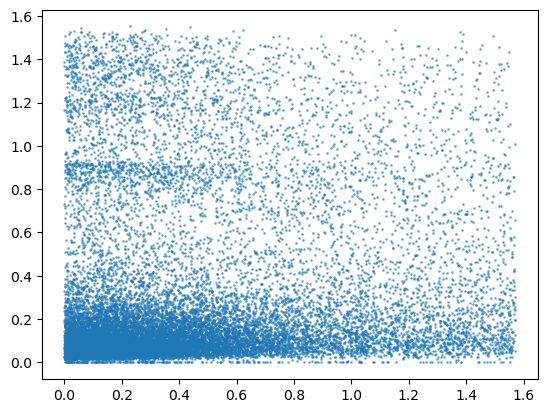

In [122]:
TCJ_stds=np.nanstd(TCJ_axes, axis=1)
TCJ_zeroed=np.abs(np.subtract(TCJ_axes.T, division_axes).T)

plt.scatter(np.abs((TCJ_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2), TCJ_stds, s=1, alpha=0.5)

plt.show()

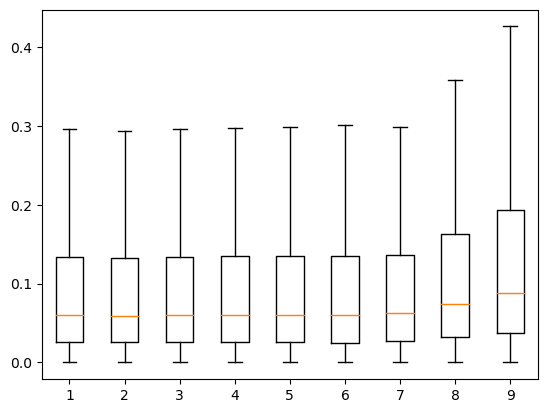

In [111]:
angle_deviations=np.pi/2-np.abs(np.diff(TCJ_axes)%np.pi-np.pi/2)

mask=~np.isnan(angle_deviations)
filtered_data = [d[m] for d, m in zip(angle_deviations.T, mask.T)]

plt.boxplot(filtered_data, showfliers=False)
plt.show()

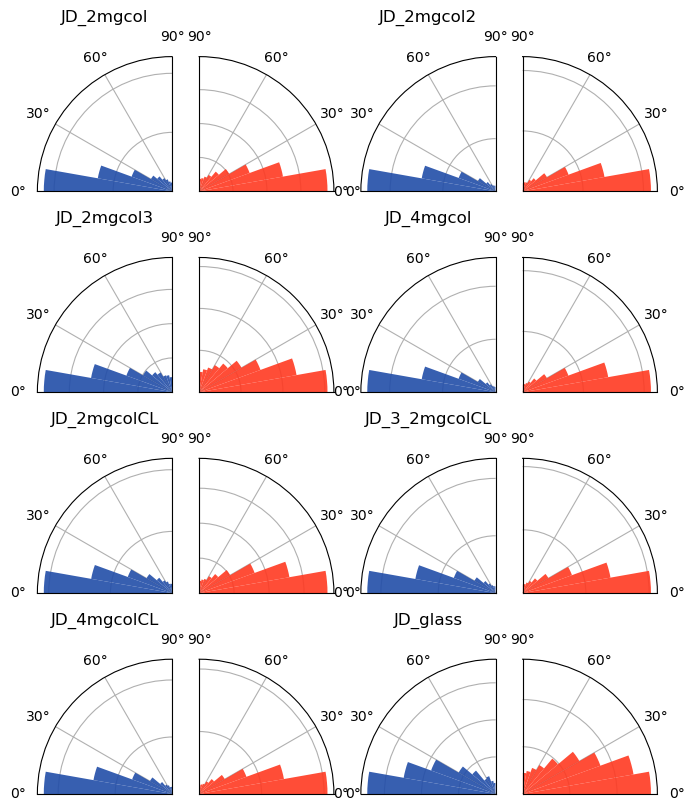

In [26]:
fig, all_axes=plt.subplots(4,4, figsize=(8,10), subplot_kw={'projection':'polar'})
for division_data, dataset_name, axes in zip(datasets, dataset_names, all_axes.reshape(-1,2)):
    TCJ_axes=division_data[:,:10]
    perimeter_axes=division_data[:,10:20]
    division_axes=division_data[:,-1]
    perimeter_zeroed=np.abs(np.subtract(perimeter_axes.T, division_axes).T)
    TCJ_zeroed=np.abs(np.subtract(TCJ_axes.T, division_axes).T)
    #ellipse_zeroed=np.abs(np.subtract(ellipse_axes.T, division_axes).T)

    for ax in axes:
        ax.set_xlim(0,np.pi/2)

    axes[0].hist(np.abs((perimeter_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2), bins=np.linspace(0,np.pi/2,10), color='#214DA8', zorder=2, alpha=0.9, density=True)#, histtype='step', linewidth=2)
    axes[0].set_theta_zero_location("W")
    axes[0].set_theta_direction(-1)
    axes[1].hist(np.abs((TCJ_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2), bins=np.linspace(0,np.pi/2,10), fc='#FF3921', zorder=2, alpha=0.9, density=True)#, histtype='step', linewidth=2)
    #axes[2].hist(np.abs((ellipse_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2), bins=np.linspace(0,np.pi/2,15), color='C2')#, histtype='step', linewidth=2)

    for ax in axes:
        #ax.set_ylim(0,1.9)
        ax.set_yticklabels([])
    axes[0].set_title(dataset_name)
#    axes[0].set_title('w.r.t. Perimeter Axis')
#    axes[1].set_title('w.r.t. TCJ Axis')
#    #axes[2].set_title('w.r.t. Ellipse Long Axis')
#
#    axes[0].set_xlabel(r'$|\theta_J-\theta_D|$', fontsize=14)
#    plt.suptitle(r'MDCK 2mg col, division orientation all cells', fontsize=15)
#    fig.tight_layout()
#
#    #plt.savefig('Plots/10-26 Woolner Lab Meeting/glass-divisionorientation-n{}.jpg'.format(np.sum(~np.isnan(perimeter_zeroed[:,-1]))),dpi=300)
#    plt.show()
plt.show()

In [66]:
dataset_names

['JD_2mgcol',
 'JD_4mgcol',
 'JD_2mgcolCL',
 'JD_3_2mgcolCL',
 'JD_4mgcolCL',
 'JD_glass']

26597
3339


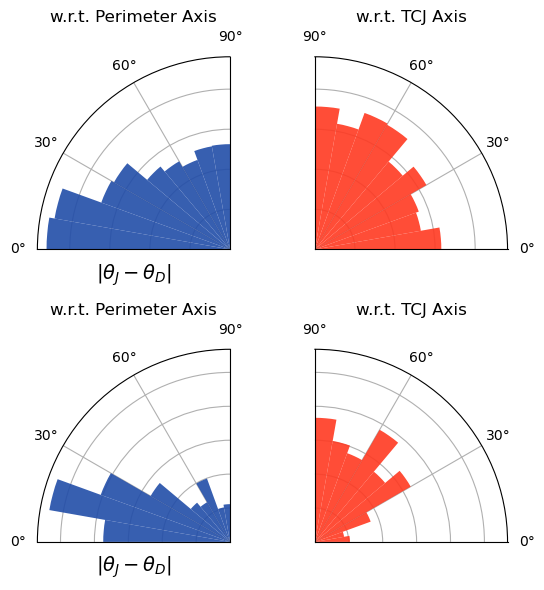

In [73]:
fig, all_axes=plt.subplots(2,2, figsize=(6,6), subplot_kw={'projection':'polar'})
for division_data, dataset_name, axes in zip(datasets[-2:], dataset_names[-2:], all_axes.reshape(-1,2)):
    TCJ_axes=division_data[:,:10]
    perimeter_axes=division_data[:,10:20]
    division_axes=division_data[:,-1]
    
    perimeter_zeroed=np.abs(np.subtract(perimeter_axes.T, division_axes).T)
    TCJ_zeroed=np.abs(np.subtract(TCJ_axes.T, division_axes).T)
    #ellipse_zeroed=np.abs(np.subtract(ellipse_axes.T, division_axes).T)

    large_error=np.where((np.pi/2-np.abs((TCJ_zeroed[:,-1]-perimeter_zeroed[:,-1])%np.pi-np.pi/2))>np.pi/4)
    for ax in axes:
        ax.set_xlim(0,np.pi/2)

    axes[0].hist(np.abs((perimeter_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2)[large_error], bins=np.linspace(0,np.pi/2,10), fc='#214DA8', zorder=2, alpha=0.9, density=True)#, histtype='step', linewidth=2)
    axes[0].set_theta_zero_location("W")
    axes[0].set_theta_direction(-1)
    axes[1].hist(np.abs((TCJ_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2)[large_error], bins=np.linspace(0,np.pi/2,10), fc='#FF3921', zorder=2, alpha=0.9, density=True)#, histtype='step', linewidth=2)
    #axes[2].hist(np.abs((ellipse_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2)[large_error], bins=np.linspace(0,np.pi/2,10), color='C2')#, histtype='step', linewidth=2)
    
    #print(axes[0].get_ylim())
    axes[1].set_ylim(axes[0].get_ylim())
    
    for ax in axes:
        #ax.set_ylim(0,1.47)
        ax.set_yticklabels([])
        
#    axes[0].set_title(dataset_name)
    axes[0].set_title('w.r.t. Perimeter Axis')
    axes[1].set_title('w.r.t. TCJ Axis')
#
    axes[0].set_xlabel(r'$|\theta_J-\theta_D|$', fontsize=14)
#    plt.suptitle(r'MDCK 2mg col, division orientation all cells', fontsize=15)
    fig.tight_layout()
    print(np.sum(~np.isnan(perimeter_zeroed[:,-1])))
#
    plt.savefig('Plots/ASCB 2023/divisionorientation.jpg'.format(np.sum(~np.isnan(perimeter_zeroed[:,-1]))),dpi=300)
#    plt.show()
plt.show()

8171
17103
9814
25737
22198
41261
26597
3339


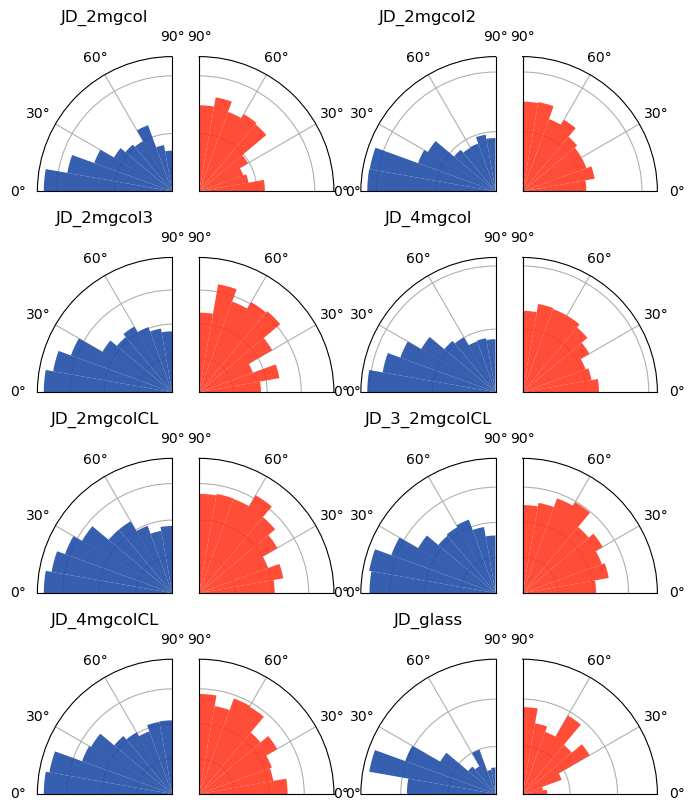

In [31]:
fig, all_axes=plt.subplots(4,4, figsize=(8,10), subplot_kw={'projection':'polar'})
for division_data, dataset_name, axes in zip(datasets, dataset_names, all_axes.reshape(-1,2)):
    TCJ_axes=division_data[:,:10]
    perimeter_axes=division_data[:,10:20]
    division_axes=division_data[:,-1]
    
    perimeter_zeroed=np.abs(np.subtract(perimeter_axes.T, division_axes).T)
    TCJ_zeroed=np.abs(np.subtract(TCJ_axes.T, division_axes).T)
    #ellipse_zeroed=np.abs(np.subtract(ellipse_axes.T, division_axes).T)

    large_error=np.where((np.pi/2-np.abs((TCJ_zeroed[:,-1]-perimeter_zeroed[:,-1])%np.pi-np.pi/2))>np.pi/4)
    for ax in axes:
        ax.set_xlim(0,np.pi/2)

    axes[0].hist(np.abs((perimeter_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2)[large_error], bins=np.linspace(0,np.pi/2,10), fc='#214DA8', zorder=2, alpha=0.9, density=True)#, histtype='step', linewidth=2)
    axes[0].set_theta_zero_location("W")
    axes[0].set_theta_direction(-1)
    axes[1].hist(np.abs((TCJ_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2)[large_error], bins=np.linspace(0,np.pi/2,10), fc='#FF3921', zorder=2, alpha=0.9, density=True)#, histtype='step', linewidth=2)
    #axes[2].hist(np.abs((ellipse_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2)[large_error], bins=np.linspace(0,np.pi/2,10), color='C2')#, histtype='step', linewidth=2)
    
    #print(axes[0].get_ylim())
    axes[1].set_ylim(axes[0].get_ylim())
    
    for ax in axes:
        #ax.set_ylim(0,1.47)
        ax.set_yticklabels([])
        
    axes[0].set_title(dataset_name)
    print(np.sum(~np.isnan(perimeter_zeroed[:,-1])))
#    axes[0].set_title('w.r.t. Perimeter Axis')
#    axes[1].set_title('w.r.t. TCJ Axis')
#    #axes[2].set_title('w.r.t. Ellipse Long Axis')
#
#    axes[0].set_xlabel(r'$|\theta_J-\theta_D|$', fontsize=14)
#    plt.suptitle(r'MDCK 2mg col, division orientation all cells', fontsize=15)
#    fig.tight_layout()
#
#    #plt.savefig('Plots/10-26 Woolner Lab Meeting/glass-divisionorientation-n{}.jpg'.format(np.sum(~np.isnan(perimeter_zeroed[:,-1]))),dpi=300)
#    plt.show()
plt.show()

In [31]:
perimeters=[]
TCJs=[]

for division_data in datasets:
    TCJ_axes=division_data[:,:10]
    perimeter_axes=division_data[:,10:20]
    division_axes=division_data[:,-1]
    
    perimeter_zeroed=np.abs(np.subtract(perimeter_axes.T, division_axes).T)
    TCJ_zeroed=np.abs(np.subtract(TCJ_axes.T, division_axes).T)
    #ellipse_zeroed=np.abs(np.subtract(ellipse_axes.T, division_axes).T)

    large_error=np.where((np.pi/2-np.abs((TCJ_zeroed[:,-1]-perimeter_zeroed[:,-1])%np.pi-np.pi/2))>np.pi/6)
    
    perimeters.append(np.abs((perimeter_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2)[large_error])
    TCJs.append(np.abs((TCJ_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2)[large_error])

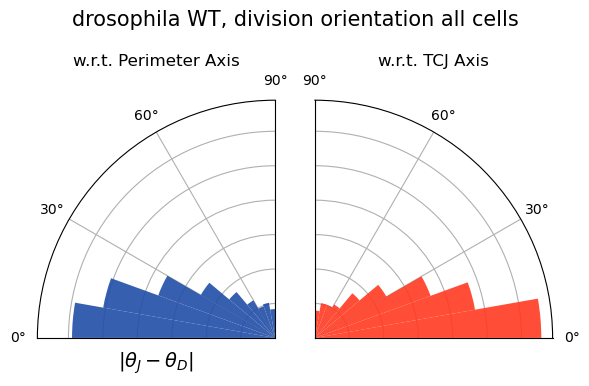

In [438]:
#with plt.style.context('dark_background'):
division_data=np.load(f'division_axes_dicts/drosophila_WT.npy', allow_pickle=True).item()
TCJ_axes=division_data['TCJ_axes']
perimeter_axes=division_data['perimeter_axes']
division_axes=division_data['division_axes']

fig, axes=plt.subplots(1,2, figsize=(6,4), subplot_kw={'projection':'polar'})
perimeter_zeroed=np.abs(np.subtract(perimeter_axes.T, division_axes).T)
TCJ_zeroed=np.abs(np.subtract(TCJ_axes.T, division_axes).T)
#ellipse_zeroed=np.abs(np.subtract(ellipse_axes.T, division_axes).T)

for ax in axes:
    ax.set_xlim(0,np.pi/2)

axes[0].hist(np.abs((perimeter_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2), bins=np.linspace(0,np.pi/2,10), color='#214DA8', zorder=2, alpha=0.9, density=True)#, histtype='step', linewidth=2)
axes[0].set_theta_zero_location("W")
axes[0].set_theta_direction(-1)
axes[1].hist(np.abs((TCJ_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2), bins=np.linspace(0,np.pi/2,10), fc='#FF3921', zorder=2, alpha=0.9, density=True)#, histtype='step', linewidth=2)
#axes[2].hist(np.abs((ellipse_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2), bins=np.linspace(0,np.pi/2,15), color='C2')#, histtype='step', linewidth=2)

for ax in axes:
    #ax.set_ylim(0,1.9)
    ax.set_yticklabels([])

axes[0].set_ylim(axes[1].get_ylim())
axes[0].set_title('w.r.t. Perimeter Axis')
axes[1].set_title('w.r.t. TCJ Axis')
#axes[2].set_title('w.r.t. Ellipse Long Axis')

axes[0].set_xlabel(r'$|\theta_J-\theta_D|$', fontsize=14)
plt.suptitle(r'drosophila WT, division orientation all cells', fontsize=15)
fig.tight_layout()

#plt.savefig('Plots/ASCB 2023/glass-divisionorientation-n{}.jpg'.format(np.sum(~np.isnan(perimeter_zeroed[:,-1]))),dpi=300)
plt.show()

In [445]:
len(perimeter_axes)

2997

164


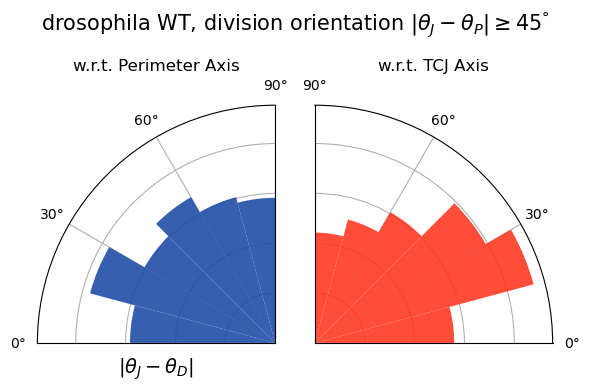

In [444]:
#with plt.style.context('dark_background'):
large_error=np.where((np.pi/2-np.abs((TCJ_zeroed[:,-1]-perimeter_zeroed[:,-1])%np.pi-np.pi/2))>np.pi/4)

fig, axes=plt.subplots(1,2, figsize=(6,4), subplot_kw={'projection':'polar'})

for ax in axes:
    ax.set_xlim(0,np.pi/2)

axes[0].hist(np.abs((perimeter_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2)[large_error], bins=np.linspace(0,np.pi/2,7), color='#214DA8', zorder=2, alpha=0.9, density=True)#, histtype='step', linewidth=2)
axes[0].set_theta_zero_location("W")
axes[0].set_theta_direction(-1)
axes[1].hist(np.abs((TCJ_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2)[large_error], bins=np.linspace(0,np.pi/2,7), fc='#FF3921', zorder=2, alpha=0.9, density=True)#, histtype='step', linewidth=2)
#axes[2].hist(np.abs((ellipse_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2)[large_error], bins=np.linspace(0,np.pi/2,10), color='C2')#, histtype='step', linewidth=2)

for ax in axes:
    #ax.set_ylim(0,1)
    ax.set_yticklabels([])
axes[0].set_ylim(axes[1].get_ylim())
axes[0].set_title('w.r.t. Perimeter Axis')
axes[1].set_title('w.r.t. TCJ Axis')
#axes[2].set_title('w.r.t. Ellipse Long Axis')

axes[0].set_xlabel(r'$|\theta_J-\theta_D|$', fontsize=14)
#fig.text(s=r'$|\theta_J-\theta_D|$', fontsize=14, x=0.5, y=0.07, horizontalalignment='center')
plt.suptitle(r'drosophila WT, division orientation $|\theta_J-\theta_P|\geq 45^\degree$', fontsize=15)
fig.tight_layout()
print(len(large_error[0]))
plt.savefig('Plots/ASCB 2023/drosophila-largeerror-n{}.jpg'.format(len(large_error[0])),dpi=300)
plt.show()

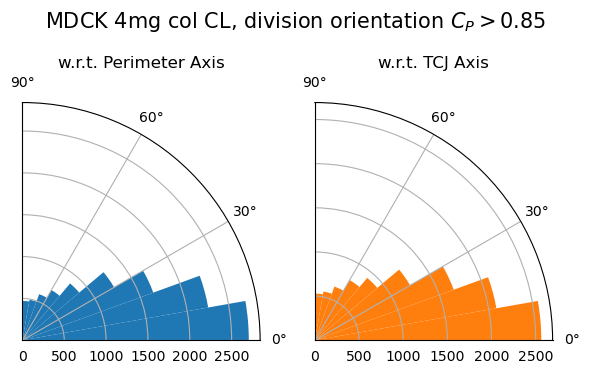

In [26]:
most_circular=np.where(np.array(circularities)>0.85)

fig, axes=plt.subplots(1,2, figsize=(6,4), subplot_kw={'projection':'polar'})

for ax in axes:
    ax.set_xlim(0,np.pi/2)
    
axes[0].hist(np.abs((perimeter_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2)[most_circular], bins=np.linspace(0,np.pi/2,10), color='C0')#, histtype='step', linewidth=2)
axes[1].hist(np.abs((TCJ_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2)[most_circular], bins=np.linspace(0,np.pi/2,10), color='C1')#, histtype='step', linewidth=2)
#axes[2].hist(np.abs((ellipse_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2)[most_circular], bins=np.linspace(0,np.pi/2,10), color='C2')#, histtype='step', linewidth=2)

axes[0].set_title('w.r.t. Perimeter Axis')
axes[1].set_title('w.r.t. TCJ Axis')
#axes[2].set_title('w.r.t. Ellipse Long Axis')

plt.suptitle(r'MDCK 4mg col CL, division orientation $C_P>0.85$', fontsize=15)
fig.tight_layout()

plt.savefig('Plots/4mgcolCL-divisionorientation_circular-n{}.jpg'.format(len(most_circular[0])),dpi=300)
plt.show()

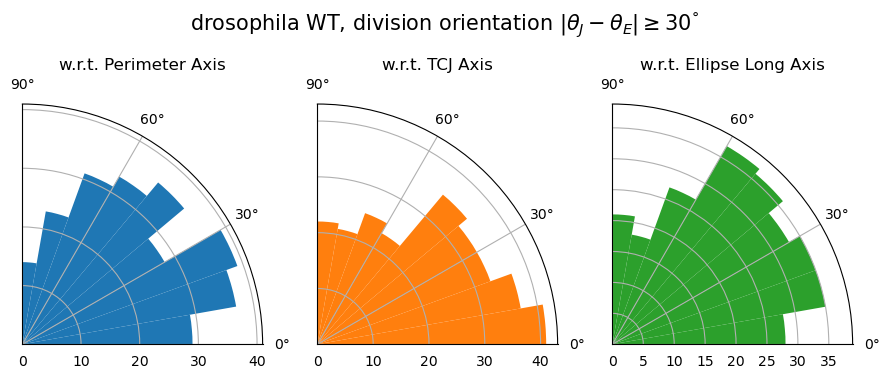

In [109]:
large_error=np.where((np.pi/2-np.abs((TCJ_zeroed[:,-1]-ellipse_zeroed[:,-1])%np.pi-np.pi/2))>np.pi/6)

fig, axes=plt.subplots(1,3, figsize=(9,4), subplot_kw={'projection':'polar'})

for ax in axes:
    ax.set_xlim(0,np.pi/2)
    
axes[0].hist(np.abs((perimeter_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2)[large_error], bins=np.linspace(0,np.pi/2,10), color='C0')#, histtype='step', linewidth=2)
axes[1].hist(np.abs((TCJ_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2)[large_error], bins=np.linspace(0,np.pi/2,10), color='C1')#, histtype='step', linewidth=2)
axes[2].hist(np.abs((ellipse_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2)[large_error], bins=np.linspace(0,np.pi/2,10), color='C2')#, histtype='step', linewidth=2)

axes[0].set_title('w.r.t. Perimeter Axis')
axes[1].set_title('w.r.t. TCJ Axis')
axes[2].set_title('w.r.t. Ellipse Long Axis')

plt.suptitle(r'drosophila WT, division orientation $|\theta_J-\theta_E|\geq 30^\degree$', fontsize=15)
fig.tight_layout()

plt.show()

In [208]:
print(np.sum(np.pi/2-np.abs((perimeter_zeroed[:,-1]-ellipse_zeroed[:,-1])%np.pi-np.pi/2)>np.pi/12))
print(np.sum(np.pi/2-np.abs((perimeter_zeroed[:,-1]-TCJ_zeroed[:,-1])%np.pi-np.pi/2)>np.pi/12))

76
727


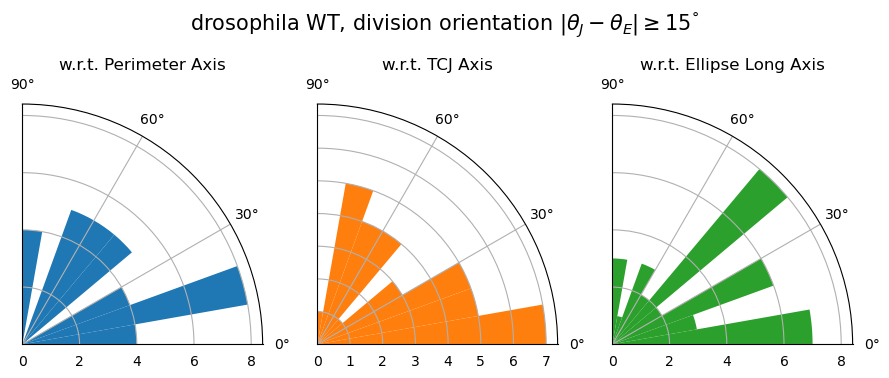

In [134]:
large_error=np.where((np.pi/2-np.abs((perimeter_zeroed[:,-1]-ellipse_zeroed[:,-1])%np.pi-np.pi/2))>np.pi/12)

fig, axes=plt.subplots(1,3, figsize=(9,4), subplot_kw={'projection':'polar'})

for ax in axes:
    ax.set_xlim(0,np.pi/2)
    
axes[0].hist(np.abs((perimeter_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2)[large_error], bins=np.linspace(0,np.pi/2,10), color='C0')#, histtype='step', linewidth=2)
axes[1].hist(np.abs((TCJ_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2)[large_error], bins=np.linspace(0,np.pi/2,10), color='C1')#, histtype='step', linewidth=2)
axes[2].hist(np.abs((ellipse_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2)[large_error], bins=np.linspace(0,np.pi/2,10), color='C2')#, histtype='step', linewidth=2)

axes[0].set_title('w.r.t. Perimeter Axis')
axes[1].set_title('w.r.t. TCJ Axis')
axes[2].set_title('w.r.t. Ellipse Long Axis')

plt.suptitle(r'drosophila WT, division orientation $|\theta_J-\theta_E|\geq 15^\degree$', fontsize=15)
fig.tight_layout()

plt.show()

#### TCJ/Perimeter efficacy vs. Time

In [4]:
division_data=np.load(f'RAM_dump/division_axes/division_axes_dicts/JD_glass2.npy', allow_pickle=True).item()
TCJ_axes=division_data['TCJ_axes']
perimeter_axes=division_data['perimeter_axes']
division_axes=division_data['division_axes']
aspects=division_data['all_aspects']

In [231]:
division_data=np.load(f'division_axes/JD_glass2.npy')
TCJ_axes=division_data[:,:10]
perimeter_axes=division_data[:,10:20]
division_axes=division_data[:,-1]

In [ ]:
np.abs(np.nanquantile(TCJ_zeroed, [0.4,0.6], axis=0)-np.nanmedian(TCJ_zeroed, axis=0))

In [3]:
division_data=np.load(f'RAM_dump/division_axes/division_axes_dicts/drosophila_WT.npy', allow_pickle=True).item()
drosophila_TCJ_axes=division_data['TCJ_axes']
drosophila_perimeter_axes=division_data['perimeter_axes']
drosophila_division_axes=division_data['division_axes']
drosophila_aspects=division_data['all_aspects']

In [23]:
perimeter_zeroed=np.abs((np.subtract(perimeter_axes.T, division_axes).T-np.pi/2)%np.pi-np.pi/2)[:,:-1]
TCJ_zeroed=np.abs((np.subtract(TCJ_axes.T, division_axes).T-np.pi/2)%np.pi-np.pi/2)[:,:-1]

drosophila_perimeter_zeroed=np.abs((np.subtract(drosophila_perimeter_axes.T, drosophila_division_axes).T-np.pi/2)%np.pi-np.pi/2)
drosophila_TCJ_zeroed=np.abs((np.subtract(drosophila_TCJ_axes.T, drosophila_division_axes).T-np.pi/2)%np.pi-np.pi/2)

In [24]:
drosophila_perimeter_zeroed_full=drosophila_perimeter_zeroed.copy()
drosophila_perimeter_zeroed=drosophila_perimeter_zeroed[:,::2]

drosophila_TCJ_zeroed_full=drosophila_TCJ_zeroed.copy()
drosophila_TCJ_zeroed=drosophila_TCJ_zeroed[:,::2]

In [26]:
drosophila_TCJ_zeroed.shape

(2997, 17)

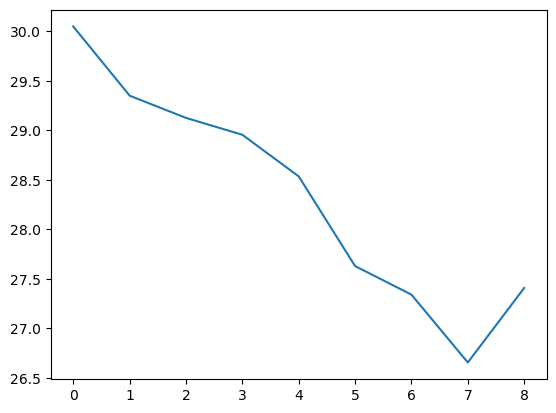

In [22]:
plt.plot(np.degrees(np.nanmean(drosophila_TCJ_zeroed, axis=0)))

In [32]:
len(np.degrees(np.nanmean(drosophila_TCJ_zeroed, axis=0))[3:])

14

In [35]:
# plt dark background
plt.style.use('dark_background')

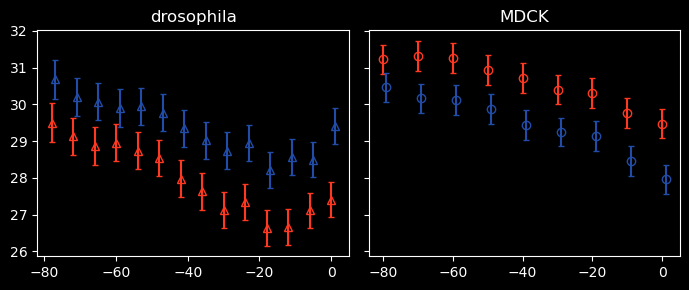

In [38]:
#for zeroed_data in [perimeter_zeroed, TCJ_zeroed, drosophila_perimeter_zeroed, drosophila_TCJ_zeroed]:
#    zeroed_data=np.abs((zeroed_data-np.pi/2)%np.pi-np.pi/2)

fig, [drosAx, mdckAx] = plt.subplots(1,2, figsize=(7,3), sharey=True)
drosAx.errorbar(np.arange(-13,1)*6,np.degrees(np.nanmean(drosophila_TCJ_zeroed, axis=0))[3:],
             yerr=np.degrees(np.nanstd(drosophila_TCJ_zeroed)/np.sqrt((~np.isnan(drosophila_TCJ_zeroed)).sum(axis=0)))[3:],
             fmt='^', color='#FF3921', fillstyle='none', capsize=2)
drosAx.errorbar(np.arange(-13,1)*6+1,np.degrees(np.nanmean(drosophila_perimeter_zeroed, axis=0))[3:],
             yerr=np.degrees(np.nanstd(drosophila_perimeter_zeroed)/np.sqrt((~np.isnan(drosophila_perimeter_zeroed)).sum(axis=0)))[3:],
             fmt='^', color='#214DA8', fillstyle='none', capsize=2)

mdckAx.errorbar(np.arange(-8,1)*10,np.degrees(np.nanmean(TCJ_zeroed, axis=0)),
             yerr=np.degrees(np.nanstd(TCJ_zeroed)/np.sqrt((~np.isnan(TCJ_zeroed)).sum(axis=0))),
             fmt='o', color='#FF3921', fillstyle='none', capsize=2)
mdckAx.errorbar(np.arange(-8,1)*10+1,np.degrees(np.nanmean(perimeter_zeroed, axis=0)),
             yerr=np.degrees(np.nanstd(perimeter_zeroed)/np.sqrt((~np.isnan(perimeter_zeroed)).sum(axis=0))),
             fmt='o', color='#214DA8', fillstyle='none', capsize=2)

#plt.legend()

drosAx.set_title('drosophila')
mdckAx.set_title('MDCK')
#plt.xlabel('time to anaphase (min)')
#drosAx.set_ylabel('mean predicted division angle error')
fig.tight_layout()

plt.savefig('Plots/24-3-15 Lab Meeting/time_vs_TCJefficacy.jpg', dpi=300)
plt.show()

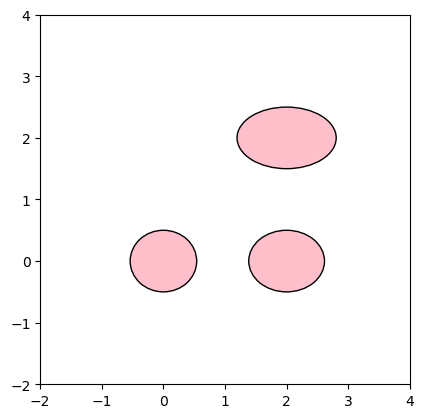

In [347]:
from matplotlib.patches import Ellipse

ells = [Ellipse(xy=[0,0],
                width=1.08, height=1,
                angle=0),
        Ellipse(xy=[2,0],
                width=1.23, height=1,
                angle=0),
        Ellipse(xy=[2,2],
                width=1.61, height=1,
                angle=0),
       ]

fig, ax = plt.subplots()
ax.set(xlim=(-2, 4), ylim=(-2, 4), aspect="equal")

for e in ells:
    ax.add_artist(e)
    e.set_clip_box(ax.bbox)
    #e.set_alpha(0.6)
    e.set_edgecolor('k')
    e.set_facecolor('pink')

plt.savefig('Plots/ASCB 2023/sample_aspects.jpg', dpi=300)
plt.show()

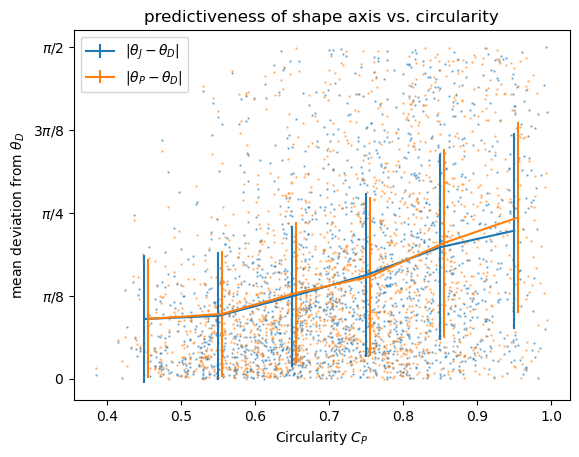

In [115]:
from scipy import stats
bins=np.linspace(0.4,1,7)
bin_centers=bins[:-1]+np.diff(bins)/2

TCJ_data=np.abs((TCJ_zeroed[:,-1][~np.isnan(TCJ_zeroed[:,-1])]+np.pi/2)%np.pi-np.pi/2)
circ_TCJs=np.array(circularities)[~np.isnan(TCJ_zeroed[:,-1])]
plt.scatter(circ_TCJs, TCJ_data, s=0.5, alpha=0.5)

TCJ_binned=stats.binned_statistic(circ_TCJs, TCJ_data, statistic=np.mean, bins=bins)[0]
TCJ_err=stats.binned_statistic(circ_TCJs, TCJ_data, statistic=np.std, bins=bins)[0]
plt.errorbar(x=bin_centers, y=TCJ_binned, yerr=TCJ_err, label=r'|$\theta_J-\theta_D|$')


perimeter_data=np.abs((perimeter_zeroed[:,-1][~np.isnan(perimeter_zeroed[:,-1])]+np.pi/2)%np.pi-np.pi/2)
circ_perimeter=np.array(circularities)[~np.isnan(perimeter_zeroed[:,-1])]
plt.scatter(circ_perimeter, perimeter_data, s=0.5, alpha=0.5)
perimeter_binned=stats.binned_statistic(circ_perimeter, perimeter_data, statistic=np.mean, bins=bins)[0]
perimeter_err=stats.binned_statistic(circ_perimeter, perimeter_data, statistic=np.std, bins=bins)[0]
plt.errorbar(x=bin_centers+0.005, y=perimeter_binned, yerr=perimeter_err, label=r'|$\theta_P-\theta_D|$')

plt.legend()
plt.xlabel('Circularity $C_P$')
plt.yticks([0,np.pi/8,np.pi/4,3*np.pi/8,np.pi/2], labels=['$0$',r'$\pi/8$',r'$\pi/4$',r'$3\pi/8$',r'$\pi/2$'])
plt.ylabel(r'mean deviation from $\theta_D$')
plt.title('predictiveness of shape axis vs. circularity')

plt.show()

In [118]:
theta_J=[]
theta_P=[]
theta_polyP=[]
theta_E=[]
circ=[]
for stack in tqdm(drosophila_WT.stacks):
    for cell in stack.frames[0].good_cells():
        theta_J.append(cell.TCJ_axis())
        theta_P.append(cell.perimeter_axis())
        theta_polyP.append(cell.poly_perimeter_axis())
        cell.fit_ellipse()
        theta_E.append(cell.theta)
        circ.append(cell.circ_P)

100%|██████████████████████████████████| 6/6 [00:08<00:00,  1.36s/it]


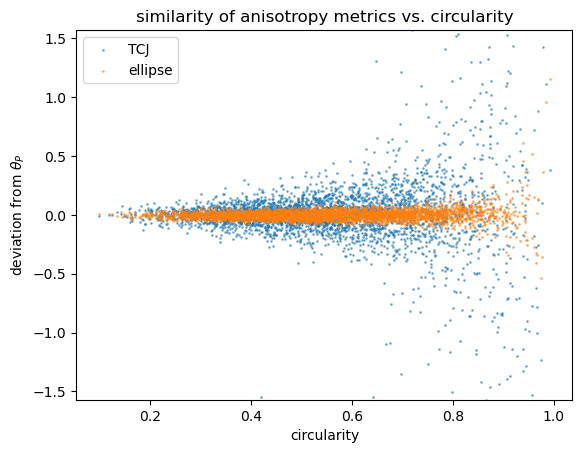

In [119]:
plt.scatter(np.array(circ),(np.array(theta_J)-np.array(theta_P)+np.pi/2)%np.pi-np.pi/2, s=1, label='TCJ', alpha=0.5)
#plt.scatter(np.array(circ),(np.array(theta_polyP)-np.array(theta_P)+np.pi/2)%np.pi-np.pi/2, s=1)
plt.scatter(np.array(circ),(np.array(theta_E)-np.array(theta_P)+np.pi/2)%np.pi-np.pi/2, s=1, color='C1', label='ellipse', alpha=0.5)

plt.ylim(-np.pi/2,np.pi/2)

plt.title('similarity of anisotropy metrics vs. circularity')
plt.ylabel(r'deviation from $\theta_P$')
plt.xlabel('circularity')

plt.legend()

plt.show()

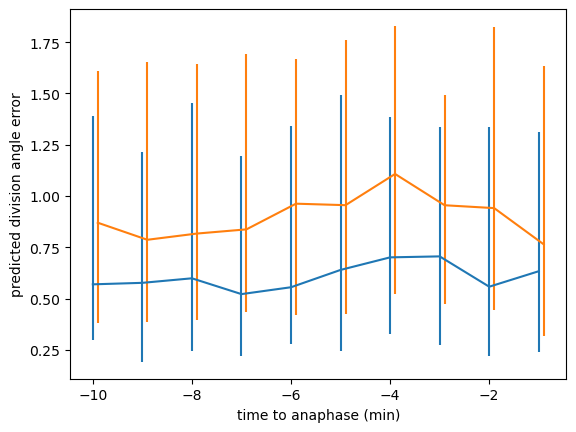

In [120]:
controversial_shapes_mask=~(np.pi/2-np.abs(np.abs(TCJ_axes-perimeter_axes)-np.pi/2)>np.pi/12)
TCJ_controversial=np.ma.masked_array(TCJ_zeroed, controversial_shapes_mask, fill_value=np.nan).filled()
perimeter_controversial=np.ma.masked_array(perimeter_zeroed, controversial_shapes_mask, fill_value=np.nan).filled()

plt.errorbar(range(-10,0),np.nanmedian(TCJ_controversial, axis=0), yerr=np.abs(np.nanquantile(TCJ_controversial, [0.25,0.75], axis=0)-np.nanmedian(TCJ_controversial, axis=0)))
plt.errorbar(np.arange(-10,0)+0.1,np.nanmedian(perimeter_controversial, axis=0), yerr=np.abs(np.nanquantile(perimeter_controversial, [0.25,0.75], axis=0)-np.nanmedian(perimeter_controversial, axis=0)))

plt.xlabel('time to anaphase (min)')
plt.ylabel('predicted division angle error')
plt.show()

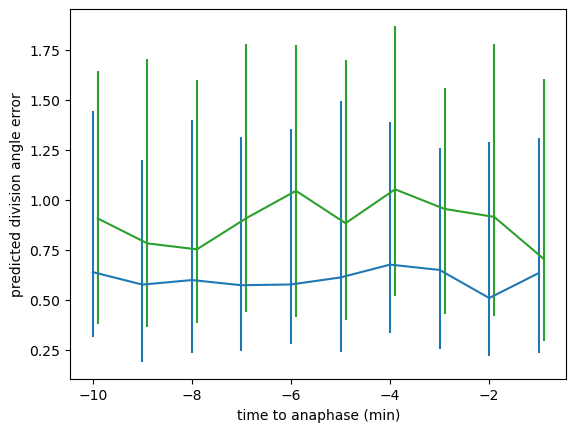

In [121]:
controversial_shapes_mask=~(np.pi/2-np.abs(np.abs(TCJ_axes-ellipse_axes)-np.pi/2)>np.pi/12)
TCJ_controversial=np.ma.masked_array(TCJ_zeroed, controversial_shapes_mask, fill_value=np.nan).filled()
ellipse_controversial=np.ma.masked_array(ellipse_zeroed, controversial_shapes_mask, fill_value=np.nan).filled()

plt.errorbar(range(-10,0),np.nanmedian(TCJ_controversial, axis=0), yerr=np.abs(np.nanquantile(TCJ_controversial, [0.25,0.75], axis=0)-np.nanmedian(TCJ_controversial, axis=0)))
plt.errorbar(np.arange(-10,0)+0.1,np.nanmedian(ellipse_controversial, axis=0), yerr=np.abs(np.nanquantile(ellipse_controversial, [0.25,0.75], axis=0)-np.nanmedian(ellipse_controversial, axis=0)), color='C2')

plt.xlabel('time to anaphase (min)')
plt.ylabel('predicted division angle error')
plt.show()

In [167]:
# TCJ/shape axes for 10 frames before cytokinesis

TCJ_axes=[]
ellipse_axes=[]
division_axes=[]
for m in tqdm(stack.mitoses):
    particle_IDs=m.index.get_level_values(0)
    mother_lastframe=m.index.get_level_values(1)[0]

    mother=stack.tracked_centroids[stack.tracked_centroids['particle']==particle_IDs[0]]
    mother=mother.set_index('frame')
    TCJ_axis=[]
    ellipse_axis=[]
    for frame in range(mother_lastframe-9, mother_lastframe+1):
        if not hasattr(stack.frames[frame], 'good_cell_indices'):
            stack.frames[frame].get_TCJs()
        
        if frame in mother.index and mother.cell_number.loc[frame] in stack.frames[frame].good_cell_indices: # check that 1. cell is visible in this frame and 2. cell has complete set of vertices
            mother_cell=stack.frames[frame].cells[mother.cell_number.loc[frame]]
            mother_cell.fit_ellipse()
            TCJ_axis.append(mother_cell.TCJ_axis())
            ellipse_axis.append(mother_cell.theta)
        else:
            TCJ_axis.append(np.nan)
            ellipse_axis.append(np.nan)
    
    TCJ_axes.append(TCJ_axis)
    ellipse_axes.append(ellipse_axis)
    division_axes.append(np.arctan2(*np.diff(m.iloc[-2:,1:], axis=0)[0]))

TCJ_axes=np.array(TCJ_axes)%np.pi
ellipse_axes=np.array(ellipse_axes)%np.pi
division_axes=np.array(division_axes)%np.pi

100%|███████████████████████████████████████████████████████████████████████████████| 143/143 [00:00<00:00, 283.92it/s]


In [171]:
# TCJ/shape axes for 10 frames before roundest frame

TCJ_axes=[]
ellipse_axes=[]
division_axes=[]
for m in tqdm(stack.mitoses):
    particle_IDs=m.index.get_level_values(0)
    mother_lastframe=m.index.get_level_values(1)[0]
    
    mother=stack.tracked_centroids[stack.tracked_centroids['particle']==particle_IDs[0]]
    mother=mother.set_index('frame')
    
    circularity=[]
    
    for frame in range(mother_lastframe-5, mother_lastframe+1):
        if frame in mother.index:
            mother_cell=stack.frames[frame].cells[mother.cell_number.loc[frame]]
            circularity.append(mother_cell.circularity)
        else: # mother cell not in frame
            circularity.append(np.nan)
            
    mother_roundframe=np.arange(mother_lastframe-5, mother_lastframe+1)[np.argmax(circularity)]
    
    TCJ_axis=[]
    ellipse_axis=[]
    for frame in range(mother_roundframe-9, mother_roundframe+1):
        if not hasattr(stack.frames[frame], 'good_cell_indices'):
            stack.frames[frame].get_TCJs()
        
        if frame in mother.index and mother.cell_number.loc[frame] in stack.frames[frame].good_cell_indices: # check that 1. cell is visible in this frame and 2. cell has complete set of vertices
            mother_cell=stack.frames[frame].cells[mother.cell_number.loc[frame]]
            mother_cell.fit_ellipse()
            TCJ_axis.append(mother_cell.TCJ_axis())
            ellipse_axis.append(mother_cell.theta)
        else:
            TCJ_axis.append(np.nan)
            ellipse_axis.append(np.nan)
    
    TCJ_axes.append(TCJ_axis)
    ellipse_axes.append(ellipse_axis)
    division_axes.append(np.arctan2(*np.diff(m.iloc[-2:,1:], axis=0)[0]))

TCJ_axes=np.array(TCJ_axes)%np.pi
ellipse_axes=np.array(ellipse_axes)%np.pi
division_axes=np.array(division_axes)%np.pi

100%|███████████████████████████████████████████████████████████████████████████████| 143/143 [00:00<00:00, 284.52it/s]


In [ ]:
ellipse_zeroed=np.abs(np.subtract(ellipse_axes.T, division_axes).T)
TCJ_zeroed=np.abs(np.subtract(TCJ_axes.T, division_axes).T)
plt.errorbar(range(-10,0),np.nanmedian(TCJ_zeroed, axis=0), yerr=np.abs(np.nanquantile(TCJ_zeroed, [0.25,0.75], axis=0)-np.nanmedian(TCJ_zeroed, axis=0)))
plt.errorbar(np.arange(-10,0)+0.1,np.nanmedian(ellipse_zeroed, axis=0), yerr=np.abs(np.nanquantile(ellipse_zeroed, [0.25,0.75], axis=0)-np.nanmedian(ellipse_zeroed, axis=0)))

In [ ]:
controversial_shapes_mask=~(np.pi/2-np.abs(np.abs(TCJ_axes-ellipse_axes)-np.pi/2)>np.pi/6)
TCJ_controversial=np.ma.masked_array(TCJ_zeroed, controversial_shapes_mask, fill_value=np.nan).filled()
ellipse_controversial=np.ma.masked_array(ellipse_zeroed, controversial_shapes_mask, fill_value=np.nan).filled()

plt.errorbar(range(-10,0),np.nanmedian(TCJ_controversial, axis=0), yerr=np.abs(np.nanquantile(TCJ_controversial, [0.25,0.75], axis=0)-np.nanmedian(TCJ_controversial, axis=0)))
plt.errorbar(np.arange(-10,0)+0.1,np.nanmedian(ellipse_controversial, axis=0), yerr=np.abs(np.nanquantile(ellipse_controversial, [0.25,0.75], axis=0)-np.nanmedian(ellipse_controversial, axis=0)))

In [180]:
stack.frames[9].cells[239].sorted_vertices

array([[840, 774],
       [843, 797],
       [845, 803],
       [892, 814],
       [909, 793],
       [911, 782],
       [890, 754]], dtype=int64)

In [4]:
TCJ_axes=[]
division_axes=[]
interphase_axes=[]
for stack in tqdm(unpatterned_PDMS.stacks):
    if not hasattr(stack, 'mitoses'):
        stack.get_mitoses()

    for n, m in enumerate(stack.mitoses):
        particle_IDs=m.index.get_level_values(0)

        mother=stack.tracked_centroids[stack.tracked_centroids['particle']==particle_IDs[0]]
        mother_firstframe=mother.frame.max()-5
        mother=mother[mother['frame']>=mother_firstframe]
        
        TCJ_axis=[]
        mother_circ=[]
        ellipse_axis=[]
        for frame, cell_number in np.array(mother[['frame','cell_number']]):
            #if not hasattr(stack.frames[frame], 'good_cell_indices'):
            #    stack.frames[frame].get_TCJs()
            
            #if cell_number in stack.frames[frame].good_cell_indices:
            #    cell=stack.frames[frame].cells[cell_number]
            #    TCJ_axis.append(cell.TCJ_axis())
            #    mother_circ.append(cell.circularity)
            #    cell.fit_ellipse()
            #    ellipse_axis.append(cell.theta)
            #else: # in this frame, the mother cell doesn't have a complete set of numbers
            #    break # give up, I can't do analysis on this mitosis
            cell=stack.frames[frame].cells[cell_number]
            mother_circ.append(cell.circularity)
        
        rounded_cell_frame, rounded_cell_number=mother[['frame','cell_number']].iloc[np.argmax(mother_circ)]
        if not hasattr(stack.frames[rounded_cell_frame], 'good_cell_indices'):
                stack.frames[rounded_cell_frame].get_TCJs()
            
        if rounded_cell_number in stack.frames[rounded_cell_frame].good_cell_indices: # each frame has TCJs
            rounded_cell=stack.frames[rounded_cell_frame].cells[rounded_cell_number]
            rounded_cell.fit_ellipse()
            
            TCJ_axes.append(rounded_cell.TCJ_axis())
            interphase_axes.append(rounded_cell.theta)
            
            division_axes.append(np.arctan2(*np.diff(m.iloc[-2:,1:], axis=0)[0]))
            
            #TCJ_axes.append(TCJ_axis[np.array(mother_circ).argmax()]) # get the TCJ angle of the most circular cell (last or second to last frame)
            #interphase_axes.append(ellipse_axis[np.array(mother_circ).argmax()])
            
            #thetas=[]
            #aspect=[]
            #for frame, cell_number in np.array(mother[['frame','cell_number']]):
            #    cell=stack.frames[frame].cells[cell_number]
            #    cell.fit_ellipse()
            #    thetas.append(cell.theta)
            #    aspect.append(cell.aspect)
            #mother['theta']=thetas
            #mother['aspect']=aspect

            #interphase_index=mother['aspect'].iloc[:-1].idxmax() # last two rows are daughter cells, last frame of mother cell might capture anaphase elongation which we don't want
            #aspects.append(mother['aspect'].loc[interphase_index])
            #interphase_axes.append(mother['theta'].loc[interphase_index])

TCJ_axes=np.array(TCJ_axes)
division_axes=np.array(division_axes)
interphase_axes=np.array(interphase_axes)

100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [11:10<00:00, 33.51s/it]


In [ ]:
fig, axes=plt.subplots(1,4, figsize=(12,4), subplot_kw={'projection':'polar'})
for ax in axes:
    ax.set_xlim(0,np.pi/2)
axes[0].hist(np.abs(TCJ_axes%np.pi-np.pi/2), bins=10, color='C0')#, histtype='step', linewidth=2)
axes[2].hist(np.abs((interphase_axes)%np.pi-np.pi/2), bins=10, color='C1')#, histtype='step', linewidth=2)
axes[1].hist(np.pi/2-np.abs((division_axes-TCJ_axes)%np.pi-np.pi/2), bins=10, color='C2')#, histtype='step', linewidth=2)
axes[3].hist(np.pi/2-np.abs((division_axes-interphase_axes)%np.pi-np.pi/2), bins=10, color='C3')#, histtype='step', linewidth=2)

axes[0].set_title('TCJ Axis')
axes[1].set_title('Cell Division Axis w.r.t. TCJ Axis')
axes[2].set_title('Ellipse Shape Axis')
axes[3].set_title('Cell Division Axis w.r.t. Shape Axis')

plt.suptitle('August Unpatterned PDMS', fontsize=15)
fig.tight_layout()

#plt.savefig('Plots/TCJs_vs_Ellipse-PatternedGlass-n{}.jpg'.format(len(TCJ_axes)), dpi=300)

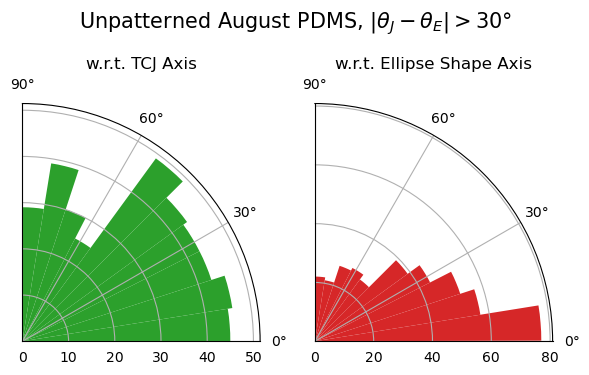

In [6]:
large_error=np.where((np.pi/2-np.abs((TCJ_axes-interphase_axes)%np.pi-np.pi/2))>np.pi/12)

fig, axes=plt.subplots(1,2, figsize=(6,4), subplot_kw={'projection':'polar'})
for ax in axes:
    ax.set_xlim(0,np.pi/2)
    
axes[0].hist(np.pi/2-np.abs((division_axes-TCJ_axes)[large_error]%np.pi-np.pi/2), bins=10, color='C2')#, histtype='step', linewidth=2)
axes[1].hist(np.pi/2-np.abs((division_axes-interphase_axes)[large_error]%np.pi-np.pi/2), bins=10, color='C3')#, histtype='step', linewidth=2)

axes[0].set_title('w.r.t. TCJ Axis')
axes[1].set_title('w.r.t. Ellipse Shape Axis')

plt.suptitle(r'Unpatterned August PDMS, $|\theta_J-\theta_E|>30\degree$', fontsize=15)
fig.tight_layout()

#plt.savefig('Plots/TCJs_vs_Ellipse-PatternedGlassOutliers-n{}.jpg'.format(len(TCJ_axes)), dpi=300)

In [ ]:
for stack in tqdm(patterned_glass.stacks):
    if not hasattr(stack, 'mitoses'):
        stack.get_mitoses()
    if not hasattr(stack.frames[0], 'img'):
        stack.load_img()
    
    for n, m in enumerate(stack.mitoses):
        particle_IDs=m.index.get_level_values(0)

        mother=stack.tracked_centroids[stack.tracked_centroids['particle']==particle_IDs[0]]
        mother_firstframe=mother.frame.max()-5
        mother=mother[mother['frame']>=mother_firstframe]
        
        mother_circ=[]
        for frame, cell_number in np.array(mother[['frame','cell_number']]):
            #if not hasattr(stack.frames[frame], 'good_cell_indices'):
            #    stack.frames[frame].get_TCJs()
            
            #if cell_number in stack.frames[frame].good_cell_indices:
            #    cell=stack.frames[frame].cells[cell_number]
            #    TCJ_axis.append(cell.TCJ_axis())
            #    mother_circ.append(cell.circularity)
            #    cell.fit_ellipse()
            #    ellipse_axis.append(cell.theta)
            #else: # in this frame, the mother cell doesn't have a complete set of numbers
            #    break # give up, I can't do analysis on this mitosis
            cell=stack.frames[frame].cells[cell_number]
            mother_circ.append(cell.circularity)
        
        rounded_cell_frame, rounded_cell_number=mother[['frame','cell_number']].iloc[np.argmax(mother_circ)]
        if not hasattr(stack.frames[rounded_cell_frame], 'good_cell_indices'):
                stack.frames[rounded_cell_frame].get_TCJs()
            
        if rounded_cell_number in stack.frames[rounded_cell_frame].good_cell_indices: # each frame has TCJs
            rounded_cell=stack.frames[rounded_cell_frame].cells[rounded_cell_number]
            rounded_cell.fit_ellipse()
            
            TCJ_axes=(rounded_cell.TCJ_axis())
            interphase_axes=(rounded_cell.theta)
            
            division_axes=(np.arctan2(*np.diff(m.iloc[-2:,1:], axis=0)[0]))
            
            #thetas=[]
            #aspect=[]
            #for frame, cell_number in np.array(mother[['frame','cell_number']]):
            #    cell=stack.frames[frame].cells[cell_number]
            #    cell.fit_ellipse()
            #    thetas.append(cell.theta)
            #    aspect.append(cell.aspect)
            #mother['theta']=thetas
            #mother['aspect']=aspect

            #interphase_index=mother['aspect'].iloc[:-1].idxmax() # last two rows are daughter cells, last frame of mother cell might capture anaphase elongation which we don't want
            #aspects.append(mother['aspect'].loc[interphase_index])
            #interphase_axes=mother['theta'].loc[interphase_index]
        
            y_range=(mother.y.max()+150,mother.y.min()-150)
            x_range=(mother.x.min()-150,mother.x.max()+150)

            for frame in range(mother.frame.min(), mother.frame.max()+3):
                plt.figure(figsize=(5,5))
                plt.imshow(stack.frames[frame].img, cmap='gray')
                plt.xlim(*x_range)
                plt.ylim(*y_range)

                if frame in mother.frame.values:
                    mother_cell=stack.frames[frame].cells[mother[mother.frame==frame].cell_number.item()]
                    plt.plot(*mother_cell.outline.T, color='C0')

                    if frame==rounded_cell_frame:
                        plt.scatter(*np.flip(mother_cell.vertices.T), color='r')
                        TCJ_vector=np.array([np.cos(TCJ_axes),np.sin(TCJ_axes)])
                        xc,yc,a,b,theta=mother_cell.fit_params
                        e=Ellipse((xc,yc),2*a,2*b,angle=theta*180/np.pi,edgecolor='lime',facecolor='none') 
                        plt.gca().add_patch(e)
                
                if frame>=rounded_cell_frame:
                    ellipse_vector=np.array([np.cos(interphase_axes),np.sin(interphase_axes)])
                    plt.plot(*(np.array([xc,yc])+np.array([ellipse_vector, -ellipse_vector])*50).T, color='lime')
                    plt.plot(*(np.flip(mother_cell.centroid)+np.array([TCJ_vector, -TCJ_vector])*50).T, color='r')
                
                if frame==m.iloc[-1].name[1]: # daughter cell frame
                    for daughter_number in m.iloc[-2:].cell_number.values:
                        daughter_cell=stack.frames[frame].cells[daughter_number]
                        plt.plot(*daughter_cell.outline.T, color='C1')
                        plt.scatter(*np.flip(daughter_cell.centroid), color='C1')
                
                folder_path=stack.name.replace('segmented','TCJ_vs_Ellipse-5frames')
                if not os.path.exists(folder_path):
                    os.makedirs(folder_path)
                    
                plt.savefig(folder_path+'mitosis{}_frame{}.jpg'.format(n,frame),dpi=300)
                plt.close()

 50%|█████████████████████████████████████████                                         | 7/14 [21:07<21:38, 185.54s/it]

#### TCJ/Perimeter efficacy vs. Density

In [ ]:
density=[]
for filename in tqdm(datasets['JD_4mgcolCL']):
    stack=Stack(filename)
    stack.get_mitoses()#circ_limit=0,bbox_scale=1)
    for m in stack.mitoses:
        particle_IDs=m.index.get_level_values(0)
        mother_lastframe=m.index.get_level_values(1)[0]
        density.append(stack.frames[mother_lastframe].density)

In [ ]:
division_data=np.load(f'division_axes/JD_4mgcolCL.npy')
TCJ_axes=division_data[:,:10]
perimeter_axes=division_data[:,10:20]
division_axes=division_data[:,-1]

#### Efficacy vs. AR

In [450]:
export_dict={'TCJ_axes':TCJ_axes, 'perimeter_axes':perimeter_axes, 'division_axes':division_axes, 'circ_P':circ_P, 'min_aspect':AR}
np.save('division_axes_dicts/patterned_glass.npy', export_dict)

In [99]:
division_data=np.load(f'division_axes/drosophila_WT.npy')
TCJ_axes=division_data[:,:10]
perimeter_axes=division_data[:,10:20]
division_axes=division_data[:,-1]

In [ ]:
AR=[]
circ_P=[]
for filename in tqdm(datasets['patterned_glass']):
    stack=Stack(filename)
    stack.get_mitoses()#circ_limit=0,bbox_scale=1)
    for m in stack.mitoses:
        particle_IDs=m.index.get_level_values(0)
        mother_lastframe=m.index.get_level_values(1)[0]
        
        mother=stack.tracked_centroids[stack.tracked_centroids['particle']==particle_IDs[0]]
        mother=mother.set_index('frame')
        
        mother_circ=0
        mother_AR=0
        for frame in range(mother_lastframe-4, mother_lastframe+1):
            if frame in mother.index:
                mother_cell=stack.frames[frame].cells[mother.cell_number.loc[frame]]
                mother_cell.perimeter_axis()
                if mother_cell.circ_P>mother_circ:
                    mother_circ=mother_cell.circ_P
                    mother_cell.fit_ellipse()
                    mother_AR=mother_cell.aspect
        AR.append(mother_AR)
        circ_P.append(mother_circ)
AR=np.array(AR)
circ_P=np.array(circ_P)

In [447]:
AR=[]
circ_P=[]
for stack in tqdm(patterned_glass.stacks):
    #stack=Stack(filename)
    #stack.get_mitoses()#circ_limit=0,bbox_scale=1)
    for m in stack.mitoses:
        particle_IDs=m.index.get_level_values(0)
        mother_lastframe=m.index.get_level_values(1)[0]
        
        mother=stack.tracked_centroids[stack.tracked_centroids['particle']==particle_IDs[0]]
        mother=mother.set_index('frame')
        
        mother_circ=0
        mother_AR=0
        for frame in range(mother_lastframe-4, mother_lastframe+1):
            if frame in mother.index:
                mother_cell=stack.frames[frame].cells[mother.cell_number.loc[frame]]
                mother_cell.perimeter_axis()
                if mother_cell.circ_P>mother_circ:
                    mother_circ=mother_cell.circ_P
                    mother_cell.fit_ellipse()
                    mother_AR=mother_cell.aspect
        AR.append(mother_AR)
        circ_P.append(mother_circ)
AR=np.array(AR)
circ_P=np.array(circ_P)

100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:25<00:00,  1.85s/it]


In [7]:
import numpy as np
import matplotlib.pyplot as plt

In [451]:
division_data=np.load(f'division_axes_dicts/patterned_glass.npy', allow_pickle=True).item()
TCJ_axes=division_data['TCJ_axes']
perimeter_axes=division_data['perimeter_axes']
division_axes=division_data['division_axes']
circ_P=division_data['circ_P']
AR=division_data['min_aspect']

Text(0.5, 1.0, 'mitotic cells circularity vs. AR, JD glass 2')

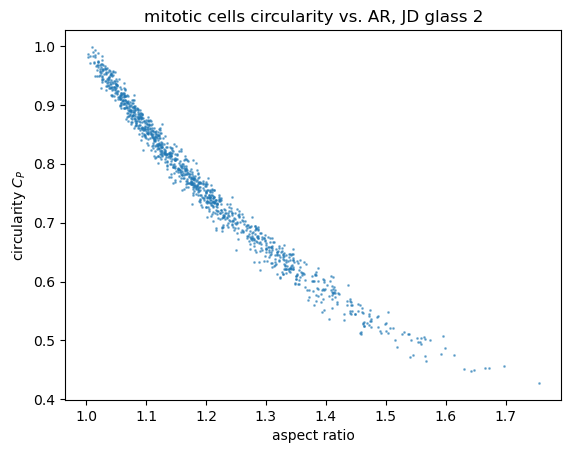

In [452]:
plt.scatter(AR, circ_P, s=1, alpha=0.5)
plt.xlabel('aspect ratio')
plt.ylabel('circularity $C_P$')

plt.title('mitotic cells circularity vs. AR, JD glass 2')
#plt.savefig('Plots/ASCB 2023/circ_vs_AR.jpg', dpi=300)

In [341]:
division_data=np.load(f'division_axes_dicts/JD_glass2.npy', allow_pickle=True).item()
TCJ_axes=division_data['TCJ_axes']
perimeter_axes=division_data['perimeter_axes']
division_axes=division_data['division_axes']
circ_P=division_data['circ_P']
AR=division_data['min_aspect']

In [342]:
bins[-1]=AR.max()

In [327]:
np.quantile(circularity_metric, np.linspace(0,1,n_rows+2))

array([1.00145056, 1.12765748, 1.22254595, 1.34452069, 1.81995261])

In [453]:
n_rows=3
perimeter_zeroed=np.abs(np.subtract(perimeter_axes.T, division_axes).T)
TCJ_zeroed=np.abs(np.subtract(TCJ_axes.T, division_axes).T)

circularity_metric=AR

#bins=np.quantile(circularity_metric, np.linspace(0,1,n_rows+1))
#bins=[1.00145056, 1.12765748, 1.34452069, 1.81995261]
binned_TCJ=[]
binned_perimeter=[]
binned_TCJ_large_error=[]
binned_perimeter_large_error=[]

for bin_left, bin_right in zip(bins[:-1], bins[1:]):
    binned_circ=(circularity_metric>=bin_left)&(circularity_metric<=bin_right)
    large_error=(np.pi/2-np.abs((TCJ_zeroed[:,-1]-perimeter_zeroed[:,-1])%np.pi-np.pi/2))>np.pi/4
    
    binned_perimeter.append(np.abs((perimeter_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2)[binned_circ])
    binned_TCJ.append(np.abs((TCJ_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2)[binned_circ])
    
    binned_perimeter_large_error.append(np.abs((perimeter_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2)[binned_circ&large_error])
    binned_TCJ_large_error.append(np.abs((TCJ_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2)[binned_circ&large_error])
    
binned_perimeter=[x[~np.isnan(x)] for x in binned_perimeter]
binned_TCJ=[x[~np.isnan(x)] for x in binned_TCJ]
binned_perimeter_large_error=[x[~np.isnan(x)] for x in binned_perimeter_large_error]
binned_TCJ_large_error=[x[~np.isnan(x)] for x in binned_TCJ_large_error]

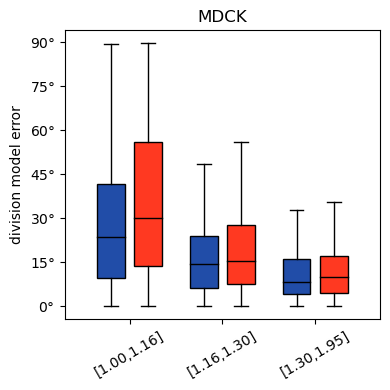

In [454]:
def box_plot(data, edge_color='k', fill_color=None, **kwargs):
    bp = plt.boxplot(data, patch_artist=True, **kwargs)
    
    if edge_color:
        for element in ['boxes', 'whiskers', 'fliers', 'means', 'medians', 'caps']:
            plt.setp(bp[element], color=edge_color)
    if fill_color:
        for patch in bp['boxes']:
            patch.set(facecolor=fill_color)       
        
    return bp

fig=plt.figure(figsize=(4,4))
bp_TCJ=box_plot(binned_TCJ, fill_color='#FF3921', positions=np.arange(n_rows)+0.2, widths=0.3, showfliers=False)
bp_perimeter=box_plot(binned_perimeter, fill_color='#214DA8', positions=np.arange(n_rows)-0.2, widths=0.3, showfliers=False)

plt.xticks(np.arange(n_rows), labels=[f'[{bin_left:.2f},{bin_right:.2f}]' for bin_left, bin_right in zip(bins[:-1], bins[1:])], rotation=30)
plt.yticks(np.linspace(0,np.pi/2,7), labels=[f'{n}$\degree$' for n in np.arange(0,7)*15])

plt.title('MDCK')
plt.ylabel('division model error')

#plt.legend([bp_perimeter["boxes"][0], bp_TCJ["boxes"][0]], ['perimeter model', 'TCJ model'])

plt.tight_layout()
#plt.savefig('Plots/ASCB 2023/div_error_AR-boxplot-MDCK.jpg', dpi=300)
plt.show()

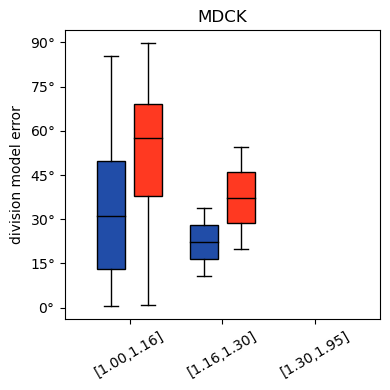

In [455]:
fig=plt.figure(figsize=(4,4))
bp_TCJ=box_plot(binned_TCJ_large_error, fill_color='#FF3921', positions=np.arange(n_rows)+0.2, widths=0.3, showfliers=False)
bp_perimeter=box_plot(binned_perimeter_large_error, fill_color='#214DA8', positions=np.arange(n_rows)-0.2, widths=0.3, showfliers=False)

plt.xticks(np.arange(n_rows), labels=[f'[{bin_left:.2f},{bin_right:.2f}]' for bin_left, bin_right in zip(bins[:-1], bins[1:])], rotation=30)
plt.yticks(np.linspace(0,np.pi/2,7), labels=[f'{n}$\degree$' for n in np.arange(0,7)*15])

plt.title(r'MDCK')
plt.ylabel('division model error')

#plt.legend([bp_perimeter["boxes"][0], bp_TCJ["boxes"][0]], ['perimeter model', 'TCJ model'], loc='lower right')

plt.tight_layout()
#plt.savefig('Plots/ASCB 2023/div_error_AR-boxplot-large_error-MDCK.jpg', dpi=300)
plt.show()

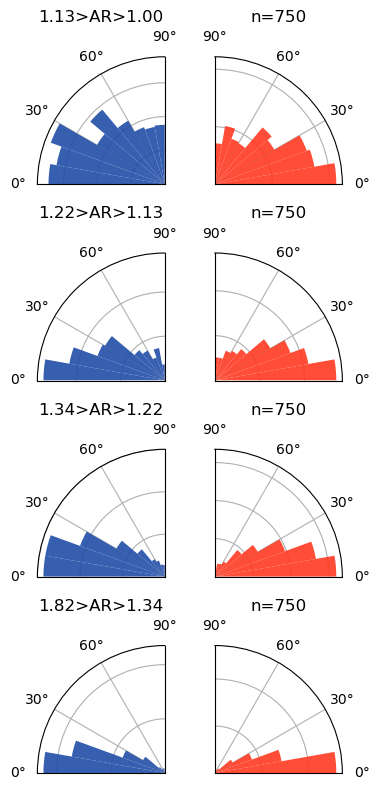

In [119]:
n_rows=4
fig, all_axes=plt.subplots(n_rows,2, figsize=(4,2*n_rows), subplot_kw={'projection':'polar'})
perimeter_zeroed=np.abs(np.subtract(perimeter_axes.T, division_axes).T)
TCJ_zeroed=np.abs(np.subtract(TCJ_axes.T, division_axes).T)

circularity_metric=AR

bins=np.quantile(circularity_metric, np.linspace(0,1,n_rows+1))
for bin_left, bin_right, axes in zip(bins[:-1], bins[1:], all_axes.reshape(-1,2)):
    binned_circ=(circularity_metric>=bin_left)&(circularity_metric<=bin_right)
    for ax in axes:
        ax.set_xlim(0,np.pi/2)

    axes[0].hist(np.abs((perimeter_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2)[binned_circ], bins=np.linspace(0,np.pi/2,10), color='#214DA8', zorder=2, alpha=0.9, density=True)#, histtype='step', linewidth=2)
    axes[0].set_theta_zero_location("W")
    axes[0].set_theta_direction(-1)
    axes[1].hist(np.abs((TCJ_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2)[binned_circ], bins=np.linspace(0,np.pi/2,10), fc='#FF3921', zorder=2, alpha=0.9, density=True)#, histtype='step', linewidth=2)
    #axes[2].hist(np.abs((ellipse_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2), bins=np.linspace(0,np.pi/2,15), color='C2')#, histtype='step', linewidth=2)

    for ax in axes:
        #ax.set_ylim(0,1.9)
        ax.set_yticklabels([])
    axes[0].set_title(f'{bin_right:.2f}>AR>{bin_left:.2f}')
    axes[1].set_title(f'n={np.sum(binned_circ)}')

fig.tight_layout()

plt.savefig('Plots/ASCB 2023/TCJ_efficacy_vs_AR-drosophila_WT.jpg', dpi=300)

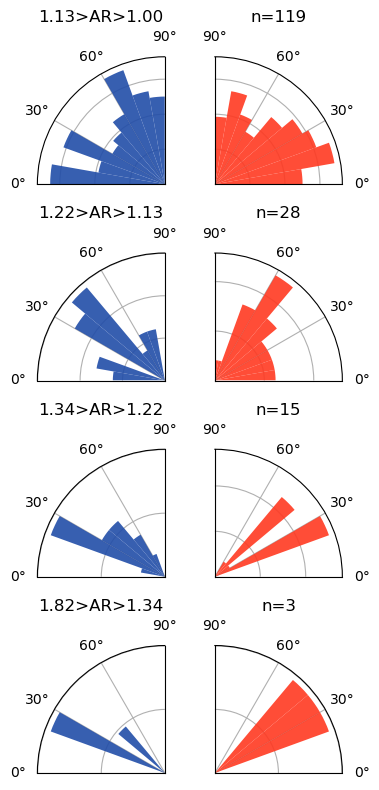

In [122]:
n_rows=4
fig, all_axes=plt.subplots(n_rows,2, figsize=(4,2*n_rows), subplot_kw={'projection':'polar'})
perimeter_zeroed=np.abs(np.subtract(perimeter_axes.T, division_axes).T)
TCJ_zeroed=np.abs(np.subtract(TCJ_axes.T, division_axes).T)

circularity_metric=AR

bins=np.quantile(circularity_metric, np.linspace(0,1,n_rows+1))
for bin_left, bin_right, axes in zip(bins[:-1], bins[1:], all_axes.reshape(-1,2)):
    binned_circ=(circularity_metric>=bin_left)&(circularity_metric<=bin_right)
    large_error=(np.pi/2-np.abs((TCJ_zeroed[:,-1]-perimeter_zeroed[:,-1])%np.pi-np.pi/2))>np.pi/4
    for ax in axes:
        ax.set_xlim(0,np.pi/2)

    axes[0].hist(np.abs((perimeter_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2)[binned_circ&large_error], bins=np.linspace(0,np.pi/2,10), color='#214DA8', zorder=2, alpha=0.9, density=True)#, histtype='step', linewidth=2)
    axes[0].set_theta_zero_location("W")
    axes[0].set_theta_direction(-1)
    axes[1].hist(np.abs((TCJ_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2)[binned_circ&large_error], bins=np.linspace(0,np.pi/2,10), fc='#FF3921', zorder=2, alpha=0.9, density=True)#, histtype='step', linewidth=2)
    #axes[2].hist(np.abs((ellipse_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2), bins=np.linspace(0,np.pi/2,15), color='C2')#, histtype='step', linewidth=2)

    for ax in axes:
        #ax.set_ylim(0,1.9)
        ax.set_yticklabels([])
    axes[0].set_title(f'{bin_right:.2f}>AR>{bin_left:.2f}')
    axes[1].set_title(f'n={np.sum(binned_circ&large_error)}')

fig.tight_layout()

plt.savefig('Plots/ASCB 2023/TCJ_efficacy_vs_AR-drosophila_WT.jpg', dpi=300)

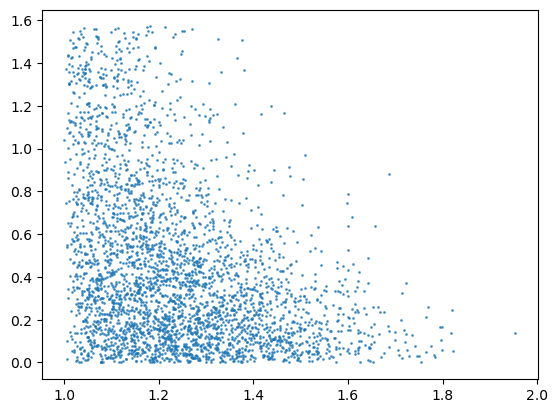

In [57]:
plt.scatter(AR, np.abs((perimeter_zeroed[:,-1]+np.pi/2)%np.pi-np.pi/2), s=1, alpha=0.7)

### Circularity vs. Time to Mitosis

In [128]:
TCJ_axes=[]
perimeter_axes=[]
#ellipse_axes=[]
division_axes=[]
circularities=[]
circ_Js=[]
circ_Ps=[]
for stack in tqdm(drosophila_WT.stacks):
    if not hasattr(stack, 'mitoses'):
        stack.get_mitoses()#circ_limit=0,bbox_scale=1)
    for m in stack.mitoses:
        particle_IDs=m.index.get_level_values(0)
        mother_lastframe=m.index.get_level_values(1)[0]

        mother=stack.tracked_centroids[stack.tracked_centroids['particle']==particle_IDs[0]]
        mother=mother.set_index('frame')

        circularity=[]

        for frame in range(mother_lastframe-4, mother_lastframe+1):
            if frame in mother.index:
                mother_cell=stack.frames[frame].cells[mother.cell_number.loc[frame]]
                mother_cell.perimeter_axis()
                circularity.append(mother_cell.circ_P)
            else: # mother cell not in frame
                circularity.append(np.nan)

        mother_roundframe=np.arange(mother_lastframe-4, mother_lastframe+1)[np.argmax(circularity)]
        circularities.append(np.nanmax(circularity))
        TCJ_axis=[]
        perimeter_axis=[]
        ellipse_axis=[]
        circ_J=[]
        circ_P=[]
        for frame in range(mother_roundframe-9, mother_roundframe+1):
            if not hasattr(stack.frames[frame], 'good_cell_indices'):
                stack.frames[frame].get_TCJs()

            if frame in mother.index and mother.cell_number.loc[frame] in stack.frames[frame].good_cell_indices: # check that 1. cell is visible in this frame and 2. cell has complete set of vertices
                mother_cell=stack.frames[frame].cells[mother.cell_number.loc[frame]]
                #mother_cell.fit_ellipse()
                TCJ_axis.append(mother_cell.TCJ_axis())
                perimeter_axis.append(mother_cell.perimeter_axis())
                circ_J.append(mother_cell.circ_J)
                circ_P.append(mother_cell.circ_P)
                #ellipse_axis.append(mother_cell.theta)
            else:
                TCJ_axis.append(np.nan)
                perimeter_axis.append(np.nan)
                circ_J.append(np.nan)
                circ_P.append(np.nan)
                #perimeter_axis.append(np.nan)
                #ellipse_axis.append(np.nan)

        TCJ_axes.append(TCJ_axis)
        perimeter_axes.append(perimeter_axis)
        #ellipse_axes.append(ellipse_axis)
        division_axes.append(np.arctan2(*np.diff(m.iloc[-2:,1:], axis=0)[0]))
        circ_Js.append(circ_J)
        circ_Ps.append(circ_P)

TCJ_axes=np.array(TCJ_axes)%np.pi
perimeter_axes=np.array(perimeter_axes)%np.pi
#ellipse_axes=np.array(ellipse_axes)%np.pi
division_axes=np.array(division_axes)%np.pi
circ_Js=np.array(circ_Js)
circ_Ps=np.array(circ_Ps)

100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [01:45<00:00, 17.55s/it]


In [93]:
mdck_TCJs=TCJ_axes
mdck_perimeter=perimeter_axes
mdck_division=division_axes

mdck_Cp=circ_Ps
mdck_Cj=circ_Js

In [106]:
circ_Ps.shape

(2997, 13)

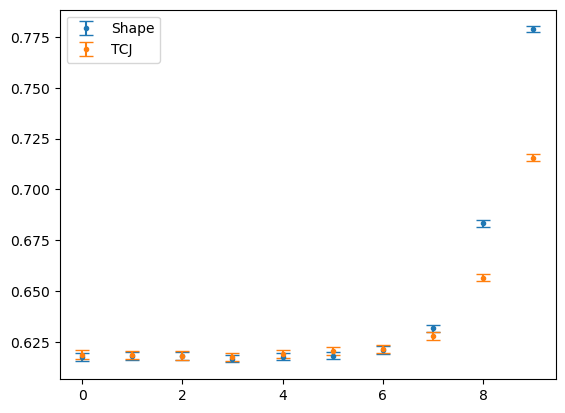

In [134]:
plt.errorbar(np.arange(mdck_Cp.shape[1]),np.nanmean(mdck_Cp, axis=0), yerr=np.nanstd(mdck_Cp, axis=0)/np.sqrt(np.sum(~np.isnan(mdck_Cp), axis=0)), fmt='.', capsize=5, label='Shape')
plt.errorbar(np.arange(mdck_Cj.shape[1]),np.nanmean(mdck_Cj, axis=0)+0.09, yerr=np.nanstd(mdck_Cj, axis=0)/np.sqrt(np.sum(~np.isnan(mdck_Cj), axis=0)), fmt='.', capsize=5, label='TCJ')

plt.legend()

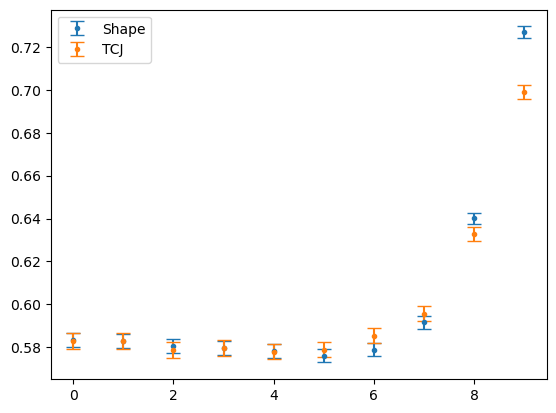

In [131]:
plt.errorbar(np.arange(circ_Ps.shape[1]),np.nanmean(circ_Ps, axis=0), yerr=np.nanstd(circ_Ps, axis=0)/np.sqrt(np.sum(~np.isnan(circ_Ps), axis=0)), fmt='.', capsize=5, label='Shape')
plt.errorbar(np.arange(circ_Js.shape[1]),np.nanmean(circ_Js, axis=0)+0.076, yerr=np.nanstd(circ_Js, axis=0)/np.sqrt(np.sum(~np.isnan(circ_Js), axis=0)), fmt='.', capsize=5, label='TCJ')

plt.legend()

### Cell Division Axis Comparison

In [14]:
patterned_interphase_axes=[]
patterned_division_axes=[]
aspects=[]

for stack in tqdm(patterned_PDMS.stacks, desc='stacks'):
    if not hasattr(stack, 'mitoses'):
        stack.get_mitoses()
    if not hasattr(stack, 'tracked_centroids'):
        stack.track_centroids()
    extended_mitoses=[]
    
    # get the cell tracking info for frames surrounding each mitotic event
    for m in stack.mitoses:
        particle_IDs=m.index.get_level_values(0)

        mother=stack.tracked_centroids[stack.tracked_centroids['particle']==particle_IDs[0]]
        mother_firstframe=mother.frame.max()-15
        mother=mother[mother['frame']>=mother_firstframe] # cut out all frames before except 15 before mitosis (or beginning)
        extended_mitoses.append(pd.concat([mother,m.iloc[-2:].reset_index()]).reset_index(drop=True))
    
    
    for n,mitotic_event in enumerate(extended_mitoses):
        thetas=[]
        aspect=[]
        for frame, cell_number in np.array(mitotic_event[['frame','cell_number']]):
            cell=stack.frames[frame].cells[cell_number]
            cell.fit_ellipse()
            thetas.append(cell.theta)
            aspect.append(cell.aspect)
        mitotic_event['theta']=thetas
        mitotic_event['aspect']=aspect
        
        interphase_index=mitotic_event['aspect'].iloc[:-3].idxmax() # last two rows are daughter cells, last frame of mother cell might capture anaphase elongation which we don't want
        aspects.append(mitotic_event['aspect'].loc[interphase_index]) 
        patterned_interphase_axes.append(mitotic_event['theta'].loc[interphase_index])
        patterned_division_axes.append(np.abs(np.arctan2(*np.diff(mitotic_event[['y','x']].iloc[-2:], axis=0)[0]))%np.pi)

patterned_interphase_axes=np.array(patterned_interphase_axes)
patterned_division_axes=np.array(patterned_division_axes)
patterned_aspects=np.array(aspects)

stacks: 100%|██████████████████████████████████████████████████████████████████████████| 20/20 [04:04<00:00, 12.23s/it]


In [15]:
unpatterned_interphase_axes=[]
unpatterned_division_axes=[]
aspects=[]

for stack in tqdm(unpatterned_PDMS.stacks, desc='stacks'):
    if not hasattr(stack, 'tracked_centroids'):
        stack.track_centroids()
    #if not hasattr(stack, 'mitoses'):
    stack.get_mitoses(AR_limit=100)
    extended_mitoses=[]
    
    # get the cell tracking info for frames surrounding each mitotic event
    for m in stack.mitoses:
        particle_IDs=m.index.get_level_values(0)
        
        mother=stack.tracked_centroids[stack.tracked_centroids['particle']==particle_IDs[0]]
        mother_firstframe=mother.frame.max()-15
        mother=mother[mother['frame']>=mother_firstframe] # cut out all frames before except 15 before mitosis (or beginning)
        extended_mitoses.append(pd.concat([mother,m.iloc[-2:].reset_index()]).reset_index(drop=True))
    
    
    for n,mitotic_event in enumerate(extended_mitoses):
        thetas=[]
        aspect=[]
        for frame, cell_number in np.array(mitotic_event[['frame','cell_number']]):
            cell=stack.frames[frame].cells[cell_number]
            cell.fit_ellipse()
            thetas.append(cell.theta)
            aspect.append(cell.aspect)
        mitotic_event['theta']=thetas
        mitotic_event['aspect']=aspect

        interphase_index=mitotic_event['aspect'].iloc[:-3].idxmax() # last two rows are daughter cells, last frame of mother cell might capture anaphase elongation which we don't want
        aspects.append(mitotic_event['aspect'].loc[interphase_index])
        unpatterned_interphase_axes.append(mitotic_event['theta'].loc[interphase_index])
        unpatterned_division_axes.append((np.arctan2(*np.diff(mitotic_event[['y','x']].iloc[-2:], axis=0)[0]))%np.pi)

unpatterned_interphase_axes=np.array(unpatterned_interphase_axes)
unpatterned_division_axes=np.array(unpatterned_division_axes)
unpatterned_aspects=np.array(aspects)

stacks: 100%|██████████████████████████████████████████████████████████████████████████| 20/20 [03:59<00:00, 11.97s/it]


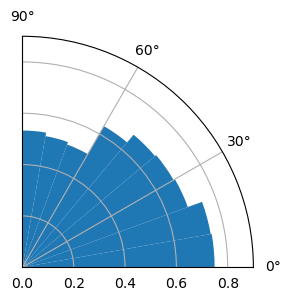

In [10]:
fig=plt.figure(figsize=(3,3))
ax=plt.subplot(projection='polar')
ax.set_xlim(0,np.pi/2)
ax.hist(np.abs(patterned_division_axes-np.pi/2), bins=np.linspace(0,np.pi/2,10), color='C0', density=True)#, histtype='step', linewidth=2)

plt.ylim(0,0.9)

plt.savefig('Plots/8-7 Supergroup/Patterned DivAx n{}.jpg'.format(len(patterned_division_axes)), dpi=300, bbox_inches='tight')

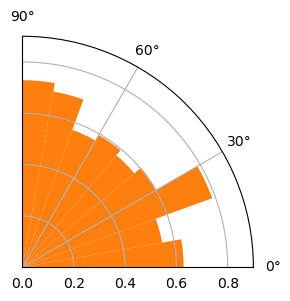

In [11]:
fig=plt.figure(figsize=(3,3))
ax=plt.subplot(projection='polar')
ax.set_xlim(0,np.pi/2)
ax.hist(np.abs(unpatterned_division_axes-np.pi/2), bins=np.linspace(0,np.pi/2,10), color='C1', density=True)#, histtype='step', linewidth=2)

plt.ylim(0,0.9)

plt.savefig('Plots/8-7 Supergroup/Unpatterned DivAx n{}.jpg'.format(len(unpatterned_division_axes)), dpi=300, bbox_inches='tight')

In [31]:
fig, axes=plt.subplots(1,3, figsize=(9,3), subplot_kw={'projection':'polar'})
for ax in axes:
    ax.set_xlim(0,np.pi/2)
axes[0].hist(np.abs(patterned_interphase_axes-np.pi/2), bins=np.linspace(0,np.pi/2,10), color='C0', histtype='step', linewidth=2)
axes[1].hist(np.abs(patterned_division_axes-np.pi/2), bins=np.linspace(0,np.pi/2,10), color='C1', histtype='step', linewidth=2)
axes[2].hist(np.abs((patterned_division_axes-patterned_interphase_axes-np.pi/2)%np.pi-np.pi/2), bins=np.linspace(0,np.pi/2,10), color='C2', histtype='step', linewidth=2)


plt.suptitle('Patterned PDMS', fontsize=15)
axes[0].set_title('interphase axis')
axes[1].set_title('division axis')
axes[2].set_title('division axis w.r.t. interphase')

fig.tight_layout()
print(len(patterned_division_axes))
plt.savefig('Plots/PDMS 20230728 Patterned Cell Division Orientation n{}.jpg'.format(len(patterned_division_axes)), dpi=300, bbox_inches='tight')

3602


In [32]:
fig, axes=plt.subplots(1,3, figsize=(9,3), subplot_kw={'projection':'polar'})
for ax in axes:
    ax.set_xlim(0,np.pi/2)
axes[0].hist(np.abs(unpatterned_interphase_axes-np.pi/2), bins=np.linspace(0,np.pi/2,10), color='C0', histtype='step', linewidth=2)
axes[1].hist(np.abs(unpatterned_division_axes-np.pi/2), bins=np.linspace(0,np.pi/2,10), color='C1', histtype='step', linewidth=2)
axes[2].hist(np.abs(unpatterned_division_axes-unpatterned_interphase_axes), bins=np.linspace(0,np.pi/2,10), color='C2', histtype='step', linewidth=2)

plt.suptitle('Unpatterned PDMS', fontsize=15)
axes[0].set_title('interphase axis')
axes[1].set_title('division axis')
axes[2].set_title('division axis w.r.t. interphase')

fig.tight_layout()
len(unpatterned_division_axes)
plt.savefig('Plots/PDMS 20230728 Unpatterned Cell Division Orientation n{}.jpg'.format(len(unpatterned_division_axes)), dpi=300, bbox_inches='tight')

### Aspect Ratio vs. Division Orientation Error

Text(0.5, 0, 'aspect ratio')

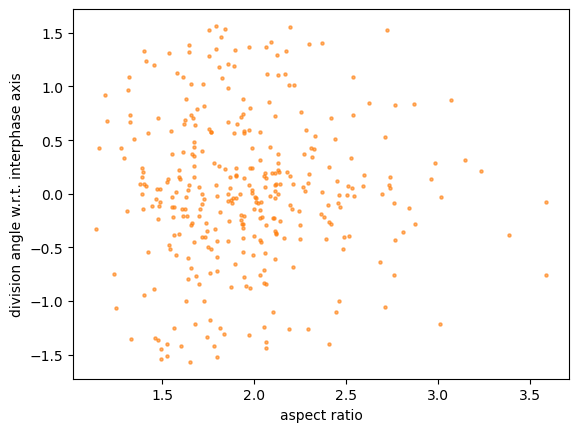

In [38]:
plt.scatter(unpatterned_aspects, (unpatterned_division_axes-unpatterned_interphase_axes-np.pi/2)%np.pi-np.pi/2, alpha=0.6, s=5, color='C1')

plt.ylabel('division angle w.r.t. interphase axis')
plt.xlabel('aspect ratio')

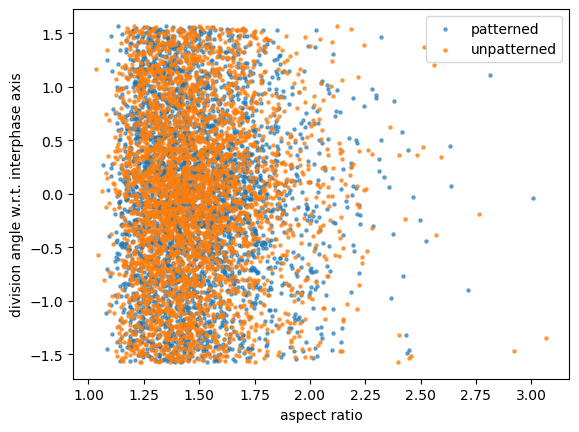

In [35]:
plt.scatter(patterned_aspects, (patterned_division_axes-patterned_interphase_axes-np.pi/2)%np.pi-np.pi/2, alpha=0.6, s=5, color='C0', label='patterned')
plt.scatter(unpatterned_aspects, (unpatterned_division_axes-unpatterned_interphase_axes-np.pi/2)%np.pi-np.pi/2, alpha=0.7, s=5, color='C1', label='unpatterned')

plt.ylabel('division angle w.r.t. interphase axis')
plt.xlabel('aspect ratio')
plt.legend()

#plt.savefig('plots/aspect_vs_divisionerror.jpg',dpi=300)

plt.show()

### Interphase shape vs. division shape Hist2D

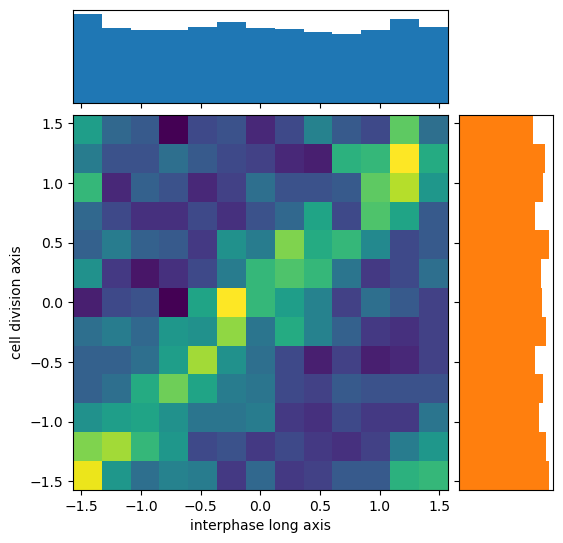

In [38]:
from matplotlib import colors
# Start with a square Figure.
fig = plt.figure(figsize=(6, 6))
# Add a gridspec with two rows and two columns and a ratio of 1 to 4 between
# the size of the marginal axes and the main axes in both directions.
# Also adjust the subplot parameters for a square plot.
gs = fig.add_gridspec(2, 2,  width_ratios=(4, 1), height_ratios=(1, 4),
                      left=0.1, right=0.9, bottom=0.1, top=0.9,
                      wspace=0.05, hspace=0.05)
# Create the Axes.
ax = fig.add_subplot(gs[1, 0])
ax_histx = fig.add_subplot(gs[0, 0], sharex=ax)
ax_histy = fig.add_subplot(gs[1, 1], sharey=ax)
# Draw the scatter plot and marginals.

# no labels
ax_histx.tick_params(axis="x", labelbottom=False)
ax_histy.tick_params(axis="y", labelleft=False)

# the scatter plot:
x=unpatterned_interphase_axes-np.pi/2
y=unpatterned_division_axes-np.pi/2
a=ax.hist2d(x, y, bins=13)#, s=1.5, color='C2')
#plt.colorbar(a)
ax.set_xlabel('interphase long axis')
ax.set_ylabel('cell division axis')

# now determine nice limits by hand:
binwidth = np.pi/11
xymax = max(np.max(np.abs(x)), np.max(np.abs(y)))
lim = (int(xymax/binwidth) + 1) * binwidth

bins = np.arange(-lim, lim + binwidth, binwidth)
ax_histx.hist(x, bins=13, density=True, color='C0')
ax_histy.hist(y, bins=13, orientation='horizontal', density=True, color='C1')

ax_histx.get_yaxis().set_visible(False)
ax_histy.get_xaxis().set_visible(False)

ax_histx.get_ylim()
ax_histy.get_xlim()
#plt.savefig('Plots/8-7 Supergroup/PDMS Unpatterned Hist2D.jpg', dpi=300)

plt.show()

# Demos

## Demo Segmentation

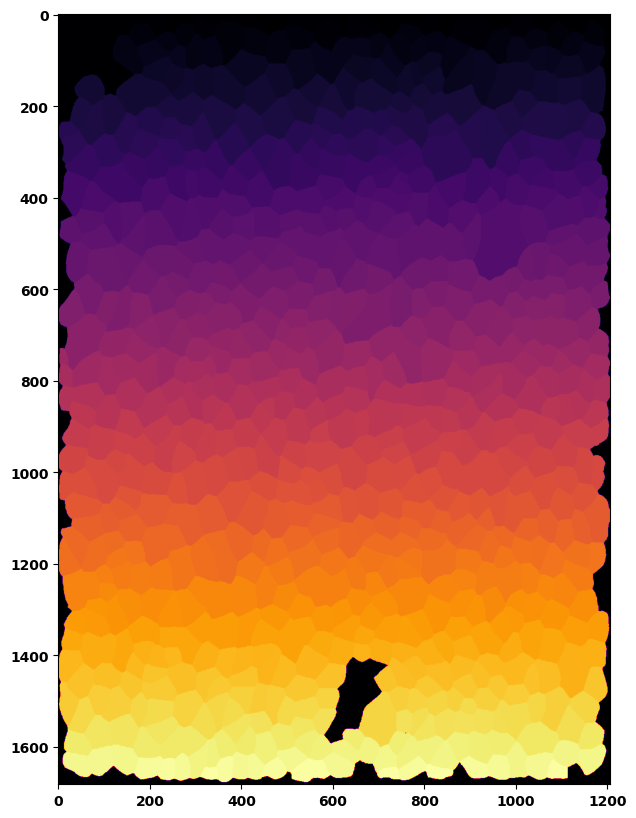

In [10]:
plt.figure(figsize=(10,10))
plt.imshow(patterned_glass.stacks[0].frames[0].masks, cmap='inferno')

In [123]:
# just segmentation
stack_name='Amanda_H2B'
with plt.style.context('dark_background'):
    for n, frame in enumerate(tqdm(stack.frames)):
        fig, [ax1,ax2,ax3] = plt.subplots(1,3, sharey=True, sharex=True, figsize=(12,4))

        ax1.imshow(frame.img[0], cmap='gray')
        ax1.set_title('raw data')
        #ax1.axis('off')
        ax1.set_xticks([])
        ax1.set_yticks([])

        ax2.imshow(frame.outlines!=0,cmap='gray')
        ax2.set_title('segmented cell outlines')
        #ax2.axis('off')
        ax2.set_xticks([])
        ax2.set_yticks([])
        
        ax3.imshow(frame.img[0], cmap='gray')
        for cell in frame.cells:
            plt.plot(*cell.outline.T, linewidth=0.1, color='r')
        ax3.set_title('overlay')
        #ax1.axis('off')
        ax3.set_xticks([])
        ax3.set_yticks([])
        
        folder_path='Plots/demo_seg/{}/'.format(stack_name)
        if not os.path.exists(folder_path):
            os.makedirs(folder_path)
        fig.tight_layout()
        plt.savefig(folder_path+'{}-{:03}.tif'.format(stack_name, n),dpi=300)
        plt.close()

100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:44<00:00,  1.53s/it]


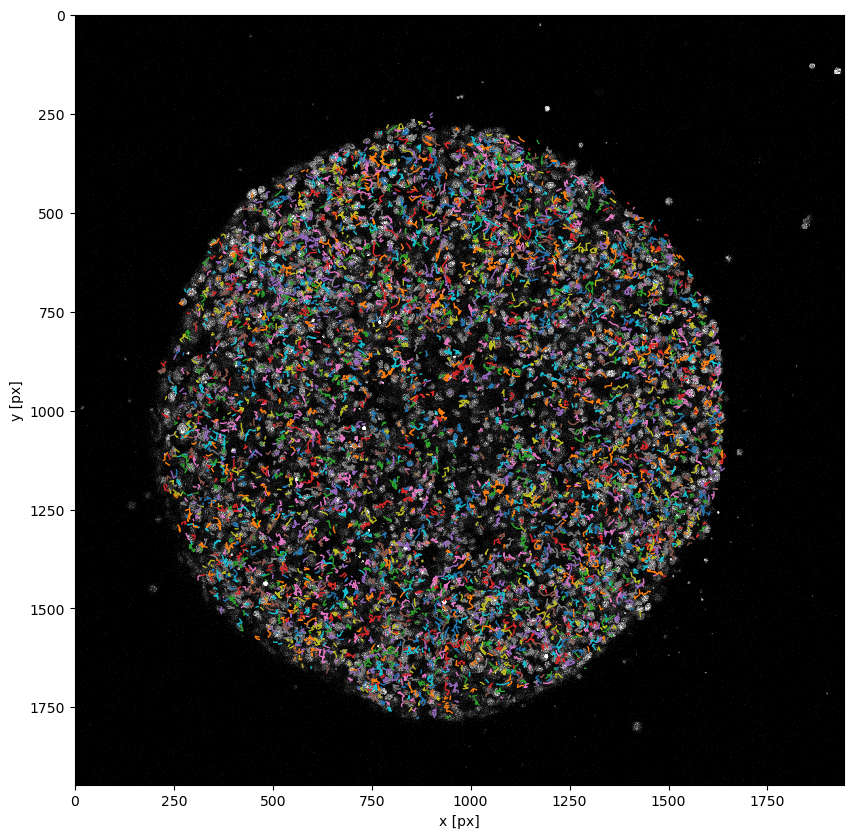

<Axes: xlabel='x [px]', ylabel='y [px]'>

In [129]:
plt.figure(figsize=(10,10))
tp.plot_traj(stack.tracked_centroids, superimpose=stack.frames[0].img[0])

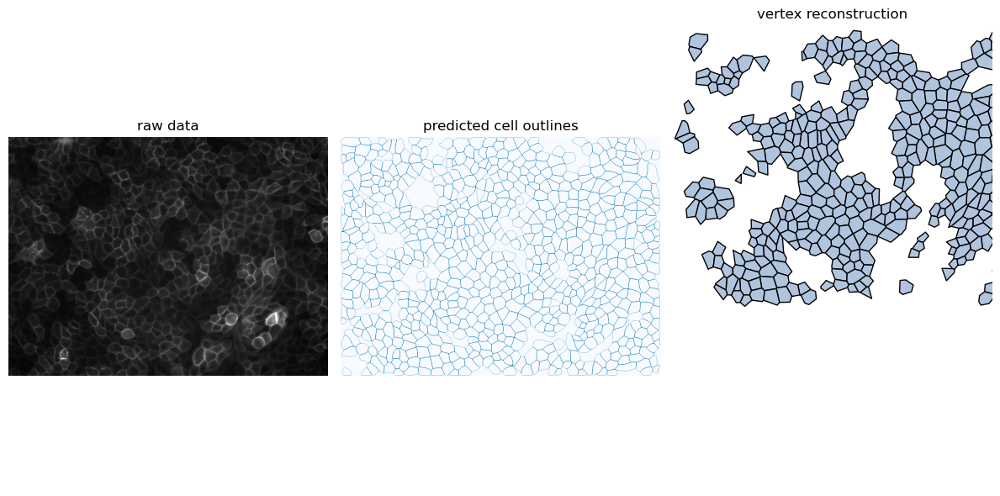

In [2]:
#file_path="Data/20230305 Coverslip Lines - Death after 6h/edited_stacks/segmented/reduced-stage_1/reduced-stage_1-01_seg.npy"
file_path="Data/FromJohn/180930 wt mdck 2mg col/1/segmented/stage_1-00_seg.npy"
image=Image(file_path)

fig = plt.figure(figsize=(12,6))

ax1 = fig.add_subplot(1,3,1)
ax1.imshow(image.img, cmap='gray')
ax1.set_title('raw data')
ax1.axis('off')

ax2 = fig.add_subplot(1,3,2)
ax2.imshow(image.outlines!=0,cmap='Blues')
ax2.set_title('predicted cell outlines')
ax2.axis('off')

ax3 = fig.add_subplot(1,3,3)
ax3.add_collection(image.cell_polygons(fc='lightsteelblue',linewidths=0.8))
ax3.set_xlim(-0.5,1205.5)
ax3.set_ylim(1682.5,-0.5)
ax3.set_title('vertex reconstruction')
ax3.axis('off')

fig.tight_layout()
plt.show()

## Get Centroids

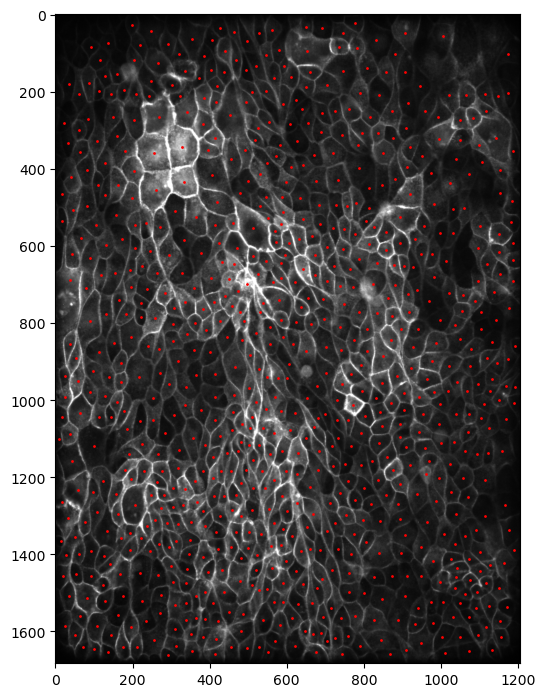

In [190]:
file_path="Data/20230305 Coverslip Lines - Death after 6h/edited_stacks/segmented/reduced-stage_1/reduced-stage_1-01_seg.npy"
image=Image(file_path)
plt.figure(figsize=(6,10))
plt.imshow(image.img,'gray')
plt.scatter(image.centroids()[:,1],image.centroids()[:,0],s=1,c='r')

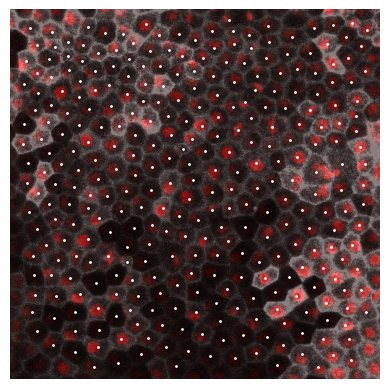

In [113]:
frame=xenopus_ctrl.stacks[-1].frames[0]
image_grayscale=np.repeat(frame.img[:,:,1], 3, axis=1).reshape(512,512,3)/2
image_grayscale[:,:,0]+=frame.img[:,:,0]/2
plt.imshow(image_grayscale)
plt.axis('off')

plt.scatter(frame.centroids()[:,1],frame.centroids()[:,0],s=1,c='white')
plt.show()

In [208]:
for stage in np.arange(1,17):
    stack_location="Data/20230305 Coverslip Lines - Death after 6h/edited_stacks/segmented/reduced-stage_{}/".format(stage)
    for slice_path in glob(stack_location+'*seg.npy') :
        slice_number=slice_path[-10:-8]
        image=Image(slice_path)
        plt.figure(figsize=(6,10))
        plt.imshow(image.img,'gray')
        plt.scatter(image.centroids()[:,1],image.centroids()[:,0],s=1,c='r')
        if not os.path.exists('Data/20230305 Coverslip Lines - Death after 6h/stage_{}-centroids'.format(stage)):
            os.mkdir('Data/20230305 Coverslip Lines - Death after 6h/stage_{}-centroids'.format(stage))
        plt.savefig("Data/20230305 Coverslip Lines - Death after 6h/stage_{0}-centroids/stage_{0}-centroids-".format(stage)+slice_number+'.tif',dpi=300)
        plt.close()

## Get TCJs

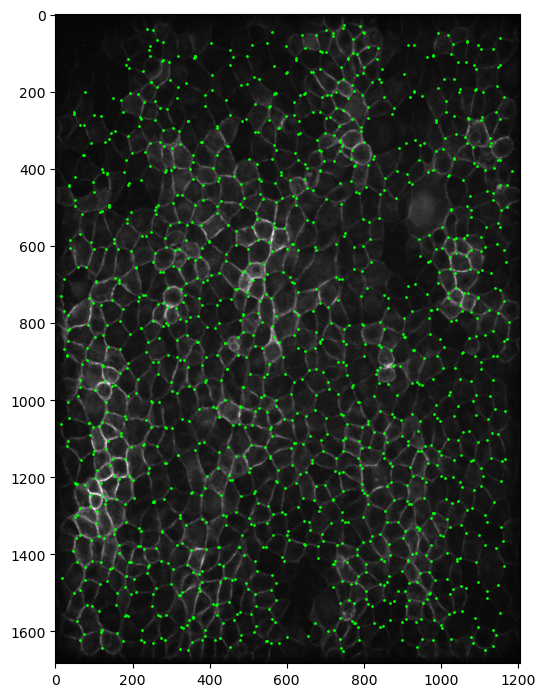

In [16]:
file_path="Data/20230305 Coverslip Lines - Death after 6h/edited_stacks/segmented/reduced-stage_1/reduced-stage_1-01_seg.npy"
image=test_img
image.get_TCJs()
plt.figure(figsize=(6,10))
plt.imshow(image.img,'gray')
plt.scatter(image.TCJs[:,1],image.TCJs[:,0],s=1,c='lime')

## TCJ anisotropy

In [106]:
image.good_cells()[0].TCJ_axis()

-0.2846697246531727

(array([ 2.,  4., 14., 17., 17., 26., 37., 46., 37., 31., 35., 36., 32.,
        40., 32., 20., 21., 29., 20., 13., 16., 15., 12., 12., 10., 10.,
         7.,  4.,  2.,  1.]),
 array([0.07683162, 0.1070219 , 0.13721218, 0.16740246, 0.19759274,
        0.22778302, 0.2579733 , 0.28816358, 0.31835386, 0.34854414,
        0.37873442, 0.4089247 , 0.43911498, 0.46930526, 0.49949554,
        0.52968582, 0.5598761 , 0.59006638, 0.62025665, 0.65044693,
        0.68063721, 0.71082749, 0.74101777, 0.77120805, 0.80139833,
        0.83158861, 0.86177889, 0.89196917, 0.92215945, 0.95234973,
        0.98254001]),
 <BarContainer object of 30 artists>)

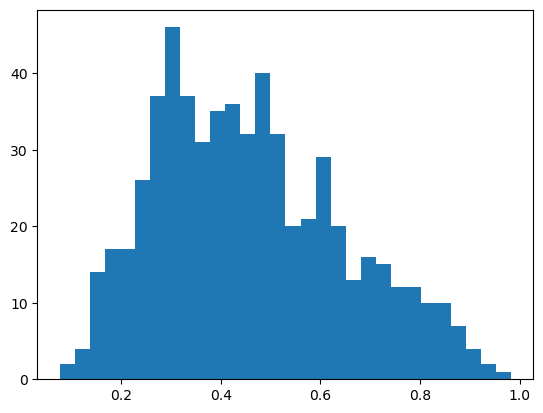

In [100]:
cs=[]
for cell in image.good_cells():
    outline=cell.outline
    TCJs=np.flip(cell.sorted_vertices, axis=1)
    CoM_J=TCJs.mean(axis=0)
    
    a = [np.outer(junction-CoM_J,junction-CoM_J) for junction in TCJs]
    S=np.mean(a, axis=0)
    l, eigen = np.linalg.eig(S)
    circularity=np.min([l[0]/l[1],l[1]/l[0]])

    shapeAxis=eigen.T[np.argmax(l)]
    theta=-np.arctan2(*np.flip(shapeAxis))
    
    cs.append(circularity)

plt.hist(cs, bins=30)

In [54]:
np.flip(stack.frames[5].cells[221].sorted_vertices, axis=1).mean(axis=0)

array([ 731.83333333, 1018.16666667])

In [55]:
np.flip(stack.frames[5].cells[221].sorted_vertices.mean(axis=0))

array([ 731.83333333, 1018.16666667])

C:\Users\Andy\AppData\Local\Temp\ipykernel_6676\1847574631.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(5,5))


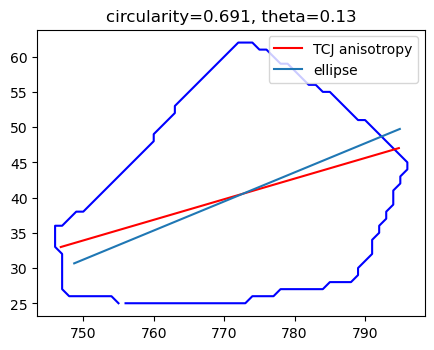

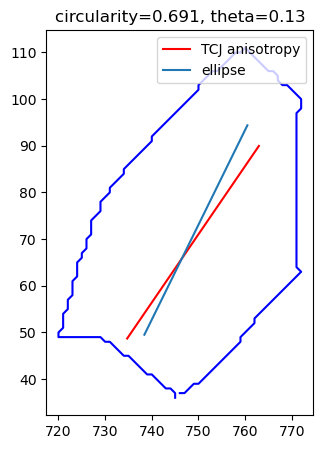

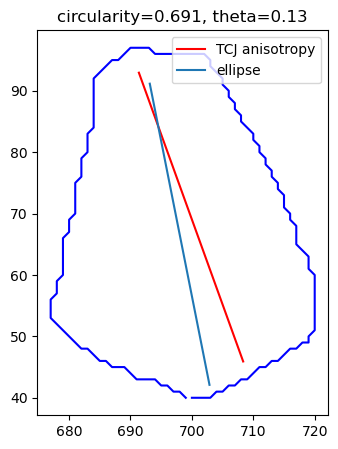

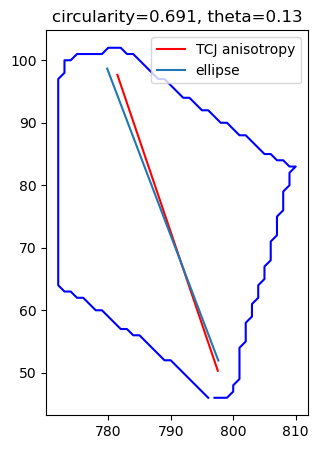

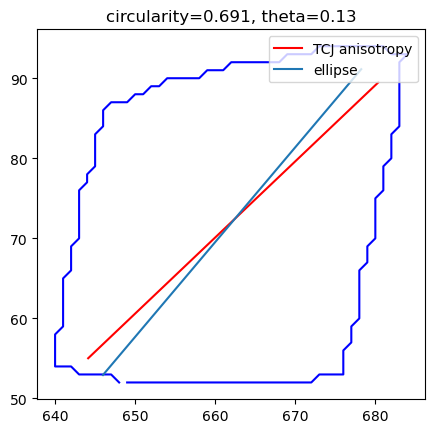

...

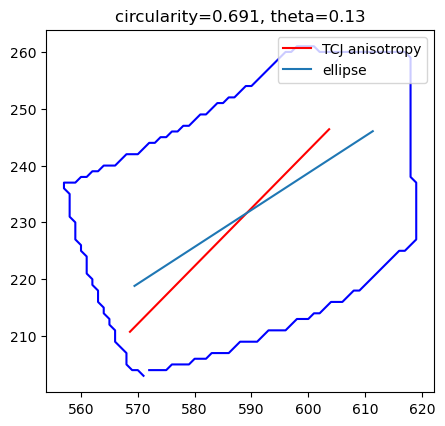

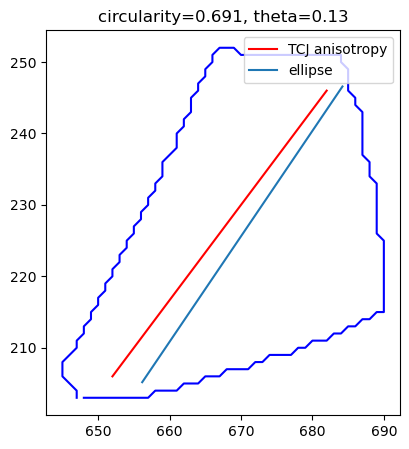

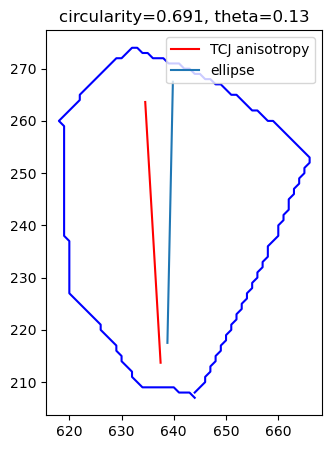

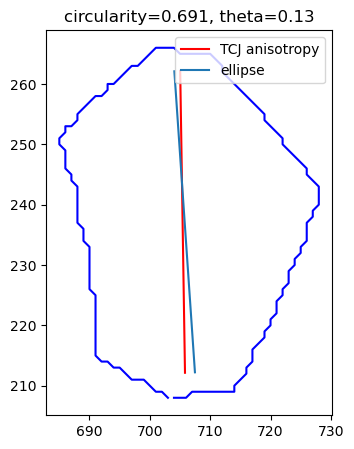

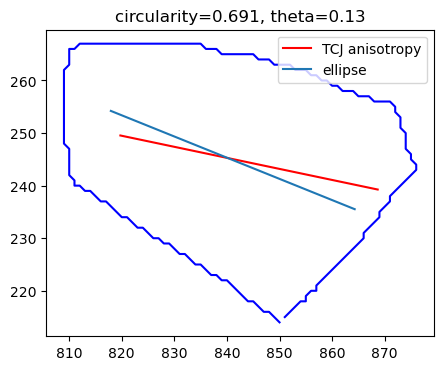

In [112]:
for cell in image.cells[:100]:
    if not cell.TCJ_axis():
        continue
    CoM_J=np.flip(cell.sorted_vertices.mean(axis=0))
    outline=cell.outline
    
    plt.figure(figsize=(5,5))
    ax=plt.subplot(aspect='equal')
    plt.plot(*outline.T, color='blue')
    
    TCJ_vector=np.array([np.cos(cell.TCJ_theta),-np.sin(cell.TCJ_theta)])
    plt.plot(*(CoM_J+np.array([TCJ_vector, -TCJ_vector])*25).T, label='TCJ anisotropy', color='r')
    
    cell.fit_ellipse()
    ellipse_vector=np.array([np.cos(cell.theta),np.sin(cell.theta)])
    plt.plot(*(np.flip(cell.centroid)+np.array([ellipse_vector, -ellipse_vector])*25).T, label='ellipse')
    
    plt.legend(loc='upper right')

    plt.title('circularity={:.3f}, theta={:.2f}'.format(circularity, theta))

150


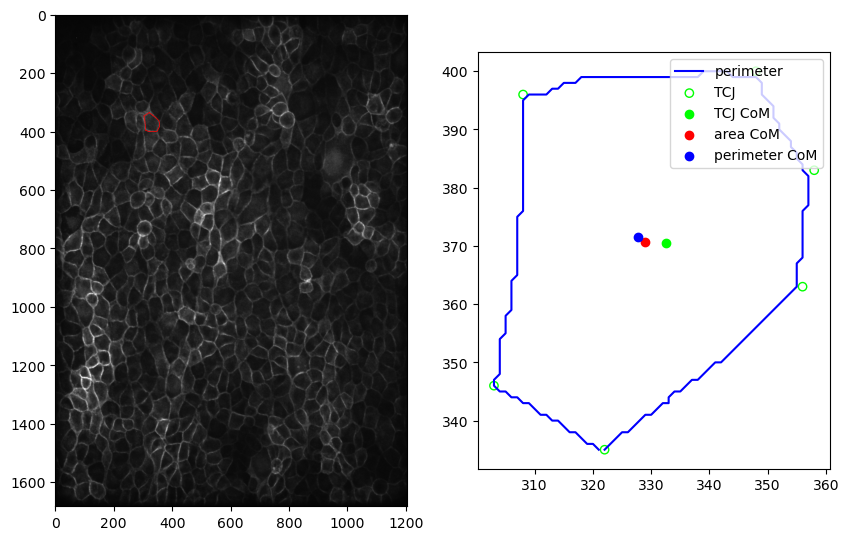

In [105]:
image=Image('F:/Cell Stretcher Project/Segmentation/20230508 halo glass lines incubator - good glass/segmented/stage_1/stage_1-membrane-00_seg.npy', load_img=True)
image.get_TCJs()
n=image.good_cell_indices[100]
print(n)
cell=image.cells[n]

fig, axes = plt.subplots(1,2,figsize=(10,16))

TCJs=np.flip(cell.sorted_vertices, axis=1)
outline=cell.outline
mask=np.flip(np.where(image.masks==n+1),axis=0).T

for ax in axes:
    axes[0].imshow(image.img, cmap='gray')
    ax.plot(*outline.T, color='r', linewidth=0.5)
axes[1].set_aspect('equal','box')
axes[1].plot(*outline.T, color='blue', label='perimeter')
axes[1].scatter(*TCJs.T, fc='none', ec='lime', label='TCJ')


CoM_J=TCJs.mean(axis=0)
CoM_A=np.flip(cell.centroid)
CoM_P=cell.outline.mean(axis=0)

axes[1].scatter(*CoM_J, color='lime', label='TCJ CoM')
axes[1].scatter(*CoM_A, color='r', label='area CoM')
axes[1].scatter(*CoM_P, color='blue', label='perimeter CoM')

axes[1].legend(loc='upper right')

(178, 2, 2)
(2642, 2, 2)
(6, 2, 2)
[array([-0.66145901, -0.74998131]), array([-0.663681  , -0.74801573]), array([-0.6678258 , -0.74431761])]


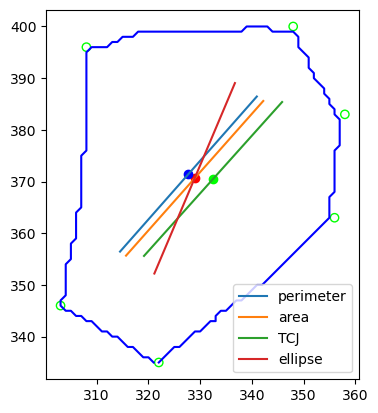

In [79]:
shapeAxis=[]
theta=[]
circularity=[]


for CoM, points in zip([CoM_P, CoM_A, CoM_J], [outline,mask,TCJs]):
    a = [np.outer(junction,junction) for junction in points]
    print(np.array(a).shape)
    S=np.mean(a, axis=0)
    l, eigen = np.linalg.eig(S)
    circularity.append(np.max([l[0]/l[1],l[1]/l[0]]))
    
    shapeAxis.append(eigen.T[np.argmax(l)])
    theta.append(-np.arctan2(*np.flip(shapeAxis[-1])))

print(shapeAxis)
plt.gca().set_aspect('equal','box')

plt.plot(*cell.outline.T, color='blue')
plt.scatter(*TCJs.T, fc='none', ec='lime')  


#plt.ylim(1210.45,1102.55)
#plt.xlim(177.85, 257.15)

plt.scatter(*CoM_J, color='lime')
plt.scatter(*CoM_A, color='r')
plt.scatter(*CoM_P, color='blue')

# add my old fit ellipse method
cell.fit_ellipse()
shapeAxis.append(np.array([np.cos(cell.theta),np.sin(cell.theta)]))

for CoM, vector, label in zip([CoM_P, CoM_A, CoM_J, CoM_A], shapeAxis, ['perimeter','area','TCJ','ellipse']):
    plt.plot(*(CoM+np.array([vector, -vector])*20).T, label=label)

plt.legend(loc='lower right')

In [192]:
eigen_J

array([[-0.99402772, -0.10912786],
       [ 0.10912786, -0.99402772]])

In [179]:
lambda_J

array([ 534.54601465, 1129.61725066])

100%|██████████████████████████████████████████████████████████████████████████████████| 16/16 [00:08<00:00,  1.97it/s]


In [122]:
np.mean(a, axis=0)

array([[917.2244898 , 411.02040816],
       [411.02040816, 184.18367347]])

In [119]:
np.outer(TCJs-CoM_J,TCJs-CoM_J)

array([[  917.2244898 ,   411.02040816,   493.2244898 ,  1349.87755102,
         -445.63265306,  1471.02040816,  -990.7755102 ,  -315.83673469,
         -869.63265306,  -739.83673469,   281.2244898 , -1224.40816327,
          614.36734694,  -951.83673469],
       [  411.02040816,   184.18367347,   221.02040816,   604.89795918,
         -199.69387755,   659.18367347,  -443.97959184,  -141.53061224,
         -389.69387755,  -331.53061224,   126.02040816,  -548.67346939,
          275.30612245,  -426.53061224],
       [  493.2244898 ,   221.02040816,   265.2244898 ,   725.87755102,
         -239.63265306,   791.02040816,  -532.7755102 ,  -169.83673469,
         -467.63265306,  -397.83673469,   151.2244898 ,  -658.40816327,
          330.36734694,  -511.83673469],
       [ 1349.87755102,   604.89795918,   725.87755102,  1986.6122449 ,
         -655.83673469,  2164.89795918, -1458.12244898,  -464.81632653,
        -1279.83673469, -1088.81632653,   413.87755102, -1801.95918367,
          904

## Vertex reconstruction

In [13]:
stack=Stack('C:/Users/Andy/Desktop/stage_21')

In [3]:
stack=Stack(r'F:\Amanda\ZO-1\segmented\zo1_48hr_circle_1_MAX')

C:\Users\Andy\AppData\Local\Temp\ipykernel_16576\3625761246.py:520: RuntimeWarning: overflow encountered in scalar subtract
  self.area=0.5*np.abs(np.dot(self.outline.T[0],np.roll(self.outline.T[1],1))-np.dot(self.outline.T[1],np.roll(self.outline.T[0],1)))


In [54]:
stack=Stack(datasets['good_glass_unpatterned'][0], coarse_grain=1, load_img=True)

In [37]:
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
from pathlib import Path

# new, gradient demo seg
def demo_seg(stack, stack_name, highlight_mitoses=True, figsize=6, FUCCI=False):
    with plt.style.context('dark_background'):
        if highlight_mitoses:
            if not hasattr(stack, 'mitoses'):
                stack.get_mitoses()#circ_limit=0,bbox_scale=1)

            extended_mitoses, daughter_CoMs, death_frames = [], [], []
            for m in stack.mitoses:
                graphical_centroids=[stack.frames[frame].centroids()[cell_number] for frame, cell_number in np.array(m.iloc[1:].reset_index()[['frame','cell_number']])] # pull centroids of daughters, not drift-corrected
                daughter_CoMs.append(np.flip(np.mean(graphical_centroids, axis=0))) # get daughter CoM (np.flipped to x,y order for plotting)
                death_frames.append(m.index.get_level_values(1)[0])
                particle_IDs=m.index.get_level_values(0)

                mother=stack.tracked_centroids[stack.tracked_centroids['particle']==particle_IDs[0]]
                mother_firstframe=mother.frame.max()-5
                mother=mother[mother['frame']>=mother_firstframe]
                mother['alpha']=(mother.frame-mother.frame.min()+1)/6
                mother['color']='r'
                extended_mitoses.append(mother)

                for daughter_ID in particle_IDs[1:]:
                    daughter=stack.tracked_centroids[stack.tracked_centroids['particle']==daughter_ID]
                    daughter_firstframe=daughter.frame.min()+5
                    daughter=daughter[daughter['frame']<=daughter_firstframe]
                    daughter['alpha']=(daughter.frame.max()-daughter.frame+1)/6
                    daughter['color']='lime'
                    extended_mitoses.append(daughter)

            extended_mitoses=pd.concat(extended_mitoses)
            extended_mitoses=extended_mitoses.set_index(['particle','frame'])
            daughter_CoMs=pd.DataFrame(daughter_CoMs, columns=['x','y'], index=death_frames)

            # fetch graphical cell centroids (not drift-corrected)
            cell_centroids=[]
            for cell in extended_mitoses.reset_index()[['frame','cell_number']].iterrows():
                cell_centroids.append(stack.frames[cell[1]['frame']].centroids()[cell[1]['cell_number']])
            extended_mitoses[['y','x']]=pd.DataFrame(cell_centroids, columns=['y','x'], index=extended_mitoses.index)
        
        for n, frame in enumerate(tqdm(stack.frames)):
            frame.get_TCJs()
            if not hasattr(frame, 'img'):
                frame.load_img()
            aspect=np.divide(*frame.img.shape[:2])
            fig, [ax1,ax2,ax3] = plt.subplots(1,3, sharey=True, sharex=True, figsize=(figsize*3, figsize*aspect*1.1))

            if frame.img.ndim==2:
                ax1.imshow(frame.img, cmap='gray')
            elif FUCCI==True:
                ax1.imshow(frame.img[...,2], cmap='gray')
            else:
                ax1.imshow(frame.img)
                
            ax1.set_title('image data')
            ax1.set_xticks([])
            ax1.set_yticks([])

            ax2.imshow(frame.outlines.todense()!=0,cmap='gray')
            ax2.set_title('segmented cell outlines')
            ax2.set_xticks([])
            ax2.set_yticks([])

            ax3.add_collection(frame.cell_polygons(fc='pink',linewidths=0.5))
            
            if highlight_mitoses:
                # redraw mitotic cells in red and green
                cell_polygons, facecolors, alphas = [], [], []
                if np.any(extended_mitoses.index.get_level_values(1)==n):
                    cells_to_outline=extended_mitoses.xs(n,level='frame')
                    for _, cell in cells_to_outline.iterrows():
                        ax1.scatter(cell['x'], cell['y'], alpha=cell['alpha'], fc=cell['color'], ec='k', s=figsize/4, linewidth=0.2)
                        ax2.scatter(cell['x'], cell['y'], alpha=cell['alpha'], fc=cell['color'], ec='k', s=figsize/4, linewidth=0.2)
                        try:
                            vertices=frame.cells[cell['cell_number']].sorted_vertices
                        except AttributeError:
                            continue
                        vertices=np.array([vertices[:,1],vertices[:,0]]).T # flip x and y for plotting
                        cell_polygons.append(Polygon(vertices))
                        facecolors.append(cell['color'])
                        alphas.append(cell['alpha'])
                    if len(cell_polygons)>0:
                        mitotic_polygons=PatchCollection(cell_polygons, edgecolors='k',facecolors=facecolors, alpha=alphas, linewidths=0.5)
                        ax3.add_collection(mitotic_polygons)
            
            ax3.set_title('vertex reconstruction')
            ax3.set_xticks([])
            ax3.set_yticks([])
            ax3.set_aspect('equal')
            folder_path=Path(f'plots/demo_seg/{stack_name}/')
            folder_path.mkdir(exist_ok=True, parents=True)
            fig.tight_layout()
            plt.savefig(folder_path/f'{stack_name}-{n:03}.tif',dpi=600)
            plt.close()

In [39]:
help(stack.get_mitoses)

Help on method get_mitoses in module monolayer_tracking.segmented_comprehension:

get_mitoses(persistence_threshold=0, distance_threshold=None, retrack=False, weights=None, biases=None, score_cutoff=1, **kwargs) method of monolayer_tracking.segmented_comprehension.Stack instance
    Detect potential mitotic events in the cell tracking data.
    
    Args:
        persistence_threshold (int, optional): Minimum duration daughter cells must be present after division. Defaults to 0.
        distance_threshold (float, optional): Maximum distance threshold for considering a cell division. If not provided, it is automatically set based on cell area statistics.
        retrack (bool, optional): If True, forces the function to retrack the data. Defaults to False.
        biases (array-like, optional): Biases used in mitosis scoring. Defaults set using manually labeled MDCK data.
        weights (array-like, optional): Weights used in mitosis scoring. Defaults set using manually labeled MDCK dat

In [41]:
stack.get_mitoses(score_cutoff=10)
len(stack.mitoses)

585

In [38]:
demo_seg(stack, 'expanding_colony', highlight_mitoses=True, figsize=10, FUCCI=True)

  0%|          | 0/36 [00:00<?, ?it/s]

In [4]:
import plot_tools
plot_tools.plot_trajectories(stack, output_path='C:/Users/Andy/Desktop/tracking/', figsize=20)

100%|██████████| 16/16 [09:55<00:00, 37.25s/it]


In [17]:
stack.frames[0].img.ndim

2

In [13]:
stack.load_img()

In [52]:
stack.frames[0].img[...,2].shape

(1586, 1125)

In [53]:
demo_seg(stack, '20240310 FUCCI', FUCCI=True)

  0%|          | 0/122 [00:00<?, ?it/s]

In [21]:
stack.track_centroids(filter_stubs=False)
stack.get_mitoses()

[                cell_number            y            x
 particle frame                                       
 3365     0             3368  2612.275255  5838.237798
 11782    1             3451  2593.533003  5842.003690
 11795    1             3525  2626.986346  5832.526207,
                 cell_number            y            x
 particle frame                                       
 4481     0             4484  3034.214494  1282.730545
 11985    1             4677  3022.421614  1263.478501
 11994    1             4730  3044.659689  1297.114622,
                 cell_number            y            x
 particle frame                                       
 7837     0             7840  4220.221786  1509.920510
 12452    1             8165  4200.783619  1506.149853
 12460    1             8276  4236.132623  1515.332835,
                 cell_number            y            x
 particle frame                                       
 9841     0             9845  5047.206055  4035.756439
 12723 

In [23]:
demo_seg(stack, 'xili_colony_stubs', highlight_mitoses=True, figsize=12)

100%|██████████| 16/16 [03:49<00:00, 14.36s/it]


In [5]:
stack.load_img(normalize=False)

In [74]:
stack=Stack(datasets['July_PDMS_unpatterned'][15],load_img=True, normalize=False)

In [15]:
stack=Stack('F:/my_data/Segmentation/20240110 halo col_glass incubator/segmented/membrane-stage_1/', load_img=True)

In [6]:
for frame in stack.frames:
    frame.load_img(normalize=False)

(2, 1040, 1408)

In [45]:
for frame in stack.frames:
    img=frame.img
    #img=img/img.max(axis=1).max(axis=1).reshape(-1,1,1)
    #RGB_img=np.concatenate([img, np.zeros((1,*img.shape[1:]))])
    frame.img=np.dstack(RGB_img)

In [28]:
img

array([[[53, 49, 53, ..., 11, 12, 11],
        [47, 53, 52, ..., 14, 12, 12],
        [51, 50, 53, ..., 13, 12, 11],
        ...,
        [23, 19, 19, ..., 15, 14, 13],
        [19, 21, 22, ..., 13, 12, 14],
        [20, 22, 19, ..., 16, 13, 12]],

       [[58, 65, 77, ...,  5, 11,  3],
        [51, 71, 76, ...,  9,  2,  4],
        [63, 73, 67, ...,  7,  4,  7],
        ...,
        [ 0, 12,  9, ..., 11,  3,  7],
        [ 2,  4,  8, ..., 12,  4,  4],
        [ 4,  0,  1, ..., 10,  0,  6]]], dtype=uint16)

In [37]:
plt.imshow(np.dstack(RGB_img))
plt.show()

array([[[0.09059829, 0.08376068, 0.09059829, ..., 0.01880342,
         0.02051282, 0.01880342],
        [0.08034188, 0.09059829, 0.08888889, ..., 0.02393162,
         0.02051282, 0.02051282],
        [0.08717949, 0.08547009, 0.09059829, ..., 0.02222222,
         0.02051282, 0.01880342],
        ...,
        [0.03931624, 0.03247863, 0.03247863, ..., 0.02564103,
         0.02393162, 0.02222222],
        [0.03247863, 0.03589744, 0.03760684, ..., 0.02222222,
         0.02051282, 0.02393162],
        [0.03418803, 0.03760684, 0.03247863, ..., 0.02735043,
         0.02222222, 0.02051282]],

       [[0.05529075, 0.06196378, 0.07340324, ..., 0.00476644,
         0.01048618, 0.00285987],
        [0.04861773, 0.06768351, 0.07244995, ..., 0.0085796 ,
         0.00190658, 0.00381316],
        [0.0600572 , 0.06959009, 0.06387035, ..., 0.00667302,
         0.00381316, 0.00667302],
        ...,
        [0.        , 0.01143947, 0.0085796 , ..., 0.01048618,
         0.00285987, 0.00667302],
        [0.0

In [44]:
frame.img.shape

(3, 1040, 1408)

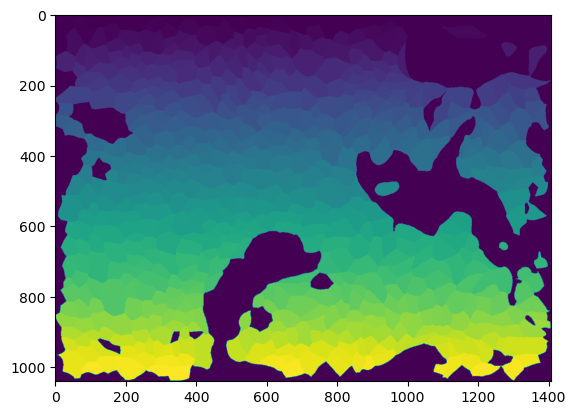

In [14]:
plt.imshow(stack.frames[10].masks)
plt.show()

In [46]:
demo_seg(stack, 'heather_incucyte', highlight_mitoses=False)

100%|██████████| 30/30 [00:25<00:00,  1.16it/s]


In [24]:
#stack.get_mitoses(filter_stubs=False)
mitoses=pd.concat(stack.mitoses)
mitoses.to_csv('PCA/JulyPDMS_stage21/mitoses.csv', index=False)

In [21]:
stack.tracked_centroids.sort_values(['frame', 'cell_number']).to_csv('PCA/JulyPDMS_stage21/tracking.csv', index=False)

In [48]:
stack.tracking_range

20.620134666272232

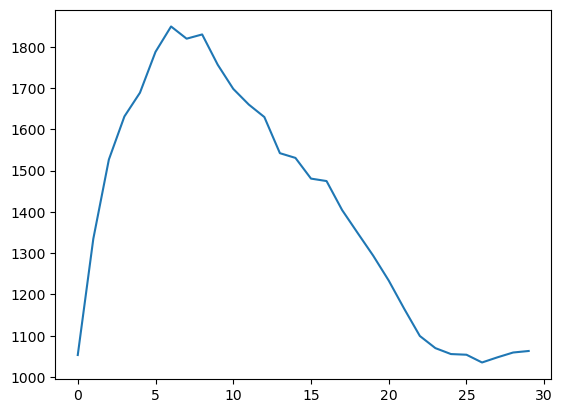

In [64]:
plt.plot([frame.mean_cell_area(scaled=False) for frame in stack.frames])
plt.show()

In [65]:
np.sqrt(1900)

43.58898943540674

In [66]:
t=tp.link(stack.centroids(), search_range=19)
t=tp.subtract_drift(t)

In [67]:
stack.tracked_centroids=t

In [74]:
stack.frames[0].img.shape

(1040, 1408, 3)

In [75]:
import plot_tools
import importlib

importlib.reload(plot_tools)
plot_tools.plot_trajectories(stack, output_path='plots/tracking/heather_incucyte', trail_length=10)

  0%|          | 0/30 [00:00<?, ?it/s]

100%|██████████| 30/30 [01:45<00:00,  3.53s/it]


In [ ]:
daughter_cell_polygons=[]
for daughter_cell in [frame.cells[cell_number] for cell_number in daughters.xs(n, level='frame').cell_number]:
    # fill polygons on ax3
    try:
        vertices=frame.cells[cell.cell_number].sorted_vertices
    except AttributeError:
        continue
    vertices=np.array([vertices[:,1],vertices[:,0]]).T # flip x and y for plotting
    daughter_cell_polygons.append(Polygon(vertices))
daughter_cell_collection=PatchCollection(daughter_cell_polygons, edgecolor='k',facecolor='lime',linewidths=0.5)
ax3.add_collection(daughter_cell_collection)

In [89]:
extended_mitoses=[] # get the cell tracking info for frames surrounding each mitotic event
daughter_CoMs=[]
death_frames=[]

for m in stack.mitoses:
    graphical_centroids=[stack.frames[frame].centroids()[cell_number] for frame, cell_number in np.array(m.iloc[1:].reset_index()[['frame','cell_number']])] # pull centroids of daughters, not drift-corrected
    daughter_CoMs.append(np.flip(np.mean(graphical_centroids, axis=0))) # get daughter CoM (np.flipped to x,y order for plotting)
    death_frames.append(m.index.get_level_values(1)[0])
    particle_IDs=m.index.get_level_values(0)

    mother=stack.tracked_centroids[stack.tracked_centroids['particle']==particle_IDs[0]]
    mother_firstframe=mother.frame.max()-5
    mother=mother[mother['frame']>=mother_firstframe]
    mother['alpha']=(mother.frame-mother.frame.min()+1)/6
    mother['color']='r'
    extended_mitoses.append(mother)

    for daughter_ID in particle_IDs[1:]:
        daughter=stack.tracked_centroids[stack.tracked_centroids['particle']==daughter_ID]
        daughter_firstframe=daughter.frame.min()+5
        daughter=daughter[daughter['frame']<=daughter_firstframe]
        daughter['alpha']=(daughter.frame.max()-daughter.frame+1)/6
        daughter['color']='lime'
        extended_mitoses.append(daughter)

extended_mitoses=pd.concat(extended_mitoses)
extended_mitoses=extended_mitoses.set_index(['particle','frame'])
daughter_CoMs=pd.DataFrame(daughter_CoMs, columns=['x','y'], index=death_frames)

# fetch graphical cell centroids (not drift-corrected)
cell_centroids=[]
for cell in extended_mitoses.reset_index()[['frame','cell_number']].iterrows():
    cell_centroids.append(stack.frames[cell[1]['frame']].centroids()[cell[1]['cell_number']])
extended_mitoses[['y','x']]=pd.DataFrame(cell_centroids, columns=['y','x'], index=extended_mitoses.index)

In [107]:
cell

cell_number            415
y              1469.044058
x               123.468333
alpha             0.166667
color                    r
Name: 383, dtype: object

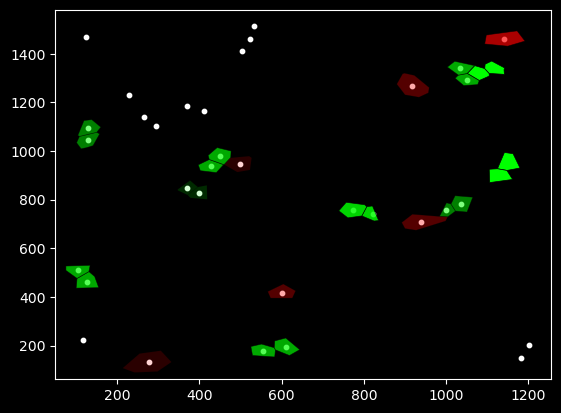

In [108]:
from matplotlib import collections
n=10
frame=stack.frames[n]
with plt.style.context('dark_background'):
    if np.any(extended_mitoses.index.get_level_values(1)==n):
        cells_to_outline=extended_mitoses.xs(n,level='frame')
        plt.scatter(cells_to_outline['x'],cells_to_outline['y'], s=10, color='white')
        cell_polygons=[]
        facecolors=[]
        alphas=[]
        for index, cell in cells_to_outline.iterrows():
            cell_number=int(cell['cell_number'])
            #plt.scatter(cell['x'], cell['y'], alpha=cell['alpha'], color=cell['color'], s=2)
            try:
                vertices=frame.cells[cell_number].sorted_vertices
            except AttributeError:
                continue
            vertices=np.array([vertices[:,1],vertices[:,0]]).T # flip x and y for plotting
            cell_polygons.append(Polygon(vertices))
            facecolors.append(cell['color'])
            alphas.append(cell['alpha'])
        mitotic_polygons=PatchCollection(cell_polygons, edgecolors='k',facecolors=facecolors, alpha=alphas, linewidths=0.5)
        plt.gca().add_collection(mitotic_polygons)
    plt.show()

In [163]:
for coarse_grain_resolution in np.arange(2,31,4):
    stack=Stack(datasets['xenopus_unstretched_ctrl'][0], coarse_grain=coarse_grain_resolution, load_img=True)
    for quantile in np.linspace(0.8,0.99,5):
        try:
            stack.track_centroids(v_quantile=quantile)
        except tp.SubnetOversizeException:
            continue

        stack_name='xenopus_{0}_coarse{1}-trange{2:.2f}-mitoses{3}'.format(stack.name.split('_')[2], coarse_grain_resolution, stack.tracking_range, len(stack.get_mitoses(circ_limit=0,bbox_scale=1)))

        demo_seg(stack, stack_name)
        plt.close('all')

100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:14<00:00,  1.34s/it]


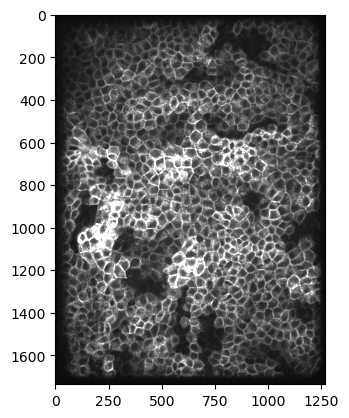

In [212]:
plt.imshow(stack.frames[-5].img, cmap='gray', vmax=1500)

In [25]:
xenopus_ctrl.stacks[-1].load_img(normalize=False)

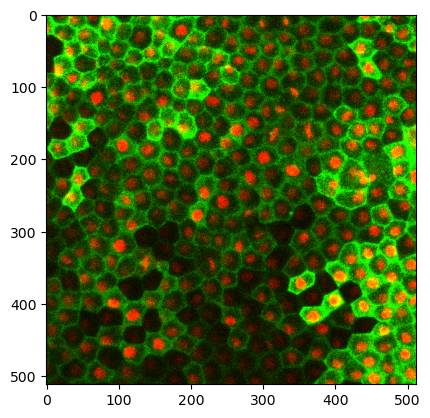

In [24]:
plt.imshow(xenopus_ctrl.stacks[-1].frames[0].img)
plt.show()

In [39]:
len(xenopus_ctrl.stacks[-1].get_mitoses(circ_limit=0, bbox_scale=0.7))

14

In [40]:
demo_seg(xenopus_ctrl.stacks[-1], 'xenopus_ctrl')

100%|█████████████████████████| 65/65 [00:17<00:00,  3.77it/s]


In [ ]:
xenopus_ctrl.stacks[-1].get_mitoses(circ_limit=0, bbox_scale=1)

(1682.5, -0.5)

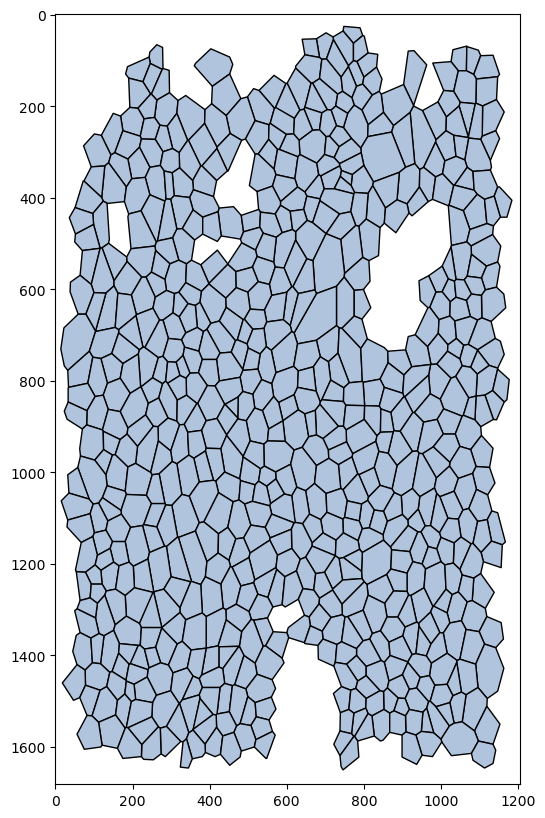

In [37]:
from matplotlib.collections import LineCollection, PatchCollection
from matplotlib.patches import Polygon

image=Image('F:/Cell Stretcher Project/Segmentation/20230508 halo glass lines incubator - good glass/segmented/stage_1/stage_1-membrane-00_seg.npy')
image.get_TCJs()
fig=plt.figure(figsize=(6,10))
ax=fig.add_subplot()
#plt.imshow(image.img,'gray')
ax.add_collection(image.cell_polygons(linewidths=0.8))
plt.xlim(-0.5,1205.5)
plt.ylim(1682.5,-0.5)

## Particle Tracks
For visualization and debugging: plots each frame with labeled detected particle tracks. (trackpy has a function for this but it's 1. quite messy and 2. incompatible with savefig because it must use plt.show() in the backend or something.)

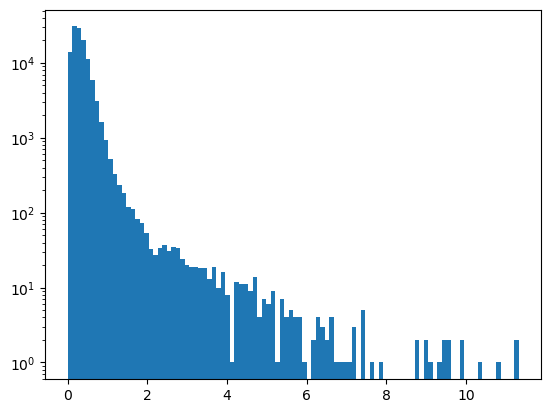

In [150]:
stack=xenopus_ctrl.stacks[-1]
stack.track_centroids(search_range=15)
stack.get_velocities()

plt.hist(stack.velocities['v'], bins=100)
plt.yscale('log')
plt.show()

In [263]:
stack.tracked_centroids=tp.link(stack.centroids(), search_range=8)

In [246]:
np.nanquantile(stack.velocities['v'],0.995)

3.330286097969071

In [244]:
np.nanmax(stack.velocities['v'])

14.979039463986394

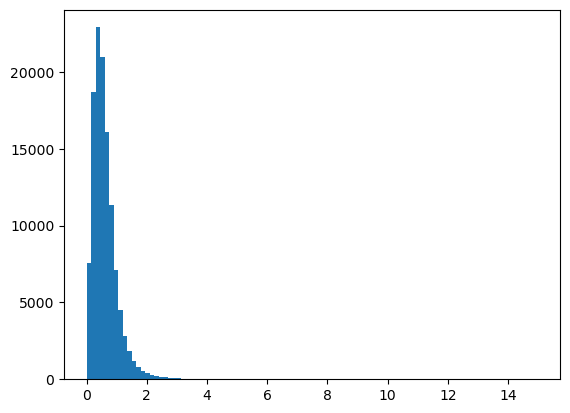

In [191]:
plt.hist(velocities, bins=100)
plt.show()

In [9]:
def plot_trajectories(stack, **kwargs):
    from pathlib import Path
    import matplotlib.patheffects as patheffects
    from matplotlib import collections
    if not hasattr(stack, 'tracked_centroids'):
        stack.track_centroids(**kwargs)
    trajectories=stack.tracked_centroids
    
    for n, frame in enumerate(tqdm(stack.frames)):
        plt.figure(figsize=(15,10))
        ax=plt.axes()
        
        # grayscale membrane, red nuclei
        #image_grayscale=np.repeat(frame.img[:,:,1], 3, axis=1).reshape(512,512,3)/2
        #image_grayscale[:,:,0]+=frame.img[:,:,0]/2
        #plt.imshow(image_grayscale)
        plt.imshow(frame.img, cmap='gray')
        
        trails=[] # particle trajectories as plotted on each frame
        for particle, trajectory in trajectories[trajectories.frame<=n].groupby('particle'): # get tracking data up to the current frame for one particle at a time
            trails.append(Polygon(trajectory[['x','y']].iloc[-10:], closed=False, fc='None', ec='C{}'.format(particle)))

            in_frame=trajectory.index[trajectory['frame']==n] # get the cell number of the particle in this frame

            try: # try labeling this particle in this frame
                cell_number=in_frame[0] # cell number
                # TODO: I think the bottleneck is indexing and plotting every text label by hand: can I speed this up somehow? (or I just don't do this too often)
                particle_label=plt.text(trajectory['x'].loc[cell_number]+5,trajectory['y'].loc[cell_number]-5,particle, color='white', fontsize=5)
                particle_label.set_path_effects([patheffects.Stroke(linewidth=3, foreground='C{}'.format(particle)),patheffects.Normal()])

            except IndexError: # indexerror means the particle's not identifiable in this frame, move on
                continue

        # draw trails
        ax.add_artist(collections.PatchCollection(trails, match_original=True))
        
        # add centroids
        plt.scatter(frame.centroids()[:,1],frame.centroids()[:,0],s=1,c='white')
        
        # cosmetics
        plt.xlim(0,frame.resolution[1])
        plt.ylim(frame.resolution[0],0)
        plt.axis('off')
        folder_path=Path(stack.name.replace('segmented','tracking'))
        folder_path.mkdir(parents=True, exist_ok=True)

        plt.savefig(folder_path/f'{n}.tif',dpi=300)
        plt.close()

In [17]:
from pathlib import Path
Path(stack.name.replace('segmented','tracking'))/'5.tif'

WindowsPath('F:/my_data/Segmentation/JohnData/180930 star mdck 2mg col wt/tracking/WT_2/5.tif')

In [11]:
stack=Stack(datasets['JD_2mgcol2'][1], load_img=True)

In [20]:
print('test')

test


In [ ]:
stack.track_centroids(filter_stubs=False)

In [21]:
from plot_tools import plot_trajectories
plot_trajectories(stack, output_path=None, trail_length=10, figsize=10, tracking_kwargs={})

  0%|          | 0/115 [00:00<?, ?it/s]

100%|██████████| 115/115 [16:41<00:00,  8.70s/it]


In [ ]:
gastruloid.track_centroids()

In [13]:
# search range
int(max([frame.mean_cell_length() for frame in gastruloid.frames])/2)+1

5

In [18]:
t=tp.link(gastruloid.centroids(), search_range=30, memory=3)
t_corrected=tp.subtract_drift(t,tp.compute_drift(t))
t_filtered=tp.filter_stubs(t_corrected, 3)

In [20]:
gastruloid.tracked_centroids=t_filtered

In [23]:
plot_trajectories(gastruloid)

100%|████████████████████████████████████████████████████████████████████████████████| 266/266 [56:41<00:00, 12.79s/it]


In [29]:
for n, stack in enumerate(dataset.stacks):
    plot_trajectories(stack, search_range=30, memory=3)

100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [03:31<00:00,  8.80s/it]


## Velocity Fields

In [ ]:
# generate velocity fields
save_location="Segmentation/20230410 halo PDMS lines - good data/velocity_fields/"
for stage in range(2,4):
    stack_location="Segmentation/20230410 halo PDMS lines - good data/segmented/stage_{}/".format(stage)
    stack=Stack(stack_location)
    velocity_data=stack.get_velocities()
    for frame_number, frame in velocity_data.groupby('frame'):
        plt.figure(figsize=(12,16))
        plt.imshow(stack.frames[frame_number].img,cmap='gray')
        plt.quiver(frame.x, frame.y, frame.dx, -frame.dy, pivot='middle', headwidth=4, headlength=6, color='red')
        plt.axis('off')
        #plt.show()
        if not os.path.exists(save_location+'stage_{0}-velocities/'.format(stage)):
            os.makedirs(save_location+'stage_{0}-velocities/'.format(stage))
        plt.savefig(save_location+'stage_{0}-velocities/stage_{0}-velocity-{1:02}.tif'.format(stage,frame_number),dpi=300)
        plt.close()

## Identify Cell Divisions

In [66]:
from monolayer_tracking import plot_tools
import importlib

plot_tools=importlib.reload(plot_tools)

In [4]:
stack=Stack(natsorted(glob('F:/my_data/Segmentation/20240215 FUCCI halo col_glass test/segmented/FUCCI-stage_*/'))[0])

In [67]:
plot_tools.highlight_mitoses(stack)

  0%|          | 0/134 [00:00<?, ?it/s]

In [62]:
stack.frames[0].img.shape

(1669, 1234, 3)

In [25]:
linear_model(test_scores, linear_weights, linear_bias)

array([[0.4695426, 0.4695426]])

In [31]:
np.array(out)

array([[ 0.35193082],
       [ 0.4049229 ],
       [-0.85831442],
       [ 0.16262002],
       [ 0.42994872]])

In [56]:
mitoses=get_mitoses(stack)

In [57]:
len(mitoses)

234

In [54]:
def get_mitoses(self, persistence_threshold=0, distance_threshold=None, retrack=False, score_cutoff=0.5, **kwargs):
        """
        Detect potential mitotic events in the cell tracking data.

        Args:
            persistence_threshold (int, optional): Minimum duration daughter cells must be present after division. Defaults to 0.
            distance_threshold (float, optional): Maximum distance threshold for considering a cell division. If not provided, it is automatically set based on cell area statistics.
            retrack (bool, optional): If True, forces the function to retrack the data. Defaults to False.
            biases (array-like, optional): Biases used in mitosis scoring. Defaults set using manually labeled MDCK data.
            weights (array-like, optional): Weights used in mitosis scoring. Defaults set using manually labeled MDCK data.
            score_cutoff (int, optional): Threshold for considering a detected mitosis event. Defaults to 1.
            **kwargs: Additional keyword arguments to be passed to the tracking function.

        Returns:
            list: List of potential mitotic events, each represented as a DataFrame containing information about mother and daughter cells.
        """
        from scipy.spatial.distance import cdist  # Import cdist function from scipy.spatial.distance
        
        if not distance_threshold:
            # Automatically set maximum search range by cell area statistics
            distance_threshold = 1.5 * np.nanmean([np.sqrt(np.quantile(frame.cell_areas(scaled=False), 0.9)) for frame in self.frames]) 
        
        # Default mitosis scoring parameters
        #if not weights:
        #    weights = self.default_weights
        #if not biases:
        #    biases = self.default_biases
        #
        #def mitosis_score(params, weights, biases):
        #    ''' Linear function for scoring mitoses '''
        #    return np.sum(np.square((np.array(params).T - biases)) * weights, axis=1)

        norm_means=np.array([0.19036615, 0.23384234, 0.16842723, 0.12717775, 0.18187521])
        norm_vars=np.array([0.00774153, 0.00920625, 0.08352297, 0.04564848, 0.12634787])
        linear_weights=np.array([-0.7349965,-0.8832049,-1.0309228,1.0420729,-0.806389])
        linear_bias=0.3782285
        
        def mitosis_score(X):
            def linear_model(X, weights, bias):
                return np.dot([weights], X)+bias

            def normalize(X, mean, variance):
                return np.transpose((np.transpose(X)-mean)/np.sqrt(variance))

            def sigmoid(x):
                return 1/(1+np.exp(-x))

            return(sigmoid(linear_model(normalize(X, norm_means, norm_vars), linear_weights, linear_bias)).flatten())

        if retrack or not hasattr(self, 'tracked_centroids'):
            # If the data has never been tracked, or if retrack is specified
            trajectories = self.track_centroids(**kwargs)  # Run tracking again
        else:
            trajectories = self.tracked_centroids  # Use existing tracking data

        # Find when cells show up and disappear
        persistent_cells = np.where(trajectories.groupby('particle').size() > persistence_threshold)[0]
        birth_frames = trajectories[trajectories['particle'].isin(persistent_cells)].groupby('particle')['frame'].min()
        death_frames = trajectories.groupby('particle')['frame'].max()
        birth_frames = birth_frames[birth_frames != 0]  # Drop the first frame, when all cells are technically new
        birth_frames = birth_frames.loc[birth_frames.duplicated(keep=False)]  # Drop frames which only have one new cell show up (need two to be a plausible cell division)

        frames_of_interest = pd.Series(np.intersect1d(birth_frames.values, death_frames.values + 1))
        trajectories = trajectories.set_index(['particle', 'frame'])  # Make tracking data indexable by tracking info for fast identification
        
        # Look for mitoses out of potential candidates
        mitoses = []
        for frame_number in frames_of_interest:
            # Get relevant particle IDs for this frame
            birth_IDs = birth_frames[birth_frames == frame_number].index.values
            death_IDs = death_frames[death_frames == frame_number - 1].index.values

            births = trajectories.loc[zip(birth_IDs, [frame_number] * len(birth_IDs))].reset_index()
            deaths = trajectories.loc[zip(death_IDs, [frame_number - 1] * len(death_IDs))].reset_index()

            mother_candidates, daughter_candidates = np.where(cdist(deaths[['x', 'y']], births[['x', 'y']]) < distance_threshold)
            mitosis_candidates = births.iloc[daughter_candidates].copy()
            mitosis_candidates['mother_candidates'] = mother_candidates
            mitosis_candidates = mitosis_candidates[mitosis_candidates['mother_candidates'].duplicated(keep=False)]

            for mother_candidate_ID in np.unique(mitosis_candidates['mother_candidates']):
                # Parameters: m_circ, d_circ, d_distance, d_angle, d_CoM, area_ratio, area_change
                potential_daughter_IDs = mitosis_candidates[mitosis_candidates.mother_candidates == mother_candidate_ID]
                potential_mother_ID = deaths.iloc[[mother_candidate_ID]]  # Get the mother cell
                mother_cell = self.frames[potential_mother_ID['frame'].item()].cells[potential_mother_ID['cell_number'].item()]
                
                # Potential mother attributes
                m_size = np.sqrt(mother_cell.get_area())
                extended_mother = trajectories.loc[potential_mother_ID['particle']].iloc[-3:].reset_index()
                m_circ = 1 - np.max([self.frames[frame_number].cells[cell_number].get_circularity() for frame_number, cell_number in np.array(extended_mother[['frame', 'cell_number']])])
                
                # Potential daughter attributes
                d_circs = []
                d_areas = []
                for frame_number, cell_number in np.array(potential_daughter_IDs[['frame', 'cell_number']]):
                    daughter_cell = self.frames[frame_number].cells[cell_number]
                    d_circs.append(daughter_cell.get_circularity())
                    d_areas.append(daughter_cell.get_area())
                d_circs = 1 - np.array(d_circs)
                d_areas = np.array(d_areas)

                d_displacements = potential_daughter_IDs[['x', 'y']] - potential_mother_ID[['x', 'y']].values
                d_distances = np.linalg.norm(d_displacements, axis=1)
                d_angles = np.arctan2(d_displacements['y'], d_displacements['x']).to_numpy()
                
                # Score daughter pairs
                all_pairs = np.stack(np.triu_indices(len(potential_daughter_IDs), k=1), axis=-1)

                d_angle = np.abs(np.diff(d_angles[all_pairs] / np.pi, axis=1).flatten() % 2 - 1)
                d_circ = np.min(d_circs[all_pairs], axis=1)
                d_CoM = np.sum(np.array(potential_daughter_IDs[['y', 'x']])[all_pairs] * d_areas[all_pairs].reshape(-1, 2, 1), axis=1) / np.sum(d_areas[all_pairs], axis=1).reshape(-1, 1)
                CoM_displacement = np.linalg.norm(d_CoM - potential_mother_ID[['y', 'x']].values, axis=1) / m_size
                d_distance_diff = np.diff(d_distances[all_pairs]).flatten() / m_size
                m_circs = np.ones(len(all_pairs)) * m_circ
                
                # Calculate overall score and save if it passes the cutoff
                mitosis_scores = mitosis_score([m_circs, d_circ, d_distance_diff, d_angle, CoM_displacement])
                best_score = np.argmax(mitosis_scores)
                if mitosis_scores[best_score] > score_cutoff:
                    m = pd.concat([potential_mother_ID, potential_daughter_IDs.iloc[all_pairs[best_score]].drop('mother_candidates', axis=1)])
                    mitoses.append(m.set_index(['particle', 'frame']))

        self.mitoses = mitoses
        return self.mitoses

In [9]:
# highlight mitoses
import matplotlib.patheffects as patheffects
from matplotlib import collections

for stack in [stack]:
    print(stack.name)
    tqdm._instances.clear()
    
    if not hasattr(stack, 'mitoses'):
        stack.get_mitoses()
    if not hasattr(stack, 'tracked_centroids'):
        stack.track_centroids()
        
    extended_mitoses=[] # get the cell tracking info for frames surrounding each mitotic event
    
    daughter_CoMs=[]
    death_frames=[]
    for m in stack.mitoses:
        graphical_centroids=[stack.frames[frame].centroids()[cell_number] for frame, cell_number in np.array(m.iloc[1:].reset_index()[['frame','cell_number']])] # pull centroids of daughters, not drift-corrected
        daughter_CoMs.append(np.flip(np.mean(graphical_centroids, axis=0))) # get daughter CoM (np.flipped to x,y order for plotting)
        death_frames.append(m.index.get_level_values(1)[0])
        particle_IDs=m.index.get_level_values(0)

        mother=stack.tracked_centroids[stack.tracked_centroids['particle']==particle_IDs[0]]
        mother_firstframe=mother.frame.max()-5
        mother=mother[mother['frame']>=mother_firstframe]
        mother['alpha']=(mother.frame-mother.frame.min()+1)/6
        mother['color']='r'
        extended_mitoses.append(mother)

        for daughter_ID in particle_IDs[1:]:
            daughter=stack.tracked_centroids[stack.tracked_centroids['particle']==daughter_ID]
            daughter_firstframe=daughter.frame.min()+5
            daughter=daughter[daughter['frame']<=daughter_firstframe]
            daughter['alpha']=(daughter.frame.max()-daughter.frame+1)/6
            daughter['color']='lime'
            extended_mitoses.append(daughter)

    extended_mitoses=pd.concat(extended_mitoses)
    extended_mitoses=extended_mitoses.set_index(['particle','frame'])
    daughter_CoMs=pd.DataFrame(daughter_CoMs, columns=['x','y'], index=death_frames)
    
    # fetch graphical cell centroids (not drift-corrected)
    cell_centroids=[]
    for cell in extended_mitoses.reset_index()[['frame','cell_number']].iterrows():
        cell_centroids.append(stack.frames[cell[1]['frame']].centroids()[cell[1]['cell_number']])
    extended_mitoses[['y','x']]=pd.DataFrame(cell_centroids, columns=['y','x'], index=extended_mitoses.index)

    for frame_number, frame in enumerate(tqdm(stack.frames)):
        plt.figure(figsize=(8,12))
        plt.imshow(frame.img, cmap='gray')
        plt.axis('off')

        # label the two mitosis-identified frames with cell outlines and centroids
        if np.any(extended_mitoses.index.get_level_values(1)==frame_number):
            cells_to_outline=extended_mitoses.xs(frame_number,level='frame')
            plt.scatter(cells_to_outline['x'],cells_to_outline['y'], s=10, color='white')
            for index, cell in cells_to_outline.iterrows():
                cell_number=int(cell['cell_number'])
                
                cell_label=plt.text(frame.cells[cell_number].centroid[1],frame.cells[cell_number].centroid[0], cell_number, color=cell['color'], fontsize=5)
                cell_label.set_path_effects([patheffects.Stroke(linewidth=1, foreground='k'),patheffects.Normal()])
                
                plt.plot(frame.cells[cell_number].outline[:,0], frame.cells[cell_number].outline[:,1], alpha=cell['alpha'], color=cell['color'])
            
            # plot future CoMs of the daughter cells for reference against mother centroids
            try:
                # if any cells divide next frame, scatterplot their CoMs
                CoMs_to_plot=daughter_CoMs.xs(frame_number)
                plt.scatter(CoMs_to_plot['x'],CoMs_to_plot['y'],s=10,ec='blue',fc='none')
            except KeyError:
                pass
        stage=stack.name.split('/')[-2]
        folder_path=stack.name.replace('segmented','mitosis_highlight')
        
        if not os.path.exists(folder_path):
            os.makedirs(folder_path)
            
        plt.savefig(folder_path+'{0}-{1}.jpg'.format(stage,frame_number), dpi=300)#, bbox_inches='tight', pad_inches=0)
        plt.close()

F:/my_data/Segmentation/JohnData/180930 star mdck 2mg col wt/segmented/WT_1/


100%|██████████| 111/111 [00:53<00:00,  2.07it/s]
